In [1]:
import numpy as np
import matplotlib
matplotlib.rcParams['image.cmap'] = 'jet'
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import clear_output, display
import time as clock
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm.notebook import trange, tqdm
from diffusion_equation import compute_solution
from time import time
# from tqdm import trange
import pandas as pd
from sklearn.metrics import r2_score
import torch
from torch import nn
from torchvision import models
from train_logic import (compute_pde_residuals, create_batches, get_batch_indices, 
                         get_plot_data, plot_validation, resample_collocation_points)

In [2]:
!ls

__pycache__
build_metrics_test4.ipynb
data-100-new-two-sigma
diffusionPINN-base-7d-perm-nonlinear.ipynb
diffusion_equation.py
graphs
logs_pinn.txt
perm_2.npy
pinn-fullbatch-best-150-sigmoid-last.pth
pinn-fullbatch-best-150-sigmoid.pth
pinn-fullbatch-best-1k-sigmoid-2.pth
pinn-fullbatch-best-1k-sigmoid-4.pth
pinn-fullbatch-best-1k-sigmoid.pth
pinn-fullbatch-best-1k-softplus.pth
pinn-fullbatch-best-2k-sigmoid-2.pth
pinn-test4-250-batched-new-2.pth
pinn-test4-250-batched-new-kaggle.pth
pinn-test4-250-batched-new-kaggle2.pth
pinn-test4-250-batched-new.pth
pinn-test4-250-batched.pth
pinn_fullbatch_500-pre-trained-2.pth
pinn_fullbatch_500-pre-trained-3.pth
pinn_fullbatch_500-pre-trained-4.pth
pinn_fullbatch_500-pre-trained.pth
pinn_fullbatch_500.pth
pinn_model_weights_250-2.pth
pinn_model_weights_250-3.pth
pinn_model_weights_250-4.pth
pinn_model_weights_250.pth
pinn_model_weights_500.pth
train-indexes-2sigma-100.npy
train-indexes-2sigma-1000.npy
train-indexes-2sigma-2000.npy
train-indexes-2s

In [3]:
DEVICE = 'mps'

In [4]:
def flat_the_gradient_from_loss(model, loss):
    model.zero_grad()
    loss.backward(retain_graph=True)
    grads = []
    for p in model.parameters():
        if p.grad is not None:
            grads.append(p.grad.detach().cpu().numpy().reshape(-1))
    grad_flat = np.concatenate(grads)
    return grad_flat

def orthogonalize(v1, v2):
    dot = np.dot(v1, v2)
    proj = dot / (np.dot(v1, v1) + 1e-6) * v1
    return v2 - proj

def compute_weights_grad_orthogonal_autograd(model, loss_ic, loss_pde, loss_data, kappa=5.0, eps=1e-6):
    grad_ic   = flat_the_gradient_from_loss(model, loss_ic)
    grad_pde  = flat_the_gradient_from_loss(model, loss_pde)
    grad_data = flat_the_gradient_from_loss(model, loss_data)

    grad_pde_orth = orthogonalize(grad_ic, grad_pde)
    grad_data_orth = orthogonalize(grad_ic, grad_data)
    grad_data_orth = orthogonalize(grad_pde_orth, grad_data_orth)

    lv_ic = loss_ic.detach().cpu().numpy()
    lv_pde = loss_pde.detach().cpu().numpy()
    lv_data = loss_data.detach().cpu().numpy()

    w_ic = 1.0
    w_pde = np.exp(-kappa * lv_ic) * np.linalg.norm(grad_pde_orth)
    w_data = np.exp(-kappa * max(lv_ic, lv_pde)) * np.linalg.norm(grad_data_orth)
    w_sum = w_ic + w_pde + w_data + eps
    w_ic /= w_sum
    w_pde /= w_sum
    w_data /= w_sum


    # model.zero_grad()

    return w_ic, w_pde, w_data


# Getting data from simulator

In [5]:
# configuration of simulator
# and parametrs of reservouir
niter = 100
perm = np.load('perm_2.npy')
nx0, nx1 = perm.shape
nx2 = 1
perm = np.reshape(perm, (nx0, nx1, nx2))
poro = 0.1 + np.zeros((nx0, nx1, nx2))

dx0 = 1.0 / nx0
dx1 = 1.0 / nx1
dx2 = 1.0 / nx2

pwat = 2.0
poil = 4.0
vr = 0.3
kwat = 1.0
koil = 0.3

pmin = 0.0
pmax = 1.0

t_final = 3.0
dt = t_final / niter

# Read from file

In [6]:
# sim_data: pres, swat, soil
sim_data = np.load("data-100-new-two-sigma/sim_100.npy").astype(np.float32)#[sim_nidexes]

pwat_list = np.load("data-100-new-two-sigma/pwat_100.npy").astype(np.float32)
poil_list = np.load("data-100-new-two-sigma/poil_100.npy").astype(np.float32)
kwat_list = np.load("data-100-new-two-sigma/kwat_100.npy").astype(np.float32)
koil_list = np.load("data-100-new-two-sigma/koil_100.npy").astype(np.float32)

In [39]:
niter = 100
nx, ny = 64, 64
t_final = 3.0
dt = t_final / niter
dx, dy = 1 / nx, 1 / ny

indexes_high = np.argwhere(sim_data[:, :, :, :, :, 1] > 0.2)
indexes_low = np.argwhere(sim_data[:, :, :, :, :, 1] < 0.1)

indexes_low = indexes_low[np.random.randint(0, len(indexes_low),len(indexes_high) // 2)]
indexes = np.vstack([indexes_low, indexes_high])

simulation_data = np.zeros((indexes.shape[0], 3))
for i, row in enumerate(indexes):
    simulation_data[i] = sim_data[row[0], row[1], row[2], row[3], row[4], :3]

x_list = indexes[:, 0] * dx
y_list = indexes[:, 1] * dy
t_list = indexes[:, 3] * dt

pwat_rand = pwat_list[indexes[:, -1]]
poil_rand = poil_list[indexes[:, -1]]
kwat_rand = kwat_list[indexes[:, -1]]
koil_rand = koil_list[indexes[:, -1]]

In [18]:
# rand_indexes_2000 = np.random.randint(0, simulation_data.shape[0], 2000)
# rand_indexes_1000 = np.random.randint(0, simulation_data.shape[0], 1000)
# rand_indexes_500 = np.random.randint(0, simulation_data.shape[0], 500)
# rand_indexes_250 = np.random.randint(0, simulation_data.shape[0], 250)
rand_indexes_100 = np.random.randint(0, simulation_data.shape[0], 100)

# np.save('train-indexes-2sigma-2000.npy', rand_indexes_2000)
# np.save('train-indexes-2sigma-1000.npy', rand_indexes_1000)
# np.save('train-indexes-2sigma-500.npy', rand_indexes_500)
# np.save('train-indexes-2sigma-250.npy', rand_indexes_250)
np.save('train-indexes-2sigma-100.npy', rand_indexes_100)

rand_indexes_2000 = np.load('train-indexes-2sigma-2000.npy')
rand_indexes_1000 = np.load('train-indexes-2sigma-1000.npy')
rand_indexes_500 = np.load('train-indexes-2sigma-500.npy')
# rand_indexes_250 = np.load('train-indexes-2sigma-250.npy')
rand_indexes_100 = np.load('train-indexes-2sigma-100.npy')

In [19]:
rand_indexes = rand_indexes_100

simulation_data_train = torch.tensor(simulation_data.astype(np.float32))[rand_indexes].requires_grad_(True)

x = torch.tensor(x_list.astype(np.float32))[rand_indexes].requires_grad_(True)
y = torch.tensor(y_list.astype(np.float32))[rand_indexes].requires_grad_(True)
t = torch.tensor(t_list.astype(np.float32))[rand_indexes].requires_grad_(True)


pwat = torch.tensor(pwat_rand.astype(np.float32))[rand_indexes]
poil = torch.tensor(poil_rand.astype(np.float32))[rand_indexes]
kwat = torch.tensor(kwat_rand.astype(np.float32))[rand_indexes]
koil = torch.tensor(koil_rand.astype(np.float32))[rand_indexes]

points = torch.stack((t, x, y, pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

In [20]:
pd.DataFrame(data=simulation_data_train.cpu().detach().numpy(), columns=['pres', 'swat', 'soil']).describe()

,pres,swat,soil
count,100.000000,1.000000e+02,100.000000
mean,0.846014,1.835564e-01,0.816444
std,0.275412,1.547114e-01,0.154711
min,0.003963,5.507834e-38,0.458358
25%,0.897163,8.644399e-09,0.699467
50%,0.972960,1.913075e-01,0.808693
75%,0.984719,3.005330e-01,1.000000
max,0.997742,5.416417e-01,1.000000


In [21]:
pres0_x1_points = torch.stack(
    (t, torch.zeros_like(x), y, pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

pres1_x1_points = torch.stack(
    (t, torch.ones_like(x), y, pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

swat0_x1_points = torch.stack(
    (torch.zeros_like(t), x, y, pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

soil0_x1_points = torch.stack(
    (torch.zeros_like(t), x, y, pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

u0_x2_points = torch.stack(
    (t, x, torch.zeros_like(y), pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

u1_x2_points = torch.stack(
    (t, x, torch.ones_like(y), pwat, poil, kwat, koil), -1).requires_grad_(True).to(DEVICE)

# Model configuration

In [33]:
class ModifiedPINN(nn.Module):
    """
    Modified MLP architecture based on Wang et al. with U-Net style connections.
    Particularly effective for capturing sharp gradients in pressure/saturation.
    
    Key improvements:
    - Modified MLP with U and V paths (proven effective for PINNs)
    - Skip connections for gradient flow
    - Separate branches for different physics (pressure vs saturation)
    - Adaptive activation functions
    """
    
    def __init__(self, input_dim=7, hidden_dim=128, num_layers=6, output_dim=7):
        super(ModifiedPINN, self).__init__()
        
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        
        # Modified MLP: Two parallel input branches (U and V paths)
        self.U = nn.Linear(input_dim, hidden_dim)
        self.V = nn.Linear(input_dim, hidden_dim)
        
        # Hidden layers with residual connections
        self.hidden_layers = nn.ModuleList()
        for i in range(num_layers - 1):
            self.hidden_layers.append(nn.Linear(hidden_dim, hidden_dim))
        
        # Output layer
        self.output_layer = nn.Linear(hidden_dim, output_dim)
        
        # Learnable scaling parameters for outputs
        self.pressure_scale = nn.Parameter(torch.ones(1))
        self.saturation_scale = nn.Parameter(torch.ones(2))
        self.velocity_scale = nn.Parameter(torch.ones(4))
        
        self._initialize_weights()
    
    def _initialize_weights(self):
        """Xavier initialization for better gradient flow."""
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight, gain=1.0)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
    
    def forward(self, x):
        """
        Forward pass with modified MLP architecture.
        
        Args:
            x: Input [batch, 7] -> (t, x, y, pwat, poil, kwat, koil)
        
        Returns:
            out: [batch, 7] -> (pres, soil, swat, uoil_x, uoil_y, uwat_x, uwat_y)
        """
        # Modified MLP: Two parallel branches
        U = torch.tanh(self.U(x))
        V = torch.tanh(self.V(x))
        
        # Element-wise multiplication (key feature of modified MLP)
        h = U * V
        
        # Pass through hidden layers with residual connections
        for i, layer in enumerate(self.hidden_layers):
            h_new = torch.tanh(layer(h))
            # Residual connection every 2 layers
            if i % 2 == 1 and i > 0:
                h = h + h_new  # Skip connection
            else:
                h = h_new
        
        # Output layer
        out = self.output_layer(h)
        
        # Split outputs
        pressure = out[:, 0:1]
        saturation_oil = out[:, 1:2]
        saturation_wat = out[:, 2:3]
        velocities = out[:, 3:7]
        
        # Apply constraints with learnable scales
        # Pressure: softplus for positivity
        pressure = torch.sigmoid(pressure * self.pressure_scale)#F.softplus(pressure * self.pressure_scale, beta=5, threshold=20)
        
        # Saturations: sigmoid to enforce [0, 1] bounds
        saturation_oil = torch.sigmoid(saturation_oil * self.saturation_scale[0])
        saturation_wat = torch.sigmoid(saturation_wat * self.saturation_scale[1])
        
        # Enforce saturation constraint: S_o + S_w = 1
        # Normalize to ensure sum equals 1
        sat_sum = saturation_oil + saturation_wat + 1e-8
        saturation_oil = saturation_oil / sat_sum
        saturation_wat = saturation_wat / sat_sum
        
        # Velocities: can be positive or negative, use tanh scaled
        velocities = torch.tanh(velocities) * self.velocity_scale
        
        return torch.cat([pressure, saturation_oil, saturation_wat, velocities], dim=1)

draft
<!-- # Differentiail equations, Loss function difinition

$$k_{water} = 1, k_{oil} = 0.3$$
$$x = (x_1, x_2)$$
$$ \phi(x) = 0.1 (poro)\\
k(x) = 1 (perm)$$

#### System of equation:

\begin{equation}
    \begin{cases}
        r_1(t, x) = 0.1 \frac{\partial s_{\text{water}}(t, x)}{\partial t} + div(u_{water}) = 0 \\
        r_2(t, x) = 0.1 \frac{\partial s_{\text{oil}}(t, x)}{\partial t} + div(u_{oil}) = 0 \\
        r_{3,x_1}(t, x) = u_{\text{water},x_1} + \frac{\partial P(t, x)}{\partial x_1} = 0 \\
        r_{3,x_2}(t, x) = u_{\text{water},x_2} + \frac{\partial P(t, x)}{\partial x_2} = 0 \\
        r_{4, x_1}(t, x) = u_{\text{oil},x_1} + 0.1 \frac{\partial P(t, x)}{\partial x_1} = 0 \\
        r_{4, x_2}(t, x) = u_{\text{oil},x_2} + 0.1 \frac{\partial P(t, x)}{\partial x_2} = 0 \\
        r_5(t, x) = s_{\text{water}}(t, x) + s_{\text{oil}}(t, x) - 1 = 0 \\
    \end{cases}
\end{equation}

#### Boundary condition
\begin{equation}
    \begin{cases}
        P(t, (0, x_2)) = (1, 1) \\
        P(t, (1, x_2)) = (0, 0) \\
        s_{\text{water}}(0, x) = (0, 0) \\
        s_{\text{oil}}(0, x) = (1, 1) \\
        u_{water/ oil}^{x_2}(t, x)\big|_{x_2=0} = u_{water/ oil}^{x_2}(t, x)\big|_{x_2=1} = 0
    \end{cases}
\end{equation}


#### Loss function:

\begin{equation}
    \label{eq:loss_term_0}
    \mathcal{R}_0(t, x) = r_1(t, x)^2 + r_2(t, x)^2 + r_3(t, x)^2 + r_4(t, x)^2 + r_5(t, x)^2
\end{equation}


\begin{equation}
    \label{eq:loss_term_1}
    \mathcal{R}_1(t, x) = \big(p(t, 0) - 1.0\big)^2 + \big(p(t, 1) - 0.0 \big)^2 + \big( s_{\text{oil}}(0, x) - 1.0 \big)^2 + \big( s_{\text{water}}(0, x) - 0.0 \big)^2
\end{equation}

\begin{split}
        \mathcal{R}_2(t, x) = \big( p_{\text{neural network}}(t, x) - p_{\text{simulation}}(t, x)\big)^2 + \\ + \big( s_{\text{water, neural network}}(t, x) - s_{\text{water, simulation}}(t, x)\big)^2 + \\ + \big( s_{\text{oil, neural network}}(t, x) - s_{\text{oil, simulation}}(t, x)\big)^2
\end{split}

#### Resultant function:

\begin{equation}
    \label{eq:loss_final}
    \mathcal{L} = w_0 \frac{1}{N} \mathcal{R}_0(t_i, x_i) + w_1 \frac{1}{N} \mathcal{R}_1(t_i, x_i) + w_2 \frac{1}{N} \mathcal{R}_2(t_i, x_i)
\end{equation} --> -->

In [34]:
model = ModifiedPINN(
   input_dim=7,
   hidden_dim=128,  # Try 128, 256
   num_layers=6,    # Try 5-8
   output_dim=7
).to(DEVICE)
model.load_state_dict(torch.load('pinn-test4-250-batched-new.pth',map_location='mps'))

<All keys matched successfully>

# Model training

In [35]:
# PRES, SWAT, SOIL = get_plot_data()

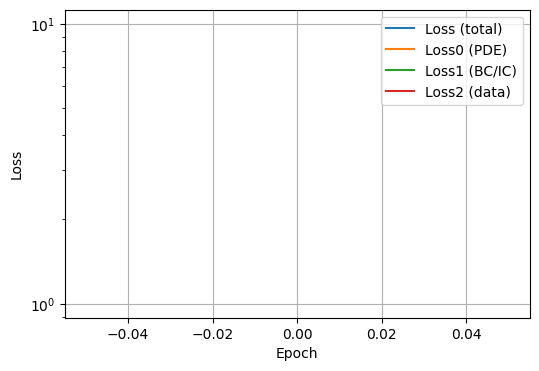

In [36]:
epochs_hist = []
loss_hist   = []
loss0_hist  = []
loss1_hist  = []
loss2_hist  = []

# ONE figure & ONE axes
fig, ax = plt.subplots(figsize=(6, 4))

(line_loss,)  = ax.plot([], [], label="Loss (total)")
(line_l0,)    = ax.plot([], [], label="Loss0 (PDE)")
(line_l1,)    = ax.plot([], [], label="Loss1 (BC/IC)")
(line_l2,)    = ax.plot([], [], label="Loss2 (data)")

ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.set_yscale("log")
ax.grid(True)
ax.legend()

def update_loss_plot(epoch, loss, loss0, loss1, loss2):
    # store history
    epochs_hist.append(epoch)
    loss_hist.append(loss)
    loss0_hist.append(loss0)
    loss1_hist.append(loss1)
    loss2_hist.append(loss2)

    # update line data
    line_loss.set_data(epochs_hist, loss_hist)
    line_l0.set_data(epochs_hist, loss0_hist)
    line_l1.set_data(epochs_hist, loss1_hist)
    line_l2.set_data(epochs_hist, loss2_hist)

    # rescale
    ax.relim()
    ax.autoscale_view()

    clear_output(wait=True)
    display(fig)

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch: 0 | Loss: 1.18119 | PDE: 1.95819 | BC: 1.18043 | Data: 0.35063


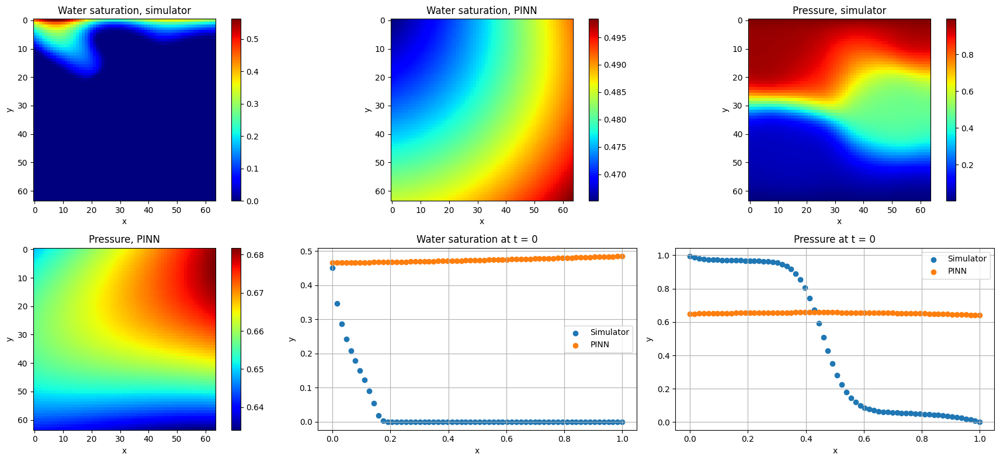

Epoch: 20 | Loss: 0.68854 | PDE: 0.94759 | BC: 0.67759 | Data: 0.20422
Epoch: 40 | Loss: 0.42115 | PDE: 0.54064 | BC: 0.39214 | Data: 0.15017
Epoch: 60 | Loss: 0.22597 | PDE: 0.11547 | BC: 0.26245 | Data: 0.12129
Epoch: 80 | Loss: 0.13409 | PDE: 0.08900 | BC: 0.15197 | Data: 0.09549
Epoch: 100 | Loss: 0.08798 | PDE: 0.07987 | BC: 0.09182 | Data: 0.08111
Epoch: 120 | Loss: 0.06425 | PDE: 0.06742 | BC: 0.06219 | Data: 0.07297
Epoch: 140 | Loss: 0.05062 | PDE: 0.06086 | BC: 0.04566 | Data: 0.06697
Epoch: 160 | Loss: 0.04228 | PDE: 0.05810 | BC: 0.03551 | Data: 0.06199
Epoch: 180 | Loss: 0.03698 | PDE: 0.05677 | BC: 0.02888 | Data: 0.05791
Epoch: 200 | Loss: 0.03351 | PDE: 0.05592 | BC: 0.02437 | Data: 0.05466


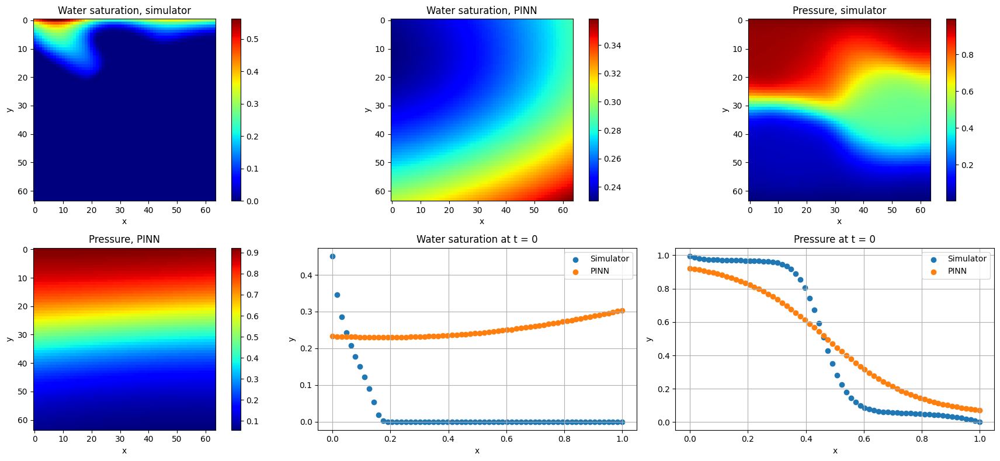

Epoch: 220 | Loss: 0.03125 | PDE: 0.05567 | BC: 0.02120 | Data: 0.05201
Epoch: 240 | Loss: 0.02982 | PDE: 0.05589 | BC: 0.01891 | Data: 0.04981
Epoch: 260 | Loss: 0.02889 | PDE: 0.05630 | BC: 0.01722 | Data: 0.04793
Epoch: 280 | Loss: 0.02829 | PDE: 0.05672 | BC: 0.01598 | Data: 0.04628
Epoch: 300 | Loss: 0.02787 | PDE: 0.05704 | BC: 0.01504 | Data: 0.04480
Epoch: 320 | Loss: 0.02760 | PDE: 0.05721 | BC: 0.01437 | Data: 0.04358
Epoch: 340 | Loss: 0.02738 | PDE: 0.05727 | BC: 0.01384 | Data: 0.04243
Epoch: 360 | Loss: 0.02720 | PDE: 0.05722 | BC: 0.01340 | Data: 0.04135
Epoch: 380 | Loss: 0.02705 | PDE: 0.05708 | BC: 0.01303 | Data: 0.04031
Epoch: 400 | Loss: 0.02693 | PDE: 0.05685 | BC: 0.01271 | Data: 0.03932


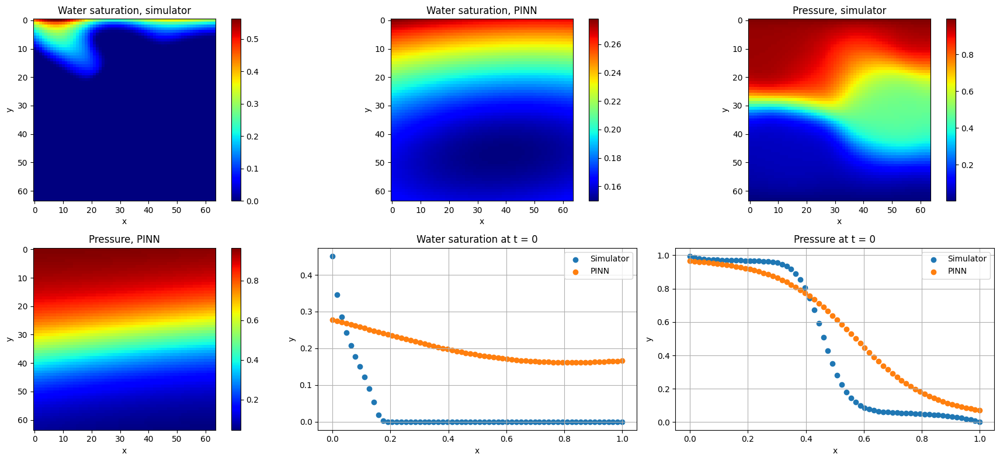

Epoch: 420 | Loss: 0.02684 | PDE: 0.05655 | BC: 0.01242 | Data: 0.03838
Epoch: 440 | Loss: 0.02677 | PDE: 0.05620 | BC: 0.01217 | Data: 0.03749
Epoch: 460 | Loss: 0.02673 | PDE: 0.05582 | BC: 0.01195 | Data: 0.03666
Epoch: 480 | Loss: 0.02671 | PDE: 0.05544 | BC: 0.01174 | Data: 0.03590
Epoch: 500 | Loss: 0.02671 | PDE: 0.05505 | BC: 0.01155 | Data: 0.03521
Epoch: 520 | Loss: 0.02673 | PDE: 0.05466 | BC: 0.01137 | Data: 0.03459
Epoch: 540 | Loss: 0.02675 | PDE: 0.05429 | BC: 0.01121 | Data: 0.03404
Epoch: 560 | Loss: 0.02676 | PDE: 0.05392 | BC: 0.01107 | Data: 0.03355
Epoch: 580 | Loss: 0.02677 | PDE: 0.05356 | BC: 0.01093 | Data: 0.03312
Epoch: 600 | Loss: 0.02677 | PDE: 0.05322 | BC: 0.01081 | Data: 0.03273


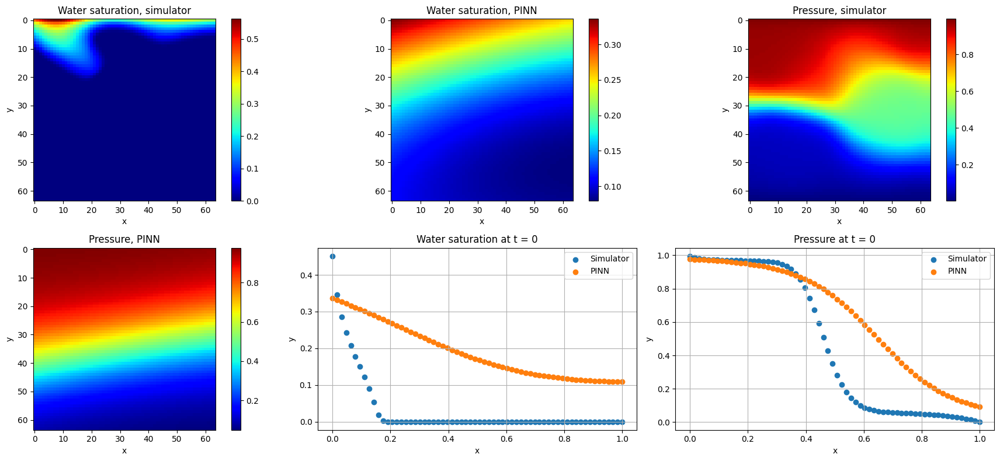

Epoch: 620 | Loss: 0.02675 | PDE: 0.05291 | BC: 0.01071 | Data: 0.03241
Epoch: 640 | Loss: 0.02672 | PDE: 0.05260 | BC: 0.01061 | Data: 0.03211
Epoch: 660 | Loss: 0.02667 | PDE: 0.05231 | BC: 0.01051 | Data: 0.03184
Epoch: 680 | Loss: 0.02662 | PDE: 0.05201 | BC: 0.01042 | Data: 0.03159
Epoch: 700 | Loss: 0.02656 | PDE: 0.05172 | BC: 0.01033 | Data: 0.03135
Epoch: 720 | Loss: 0.02650 | PDE: 0.05144 | BC: 0.01024 | Data: 0.03113
Epoch: 740 | Loss: 0.02643 | PDE: 0.05117 | BC: 0.01015 | Data: 0.03092
Epoch: 760 | Loss: 0.02635 | PDE: 0.05090 | BC: 0.01007 | Data: 0.03072
Epoch: 780 | Loss: 0.02628 | PDE: 0.05064 | BC: 0.00998 | Data: 0.03053
Epoch: 800 | Loss: 0.02620 | PDE: 0.05038 | BC: 0.00990 | Data: 0.03035


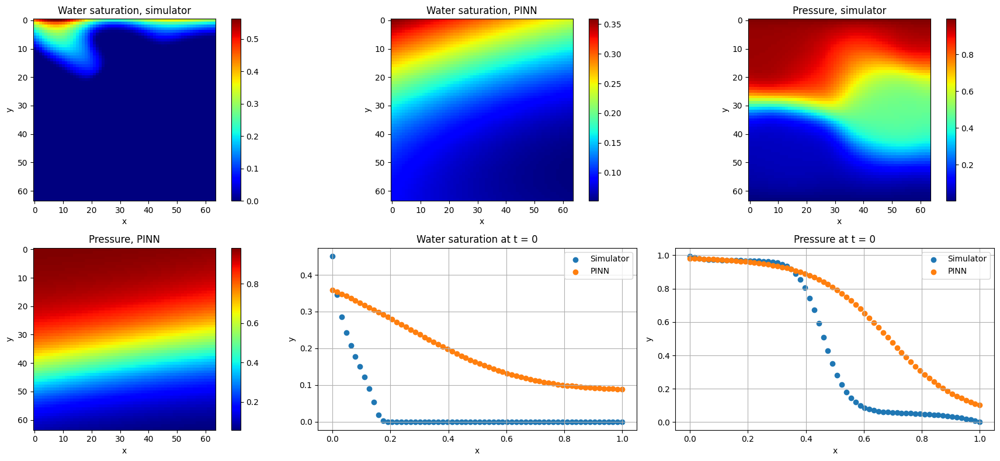

Epoch: 820 | Loss: 0.02613 | PDE: 0.05014 | BC: 0.00981 | Data: 0.03018
Epoch: 840 | Loss: 0.02605 | PDE: 0.04990 | BC: 0.00973 | Data: 0.03002
Epoch: 860 | Loss: 0.02598 | PDE: 0.04967 | BC: 0.00965 | Data: 0.02986
Epoch: 880 | Loss: 0.02591 | PDE: 0.04944 | BC: 0.00957 | Data: 0.02971
Epoch: 900 | Loss: 0.02584 | PDE: 0.04922 | BC: 0.00950 | Data: 0.02957
Epoch: 920 | Loss: 0.02578 | PDE: 0.04902 | BC: 0.00943 | Data: 0.02944
Epoch: 940 | Loss: 0.02572 | PDE: 0.04883 | BC: 0.00936 | Data: 0.02932
Epoch: 960 | Loss: 0.02566 | PDE: 0.04864 | BC: 0.00930 | Data: 0.02920
Epoch: 980 | Loss: 0.02560 | PDE: 0.04846 | BC: 0.00923 | Data: 0.02909
Epoch: 1000 | Loss: 0.02554 | PDE: 0.04827 | BC: 0.00917 | Data: 0.02898


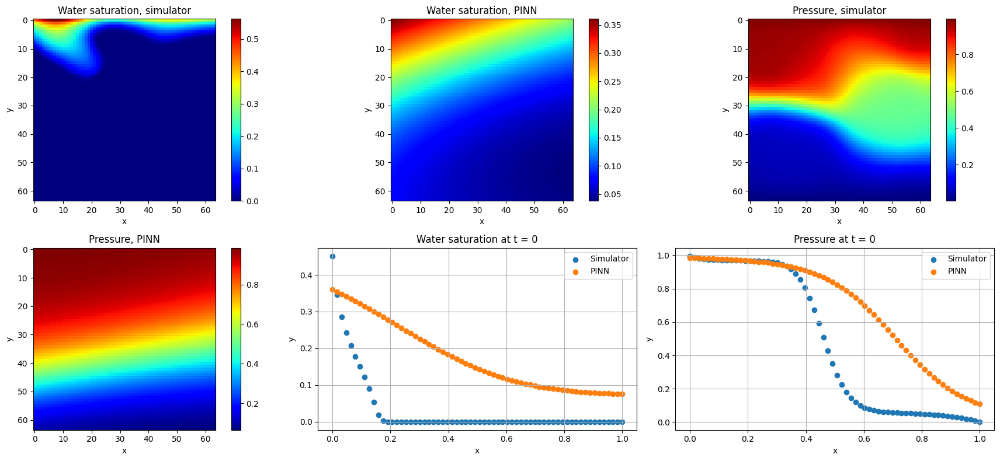

Epoch: 1020 | Loss: 0.02549 | PDE: 0.04809 | BC: 0.00912 | Data: 0.02888
Epoch: 1040 | Loss: 0.02543 | PDE: 0.04791 | BC: 0.00906 | Data: 0.02878
Epoch: 1060 | Loss: 0.02538 | PDE: 0.04773 | BC: 0.00901 | Data: 0.02868
Epoch: 1080 | Loss: 0.02533 | PDE: 0.04756 | BC: 0.00896 | Data: 0.02858
Epoch: 1100 | Loss: 0.02528 | PDE: 0.04738 | BC: 0.00891 | Data: 0.02849
Epoch: 1120 | Loss: 0.02522 | PDE: 0.04721 | BC: 0.00886 | Data: 0.02840
Epoch: 1140 | Loss: 0.02517 | PDE: 0.04703 | BC: 0.00881 | Data: 0.02831
Epoch: 1160 | Loss: 0.02512 | PDE: 0.04686 | BC: 0.00877 | Data: 0.02822
Epoch: 1180 | Loss: 0.02507 | PDE: 0.04669 | BC: 0.00873 | Data: 0.02814
Epoch: 1200 | Loss: 0.02502 | PDE: 0.04652 | BC: 0.00869 | Data: 0.02806


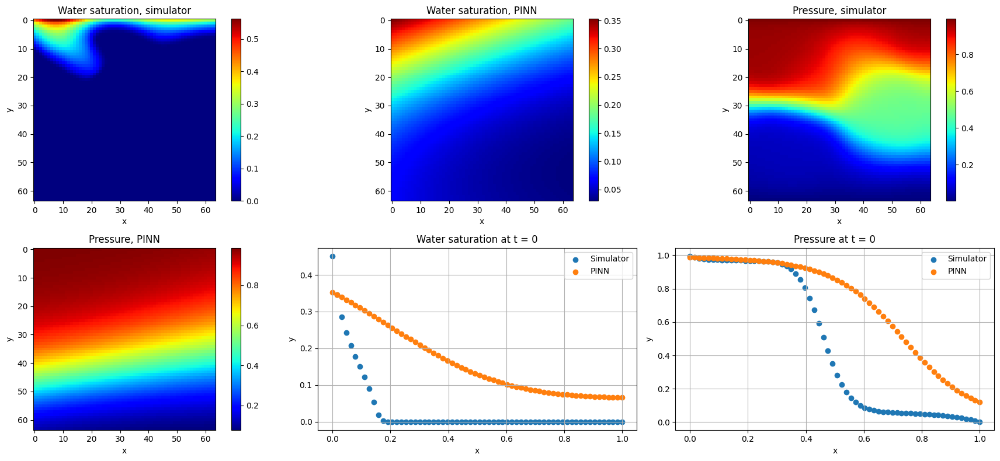

Epoch: 1220 | Loss: 0.02498 | PDE: 0.04637 | BC: 0.00865 | Data: 0.02799
Epoch: 1240 | Loss: 0.02493 | PDE: 0.04622 | BC: 0.00862 | Data: 0.02792
Epoch: 1260 | Loss: 0.02489 | PDE: 0.04607 | BC: 0.00858 | Data: 0.02785
Epoch: 1280 | Loss: 0.02484 | PDE: 0.04592 | BC: 0.00855 | Data: 0.02778
Epoch: 1300 | Loss: 0.02479 | PDE: 0.04577 | BC: 0.00852 | Data: 0.02771
Epoch: 1320 | Loss: 0.02475 | PDE: 0.04561 | BC: 0.00849 | Data: 0.02765
Epoch: 1340 | Loss: 0.02470 | PDE: 0.04546 | BC: 0.00846 | Data: 0.02759
Epoch: 1360 | Loss: 0.02466 | PDE: 0.04531 | BC: 0.00844 | Data: 0.02752
Epoch: 1380 | Loss: 0.02461 | PDE: 0.04516 | BC: 0.00841 | Data: 0.02746
Epoch: 1400 | Loss: 0.02457 | PDE: 0.04501 | BC: 0.00839 | Data: 0.02740


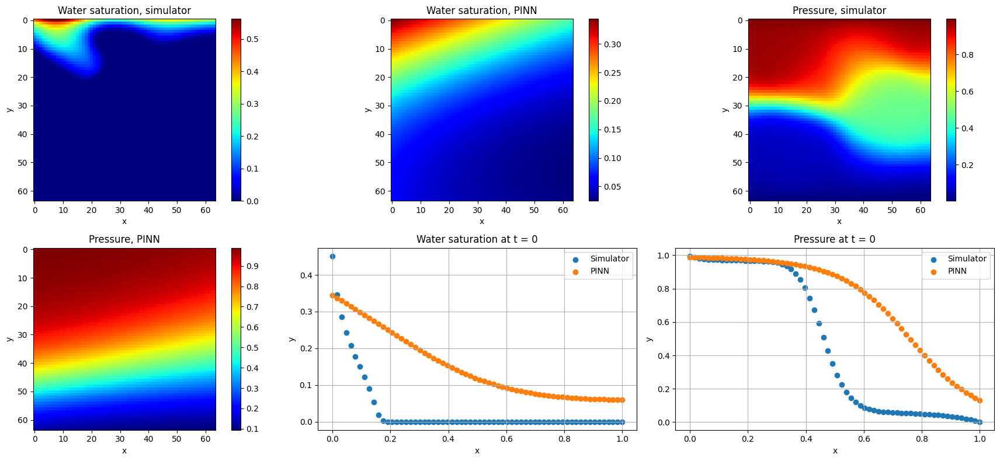

Epoch: 1420 | Loss: 0.02452 | PDE: 0.04486 | BC: 0.00836 | Data: 0.02734
Epoch: 1440 | Loss: 0.02447 | PDE: 0.04471 | BC: 0.00834 | Data: 0.02728
Epoch: 1460 | Loss: 0.02443 | PDE: 0.04455 | BC: 0.00832 | Data: 0.02723
Epoch: 1480 | Loss: 0.02438 | PDE: 0.04440 | BC: 0.00829 | Data: 0.02717
Epoch: 1500 | Loss: 0.02433 | PDE: 0.04425 | BC: 0.00827 | Data: 0.02711
Epoch: 1520 | Loss: 0.02429 | PDE: 0.04411 | BC: 0.00826 | Data: 0.02706
Epoch: 1540 | Loss: 0.02425 | PDE: 0.04397 | BC: 0.00824 | Data: 0.02701
Epoch: 1560 | Loss: 0.02420 | PDE: 0.04383 | BC: 0.00822 | Data: 0.02697
Epoch: 1580 | Loss: 0.02416 | PDE: 0.04368 | BC: 0.00821 | Data: 0.02692
Epoch: 1600 | Loss: 0.02412 | PDE: 0.04354 | BC: 0.00819 | Data: 0.02687


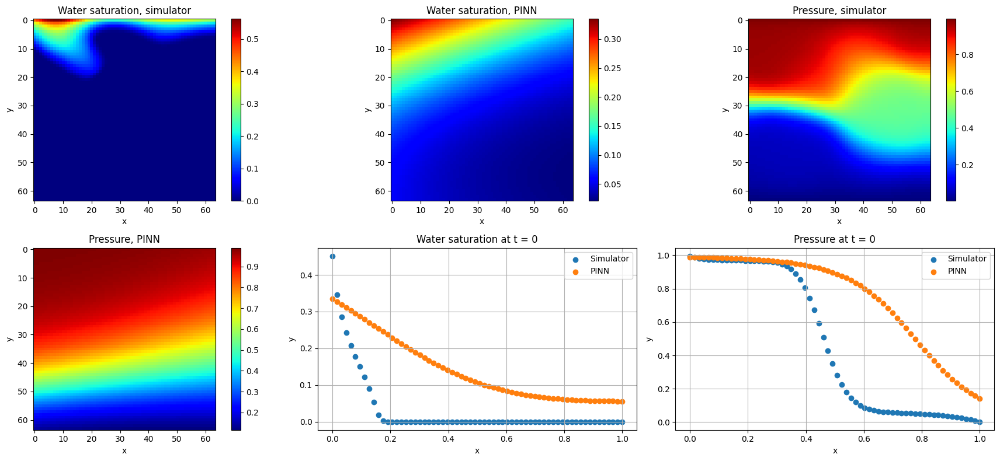

Epoch: 1620 | Loss: 0.02407 | PDE: 0.04340 | BC: 0.00818 | Data: 0.02682
Epoch: 1640 | Loss: 0.02403 | PDE: 0.04325 | BC: 0.00817 | Data: 0.02678
Epoch: 1660 | Loss: 0.02398 | PDE: 0.04311 | BC: 0.00815 | Data: 0.02673
Epoch: 1680 | Loss: 0.02394 | PDE: 0.04296 | BC: 0.00814 | Data: 0.02669
Epoch: 1700 | Loss: 0.02389 | PDE: 0.04281 | BC: 0.00813 | Data: 0.02664
Epoch: 1720 | Loss: 0.02384 | PDE: 0.04266 | BC: 0.00812 | Data: 0.02660
Epoch: 1740 | Loss: 0.02379 | PDE: 0.04251 | BC: 0.00811 | Data: 0.02656
Epoch: 1760 | Loss: 0.02375 | PDE: 0.04236 | BC: 0.00810 | Data: 0.02651
Epoch: 1780 | Loss: 0.02370 | PDE: 0.04220 | BC: 0.00809 | Data: 0.02647
Epoch: 1800 | Loss: 0.02364 | PDE: 0.04205 | BC: 0.00807 | Data: 0.02643


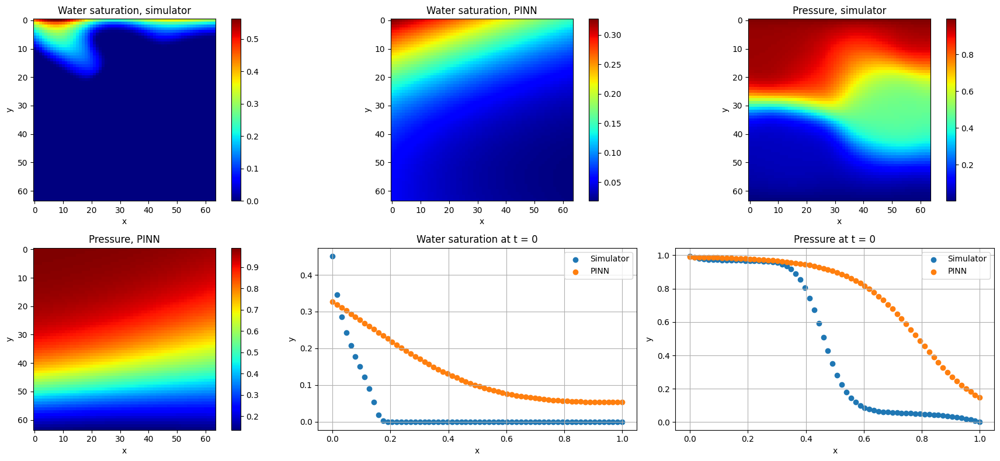

Epoch: 1820 | Loss: 0.02360 | PDE: 0.04190 | BC: 0.00806 | Data: 0.02639
Epoch: 1840 | Loss: 0.02355 | PDE: 0.04176 | BC: 0.00805 | Data: 0.02635
Epoch: 1860 | Loss: 0.02350 | PDE: 0.04161 | BC: 0.00804 | Data: 0.02631
Epoch: 1880 | Loss: 0.02345 | PDE: 0.04147 | BC: 0.00803 | Data: 0.02628
Epoch: 1900 | Loss: 0.02339 | PDE: 0.04132 | BC: 0.00802 | Data: 0.02624
Epoch: 1920 | Loss: 0.02334 | PDE: 0.04116 | BC: 0.00801 | Data: 0.02620
Epoch: 1940 | Loss: 0.02328 | PDE: 0.04101 | BC: 0.00800 | Data: 0.02617
Epoch: 1960 | Loss: 0.02323 | PDE: 0.04085 | BC: 0.00799 | Data: 0.02613
Epoch: 1980 | Loss: 0.02317 | PDE: 0.04069 | BC: 0.00798 | Data: 0.02609
Epoch: 2000 | Loss: 0.02311 | PDE: 0.04053 | BC: 0.00796 | Data: 0.02606


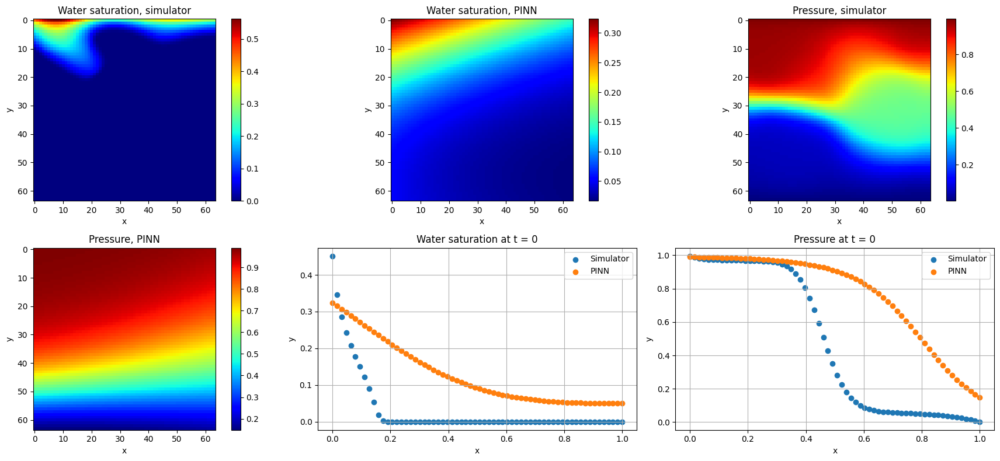

Epoch: 2020 | Loss: 0.02304 | PDE: 0.04037 | BC: 0.00795 | Data: 0.02602
Epoch: 2040 | Loss: 0.02298 | PDE: 0.04020 | BC: 0.00793 | Data: 0.02599
Epoch: 2060 | Loss: 0.02291 | PDE: 0.04004 | BC: 0.00792 | Data: 0.02595
Epoch: 2080 | Loss: 0.02284 | PDE: 0.03986 | BC: 0.00790 | Data: 0.02592
Epoch: 2100 | Loss: 0.02277 | PDE: 0.03969 | BC: 0.00788 | Data: 0.02588
Epoch: 2120 | Loss: 0.02271 | PDE: 0.03953 | BC: 0.00787 | Data: 0.02585
Epoch: 2140 | Loss: 0.02264 | PDE: 0.03937 | BC: 0.00785 | Data: 0.02582
Epoch: 2160 | Loss: 0.02257 | PDE: 0.03920 | BC: 0.00783 | Data: 0.02579
Epoch: 2180 | Loss: 0.02249 | PDE: 0.03904 | BC: 0.00781 | Data: 0.02576
Epoch: 2200 | Loss: 0.02242 | PDE: 0.03886 | BC: 0.00779 | Data: 0.02573


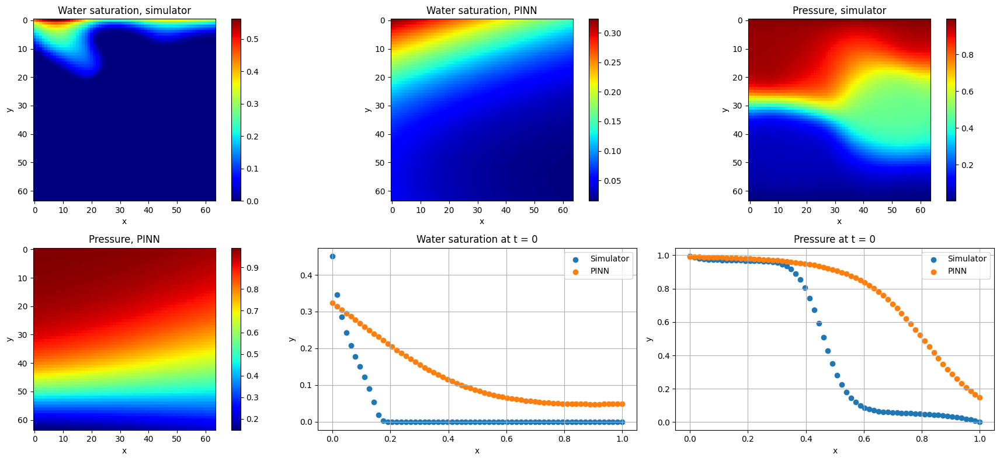

Epoch: 2220 | Loss: 0.02234 | PDE: 0.03869 | BC: 0.00776 | Data: 0.02570
Epoch: 2240 | Loss: 0.02226 | PDE: 0.03851 | BC: 0.00774 | Data: 0.02566
Epoch: 2260 | Loss: 0.02218 | PDE: 0.03833 | BC: 0.00771 | Data: 0.02563
Epoch: 2280 | Loss: 0.02209 | PDE: 0.03815 | BC: 0.00769 | Data: 0.02560
Epoch: 2300 | Loss: 0.02200 | PDE: 0.03796 | BC: 0.00766 | Data: 0.02557
Epoch: 2320 | Loss: 0.02191 | PDE: 0.03777 | BC: 0.00762 | Data: 0.02554
Epoch: 2340 | Loss: 0.02182 | PDE: 0.03758 | BC: 0.00759 | Data: 0.02551
Epoch: 2360 | Loss: 0.02172 | PDE: 0.03738 | BC: 0.00755 | Data: 0.02548
Epoch: 2380 | Loss: 0.02162 | PDE: 0.03718 | BC: 0.00752 | Data: 0.02545
Epoch: 2400 | Loss: 0.02151 | PDE: 0.03697 | BC: 0.00748 | Data: 0.02542


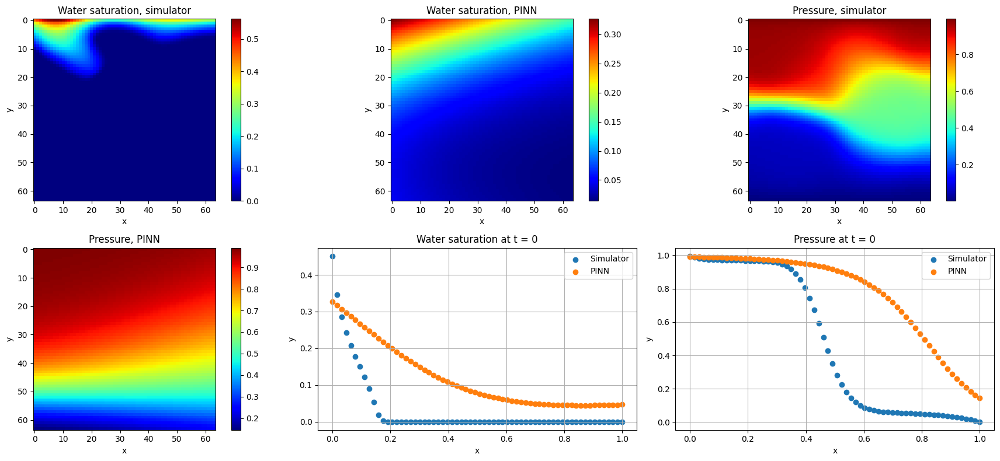

Epoch: 2420 | Loss: 0.02141 | PDE: 0.03678 | BC: 0.00744 | Data: 0.02540
Epoch: 2440 | Loss: 0.02131 | PDE: 0.03659 | BC: 0.00740 | Data: 0.02537
Epoch: 2460 | Loss: 0.02121 | PDE: 0.03639 | BC: 0.00735 | Data: 0.02534
Epoch: 2480 | Loss: 0.02110 | PDE: 0.03620 | BC: 0.00731 | Data: 0.02532
Epoch: 2500 | Loss: 0.02099 | PDE: 0.03599 | BC: 0.00726 | Data: 0.02529
Epoch: 2520 | Loss: 0.02088 | PDE: 0.03579 | BC: 0.00721 | Data: 0.02527
Epoch: 2540 | Loss: 0.02076 | PDE: 0.03558 | BC: 0.00716 | Data: 0.02524
Epoch: 2560 | Loss: 0.02064 | PDE: 0.03537 | BC: 0.00710 | Data: 0.02521
Epoch: 2580 | Loss: 0.02052 | PDE: 0.03516 | BC: 0.00705 | Data: 0.02519
Epoch: 2600 | Loss: 0.02040 | PDE: 0.03495 | BC: 0.00698 | Data: 0.02516


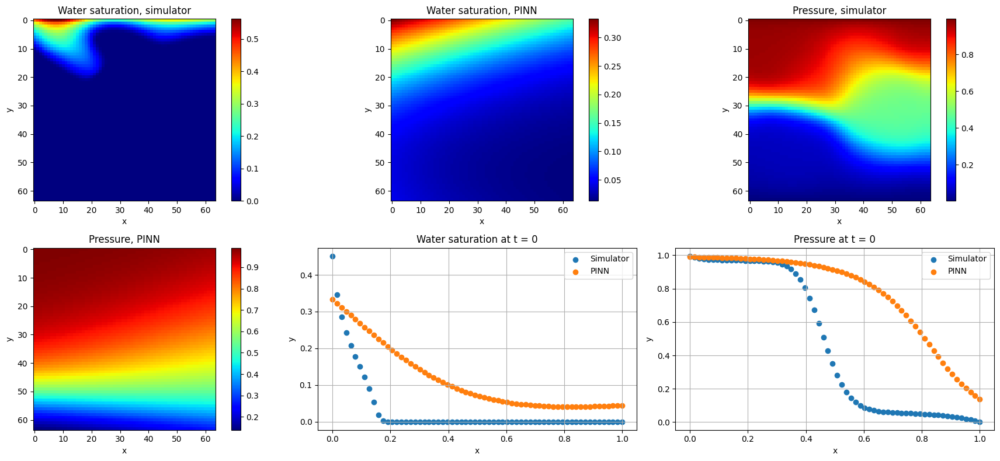

Epoch: 2620 | Loss: 0.02027 | PDE: 0.03473 | BC: 0.00692 | Data: 0.02514
Epoch: 2640 | Loss: 0.02014 | PDE: 0.03452 | BC: 0.00685 | Data: 0.02511
Epoch: 2660 | Loss: 0.02001 | PDE: 0.03430 | BC: 0.00678 | Data: 0.02509
Epoch: 2680 | Loss: 0.01987 | PDE: 0.03408 | BC: 0.00671 | Data: 0.02506
Epoch: 2700 | Loss: 0.01973 | PDE: 0.03387 | BC: 0.00663 | Data: 0.02503
Epoch: 2720 | Loss: 0.01960 | PDE: 0.03367 | BC: 0.00655 | Data: 0.02501
Epoch: 2740 | Loss: 0.01947 | PDE: 0.03347 | BC: 0.00648 | Data: 0.02499
Epoch: 2760 | Loss: 0.01934 | PDE: 0.03328 | BC: 0.00639 | Data: 0.02496
Epoch: 2780 | Loss: 0.01921 | PDE: 0.03308 | BC: 0.00631 | Data: 0.02494
Epoch: 2800 | Loss: 0.01907 | PDE: 0.03289 | BC: 0.00622 | Data: 0.02491


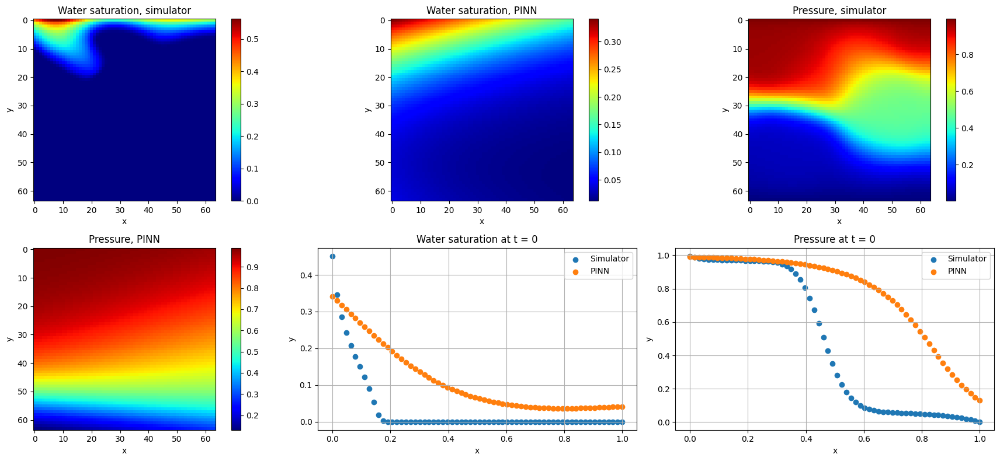

Epoch: 2820 | Loss: 0.01893 | PDE: 0.03270 | BC: 0.00612 | Data: 0.02488
Epoch: 2840 | Loss: 0.01878 | PDE: 0.03251 | BC: 0.00602 | Data: 0.02485
Epoch: 2860 | Loss: 0.01863 | PDE: 0.03232 | BC: 0.00592 | Data: 0.02482
Epoch: 2880 | Loss: 0.01847 | PDE: 0.03213 | BC: 0.00580 | Data: 0.02479
Epoch: 2900 | Loss: 0.01830 | PDE: 0.03195 | BC: 0.00568 | Data: 0.02475
Epoch: 2920 | Loss: 0.01811 | PDE: 0.03176 | BC: 0.00555 | Data: 0.02471
Epoch: 2940 | Loss: 0.01791 | PDE: 0.03156 | BC: 0.00541 | Data: 0.02467
Epoch: 2960 | Loss: 0.01769 | PDE: 0.03135 | BC: 0.00527 | Data: 0.02462
Epoch: 2980 | Loss: 0.01743 | PDE: 0.03111 | BC: 0.00511 | Data: 0.02456
Epoch: 3000 | Loss: 0.01713 | PDE: 0.03083 | BC: 0.00495 | Data: 0.02449


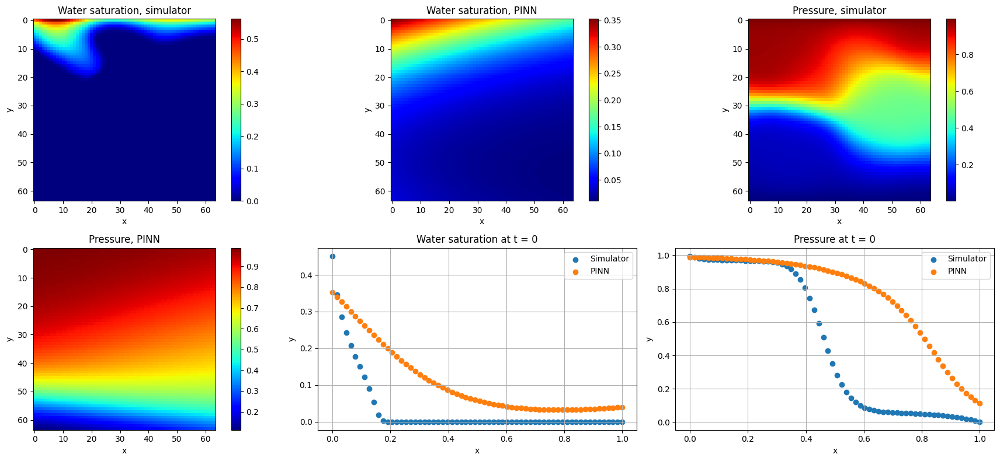

Epoch: 3020 | Loss: 0.01682 | PDE: 0.03053 | BC: 0.00480 | Data: 0.02442
Epoch: 3040 | Loss: 0.01646 | PDE: 0.03017 | BC: 0.00465 | Data: 0.02435
Epoch: 3060 | Loss: 0.01607 | PDE: 0.02974 | BC: 0.00451 | Data: 0.02427
Epoch: 3080 | Loss: 0.01563 | PDE: 0.02927 | BC: 0.00436 | Data: 0.02419
Epoch: 3100 | Loss: 0.01517 | PDE: 0.02875 | BC: 0.00422 | Data: 0.02410
Epoch: 3120 | Loss: 0.01469 | PDE: 0.02820 | BC: 0.00408 | Data: 0.02401
Epoch: 3140 | Loss: 0.01421 | PDE: 0.02764 | BC: 0.00393 | Data: 0.02392
Epoch: 3160 | Loss: 0.01373 | PDE: 0.02709 | BC: 0.00379 | Data: 0.02383
Epoch: 3180 | Loss: 0.01326 | PDE: 0.02654 | BC: 0.00366 | Data: 0.02373
Epoch: 3200 | Loss: 0.01282 | PDE: 0.02602 | BC: 0.00353 | Data: 0.02364


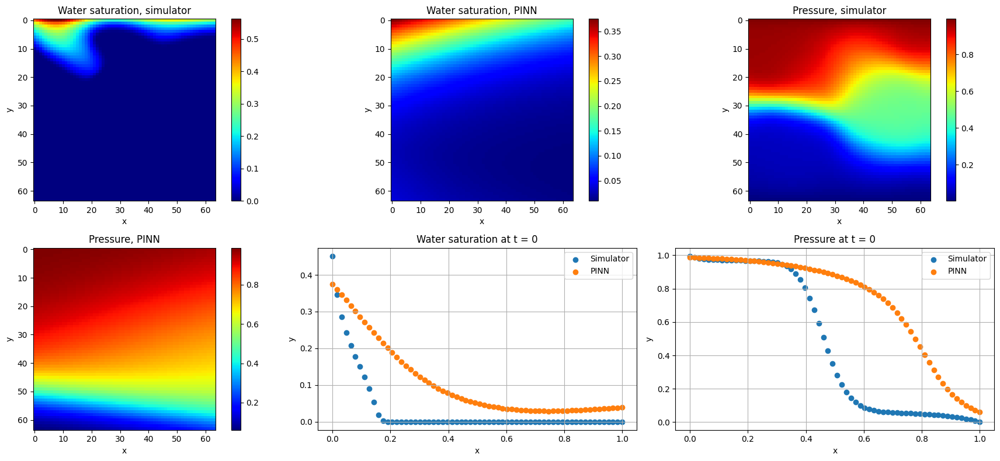

Epoch: 3220 | Loss: 0.01240 | PDE: 0.02553 | BC: 0.00340 | Data: 0.02354
Epoch: 3240 | Loss: 0.01201 | PDE: 0.02506 | BC: 0.00328 | Data: 0.02345
Epoch: 3260 | Loss: 0.01165 | PDE: 0.02461 | BC: 0.00316 | Data: 0.02335
Epoch: 3280 | Loss: 0.01131 | PDE: 0.02420 | BC: 0.00306 | Data: 0.02326
Epoch: 3300 | Loss: 0.01099 | PDE: 0.02381 | BC: 0.00296 | Data: 0.02317
Epoch: 3320 | Loss: 0.01073 | PDE: 0.02347 | BC: 0.00287 | Data: 0.02309
Epoch: 3340 | Loss: 0.01049 | PDE: 0.02315 | BC: 0.00279 | Data: 0.02301
Epoch: 3360 | Loss: 0.01026 | PDE: 0.02285 | BC: 0.00271 | Data: 0.02294
Epoch: 3380 | Loss: 0.01004 | PDE: 0.02257 | BC: 0.00264 | Data: 0.02286
Epoch: 3400 | Loss: 0.00984 | PDE: 0.02229 | BC: 0.00258 | Data: 0.02279


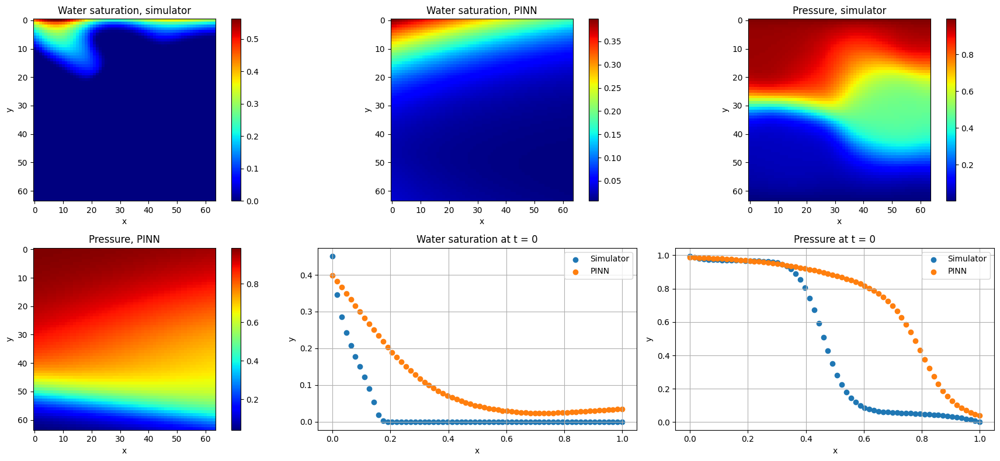

Epoch: 3420 | Loss: 0.00965 | PDE: 0.02203 | BC: 0.00251 | Data: 0.02272
Epoch: 3440 | Loss: 0.00947 | PDE: 0.02178 | BC: 0.00245 | Data: 0.02265
Epoch: 3460 | Loss: 0.00931 | PDE: 0.02154 | BC: 0.00239 | Data: 0.02259
Epoch: 3480 | Loss: 0.00915 | PDE: 0.02131 | BC: 0.00234 | Data: 0.02252
Epoch: 3500 | Loss: 0.00900 | PDE: 0.02109 | BC: 0.00229 | Data: 0.02246
Epoch: 3520 | Loss: 0.00886 | PDE: 0.02088 | BC: 0.00224 | Data: 0.02240
Epoch: 3540 | Loss: 0.00872 | PDE: 0.02067 | BC: 0.00219 | Data: 0.02234
Epoch: 3560 | Loss: 0.00860 | PDE: 0.02048 | BC: 0.00215 | Data: 0.02228
Epoch: 3580 | Loss: 0.00848 | PDE: 0.02029 | BC: 0.00210 | Data: 0.02222
Epoch: 3600 | Loss: 0.00836 | PDE: 0.02011 | BC: 0.00206 | Data: 0.02217


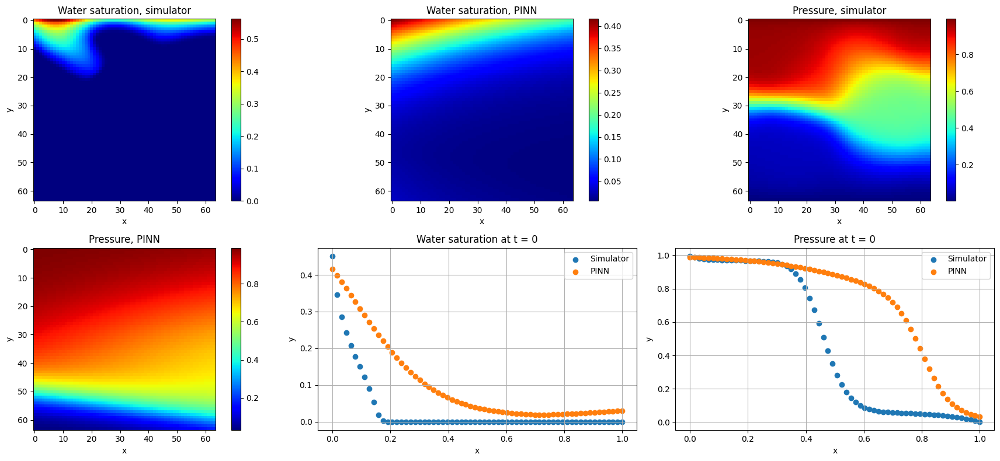

Epoch: 3620 | Loss: 0.00827 | PDE: 0.01995 | BC: 0.00203 | Data: 0.02211
Epoch: 3640 | Loss: 0.00817 | PDE: 0.01980 | BC: 0.00200 | Data: 0.02207
Epoch: 3660 | Loss: 0.00809 | PDE: 0.01965 | BC: 0.00196 | Data: 0.02202
Epoch: 3680 | Loss: 0.00800 | PDE: 0.01951 | BC: 0.00193 | Data: 0.02197
Epoch: 3700 | Loss: 0.00792 | PDE: 0.01937 | BC: 0.00190 | Data: 0.02192
Epoch: 3720 | Loss: 0.00785 | PDE: 0.01924 | BC: 0.00188 | Data: 0.02187
Epoch: 3740 | Loss: 0.00777 | PDE: 0.01911 | BC: 0.00185 | Data: 0.02182
Epoch: 3760 | Loss: 0.00770 | PDE: 0.01898 | BC: 0.00183 | Data: 0.02178
Epoch: 3780 | Loss: 0.00764 | PDE: 0.01886 | BC: 0.00180 | Data: 0.02173
Epoch: 3800 | Loss: 0.00757 | PDE: 0.01874 | BC: 0.00178 | Data: 0.02169


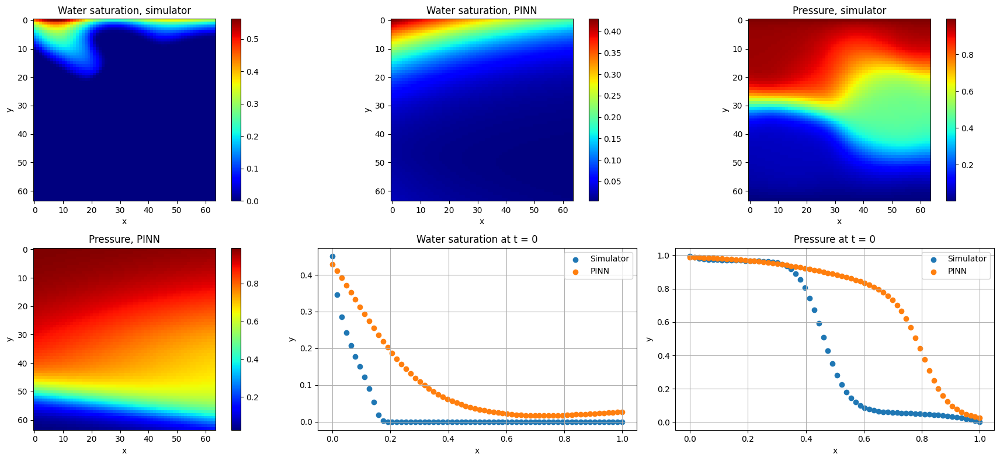

Epoch: 3820 | Loss: 0.00751 | PDE: 0.01862 | BC: 0.00176 | Data: 0.02164
Epoch: 3840 | Loss: 0.00745 | PDE: 0.01850 | BC: 0.00173 | Data: 0.02159
Epoch: 3860 | Loss: 0.00740 | PDE: 0.01839 | BC: 0.00171 | Data: 0.02155
Epoch: 3880 | Loss: 0.00734 | PDE: 0.01828 | BC: 0.00170 | Data: 0.02150
Epoch: 3900 | Loss: 0.00729 | PDE: 0.01817 | BC: 0.00168 | Data: 0.02146
Epoch: 3920 | Loss: 0.00724 | PDE: 0.01808 | BC: 0.00166 | Data: 0.02142
Epoch: 3940 | Loss: 0.00720 | PDE: 0.01798 | BC: 0.00165 | Data: 0.02138
Epoch: 3960 | Loss: 0.00716 | PDE: 0.01789 | BC: 0.00163 | Data: 0.02134
Epoch: 3980 | Loss: 0.00712 | PDE: 0.01780 | BC: 0.00162 | Data: 0.02130
Epoch: 4000 | Loss: 0.00708 | PDE: 0.01770 | BC: 0.00161 | Data: 0.02126


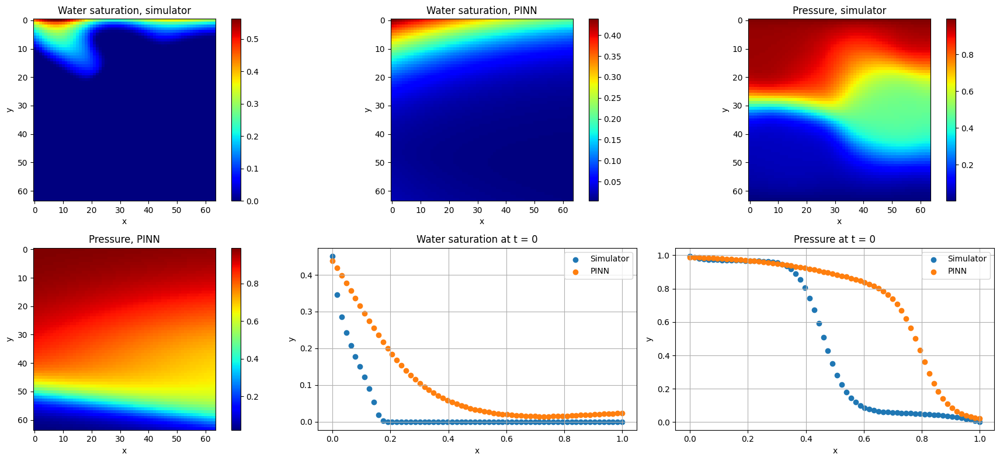

Epoch: 4020 | Loss: 0.00704 | PDE: 0.01761 | BC: 0.00159 | Data: 0.02122
Epoch: 4040 | Loss: 0.00700 | PDE: 0.01752 | BC: 0.00158 | Data: 0.02118
Epoch: 4060 | Loss: 0.00697 | PDE: 0.01743 | BC: 0.00157 | Data: 0.02114
Epoch: 4080 | Loss: 0.00693 | PDE: 0.01734 | BC: 0.00156 | Data: 0.02110
Epoch: 4100 | Loss: 0.00690 | PDE: 0.01726 | BC: 0.00155 | Data: 0.02106
Epoch: 4120 | Loss: 0.00686 | PDE: 0.01717 | BC: 0.00154 | Data: 0.02102
Epoch: 4140 | Loss: 0.00683 | PDE: 0.01708 | BC: 0.00153 | Data: 0.02098
Epoch: 4160 | Loss: 0.00680 | PDE: 0.01699 | BC: 0.00152 | Data: 0.02094
Epoch: 4180 | Loss: 0.00676 | PDE: 0.01690 | BC: 0.00151 | Data: 0.02090
Epoch: 4200 | Loss: 0.00673 | PDE: 0.01682 | BC: 0.00150 | Data: 0.02086


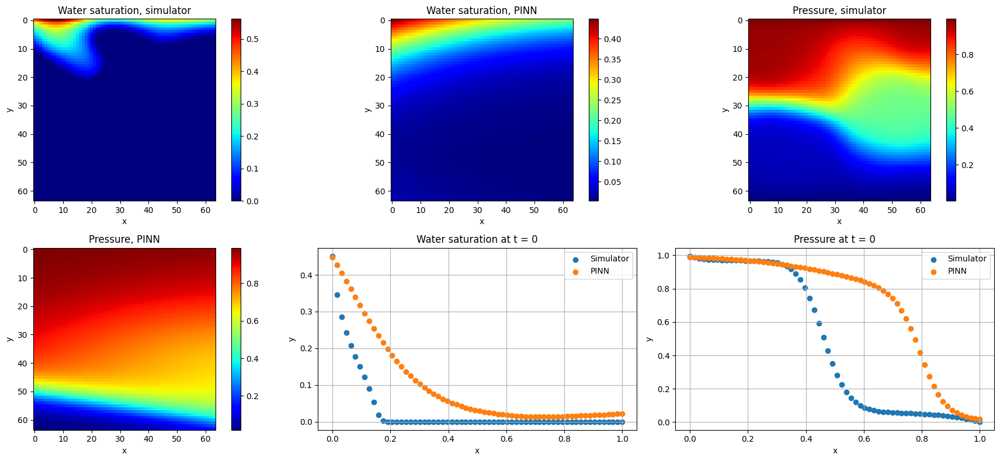

Epoch: 4220 | Loss: 0.00671 | PDE: 0.01674 | BC: 0.00150 | Data: 0.02083
Epoch: 4240 | Loss: 0.00668 | PDE: 0.01666 | BC: 0.00149 | Data: 0.02079
Epoch: 4260 | Loss: 0.00665 | PDE: 0.01658 | BC: 0.00148 | Data: 0.02076
Epoch: 4280 | Loss: 0.00663 | PDE: 0.01650 | BC: 0.00148 | Data: 0.02072
Epoch: 4300 | Loss: 0.00660 | PDE: 0.01642 | BC: 0.00147 | Data: 0.02069
Epoch: 4320 | Loss: 0.00658 | PDE: 0.01635 | BC: 0.00146 | Data: 0.02065
Epoch: 4340 | Loss: 0.00655 | PDE: 0.01627 | BC: 0.00146 | Data: 0.02062
Epoch: 4360 | Loss: 0.00653 | PDE: 0.01619 | BC: 0.00145 | Data: 0.02058
Epoch: 4380 | Loss: 0.00650 | PDE: 0.01611 | BC: 0.00145 | Data: 0.02055
Epoch: 4400 | Loss: 0.00648 | PDE: 0.01603 | BC: 0.00144 | Data: 0.02052


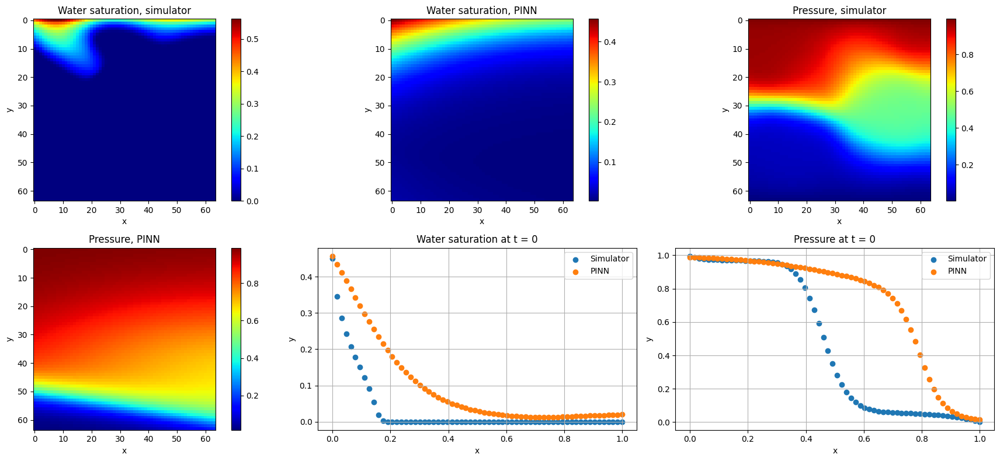

Epoch: 4420 | Loss: 0.00645 | PDE: 0.01595 | BC: 0.00144 | Data: 0.02048
Epoch: 4440 | Loss: 0.00643 | PDE: 0.01587 | BC: 0.00143 | Data: 0.02045
Epoch: 4460 | Loss: 0.00641 | PDE: 0.01579 | BC: 0.00143 | Data: 0.02041
Epoch: 4480 | Loss: 0.00638 | PDE: 0.01571 | BC: 0.00142 | Data: 0.02038
Epoch: 4500 | Loss: 0.00636 | PDE: 0.01564 | BC: 0.00142 | Data: 0.02034
Epoch: 4520 | Loss: 0.00634 | PDE: 0.01556 | BC: 0.00142 | Data: 0.02031
Epoch: 4540 | Loss: 0.00632 | PDE: 0.01549 | BC: 0.00141 | Data: 0.02028
Epoch: 4560 | Loss: 0.00630 | PDE: 0.01542 | BC: 0.00141 | Data: 0.02025
Epoch: 4580 | Loss: 0.00628 | PDE: 0.01535 | BC: 0.00141 | Data: 0.02022
Epoch: 4600 | Loss: 0.00626 | PDE: 0.01528 | BC: 0.00140 | Data: 0.02019


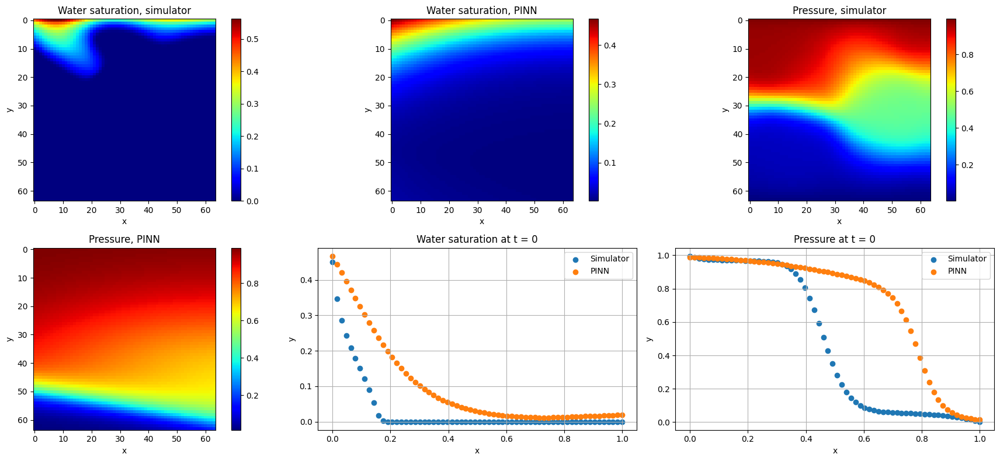

Epoch: 4620 | Loss: 0.00624 | PDE: 0.01521 | BC: 0.00140 | Data: 0.02016
Epoch: 4640 | Loss: 0.00622 | PDE: 0.01514 | BC: 0.00140 | Data: 0.02013
Epoch: 4660 | Loss: 0.00620 | PDE: 0.01507 | BC: 0.00139 | Data: 0.02010
Epoch: 4680 | Loss: 0.00618 | PDE: 0.01500 | BC: 0.00139 | Data: 0.02007
Epoch: 4700 | Loss: 0.00616 | PDE: 0.01493 | BC: 0.00139 | Data: 0.02004
Epoch: 4720 | Loss: 0.00614 | PDE: 0.01486 | BC: 0.00138 | Data: 0.02001
Epoch: 4740 | Loss: 0.00612 | PDE: 0.01480 | BC: 0.00138 | Data: 0.01998
Epoch: 4760 | Loss: 0.00610 | PDE: 0.01473 | BC: 0.00138 | Data: 0.01995
Epoch: 4780 | Loss: 0.00609 | PDE: 0.01466 | BC: 0.00138 | Data: 0.01992
Epoch: 4800 | Loss: 0.00607 | PDE: 0.01459 | BC: 0.00137 | Data: 0.01989


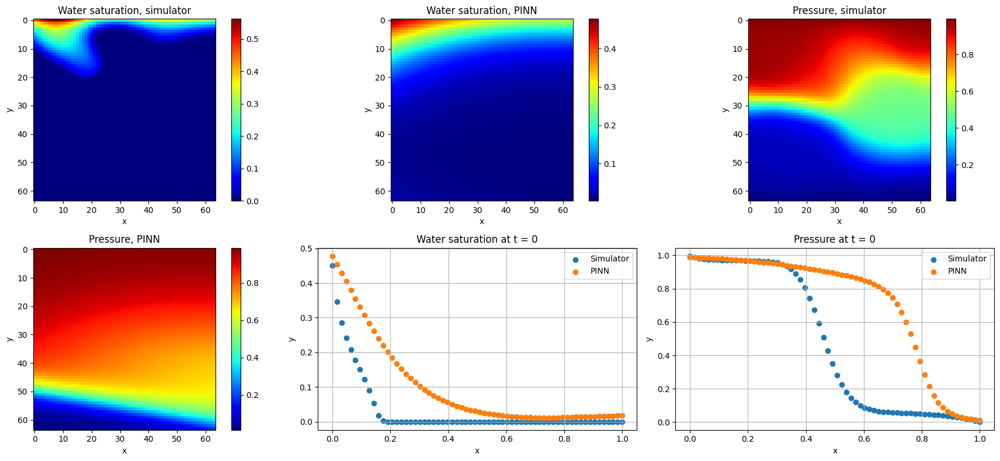

Epoch: 4820 | Loss: 0.00605 | PDE: 0.01453 | BC: 0.00137 | Data: 0.01986
Epoch: 4840 | Loss: 0.00604 | PDE: 0.01448 | BC: 0.00137 | Data: 0.01983
Epoch: 4860 | Loss: 0.00602 | PDE: 0.01442 | BC: 0.00137 | Data: 0.01981
Epoch: 4880 | Loss: 0.00600 | PDE: 0.01436 | BC: 0.00136 | Data: 0.01978
Epoch: 4900 | Loss: 0.00599 | PDE: 0.01430 | BC: 0.00136 | Data: 0.01975
Epoch: 4920 | Loss: 0.00597 | PDE: 0.01424 | BC: 0.00136 | Data: 0.01972
Epoch: 4940 | Loss: 0.00596 | PDE: 0.01419 | BC: 0.00135 | Data: 0.01970
Epoch: 4960 | Loss: 0.00594 | PDE: 0.01413 | BC: 0.00135 | Data: 0.01967
Epoch: 4980 | Loss: 0.00593 | PDE: 0.01408 | BC: 0.00135 | Data: 0.01964
Epoch: 5000 | Loss: 0.00591 | PDE: 0.01402 | BC: 0.00135 | Data: 0.01961


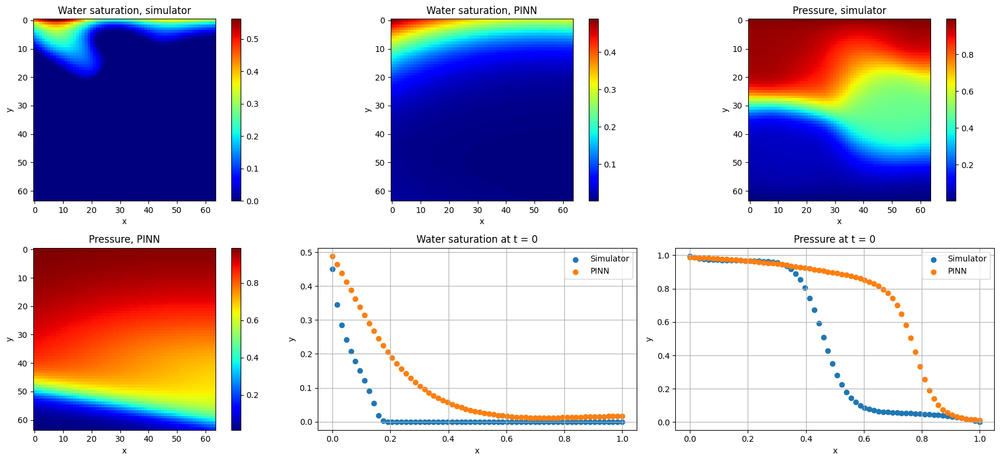

Epoch: 5020 | Loss: 0.00590 | PDE: 0.01397 | BC: 0.00134 | Data: 0.01959
Epoch: 5040 | Loss: 0.00588 | PDE: 0.01391 | BC: 0.00134 | Data: 0.01956
Epoch: 5060 | Loss: 0.00587 | PDE: 0.01386 | BC: 0.00134 | Data: 0.01953
Epoch: 5080 | Loss: 0.00585 | PDE: 0.01381 | BC: 0.00134 | Data: 0.01950
Epoch: 5100 | Loss: 0.00584 | PDE: 0.01375 | BC: 0.00133 | Data: 0.01947
Epoch: 5120 | Loss: 0.00583 | PDE: 0.01371 | BC: 0.00133 | Data: 0.01945
Epoch: 5140 | Loss: 0.00582 | PDE: 0.01366 | BC: 0.00133 | Data: 0.01942
Epoch: 5160 | Loss: 0.00580 | PDE: 0.01362 | BC: 0.00133 | Data: 0.01940
Epoch: 5180 | Loss: 0.00579 | PDE: 0.01357 | BC: 0.00132 | Data: 0.01937
Epoch: 5200 | Loss: 0.00578 | PDE: 0.01353 | BC: 0.00132 | Data: 0.01934


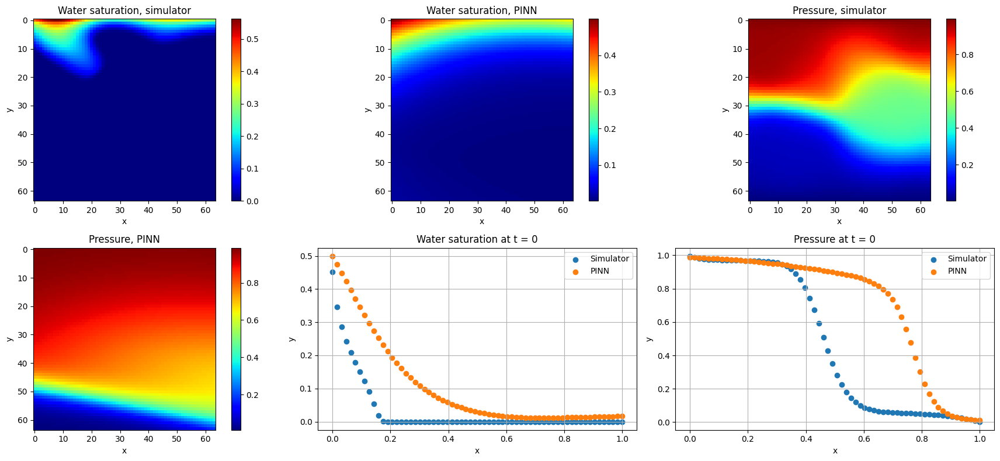

Epoch: 5220 | Loss: 0.00577 | PDE: 0.01348 | BC: 0.00132 | Data: 0.01932
Epoch: 5240 | Loss: 0.00576 | PDE: 0.01344 | BC: 0.00132 | Data: 0.01929
Epoch: 5260 | Loss: 0.00574 | PDE: 0.01340 | BC: 0.00131 | Data: 0.01926
Epoch: 5280 | Loss: 0.00573 | PDE: 0.01335 | BC: 0.00131 | Data: 0.01924
Epoch: 5300 | Loss: 0.00572 | PDE: 0.01331 | BC: 0.00131 | Data: 0.01921
Epoch: 5320 | Loss: 0.00571 | PDE: 0.01327 | BC: 0.00131 | Data: 0.01918
Epoch: 5340 | Loss: 0.00570 | PDE: 0.01323 | BC: 0.00130 | Data: 0.01915
Epoch: 5360 | Loss: 0.00569 | PDE: 0.01319 | BC: 0.00130 | Data: 0.01913
Epoch: 5380 | Loss: 0.00568 | PDE: 0.01315 | BC: 0.00130 | Data: 0.01910
Epoch: 5400 | Loss: 0.00567 | PDE: 0.01311 | BC: 0.00130 | Data: 0.01907


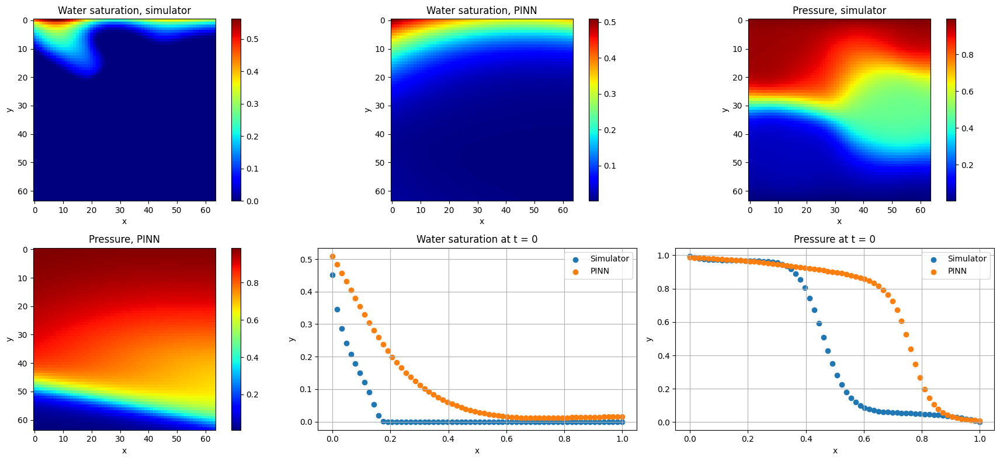

Epoch: 5420 | Loss: 0.00566 | PDE: 0.01307 | BC: 0.00129 | Data: 0.01904
Epoch: 5440 | Loss: 0.00565 | PDE: 0.01304 | BC: 0.00129 | Data: 0.01902
Epoch: 5460 | Loss: 0.00564 | PDE: 0.01300 | BC: 0.00129 | Data: 0.01899
Epoch: 5480 | Loss: 0.00563 | PDE: 0.01297 | BC: 0.00129 | Data: 0.01897
Epoch: 5500 | Loss: 0.00562 | PDE: 0.01293 | BC: 0.00128 | Data: 0.01894
Epoch: 5520 | Loss: 0.00561 | PDE: 0.01290 | BC: 0.00128 | Data: 0.01891
Epoch: 5540 | Loss: 0.00561 | PDE: 0.01286 | BC: 0.00128 | Data: 0.01888
Epoch: 5560 | Loss: 0.00560 | PDE: 0.01283 | BC: 0.00128 | Data: 0.01886
Epoch: 5580 | Loss: 0.00559 | PDE: 0.01280 | BC: 0.00127 | Data: 0.01883
Epoch: 5600 | Loss: 0.00558 | PDE: 0.01276 | BC: 0.00127 | Data: 0.01880


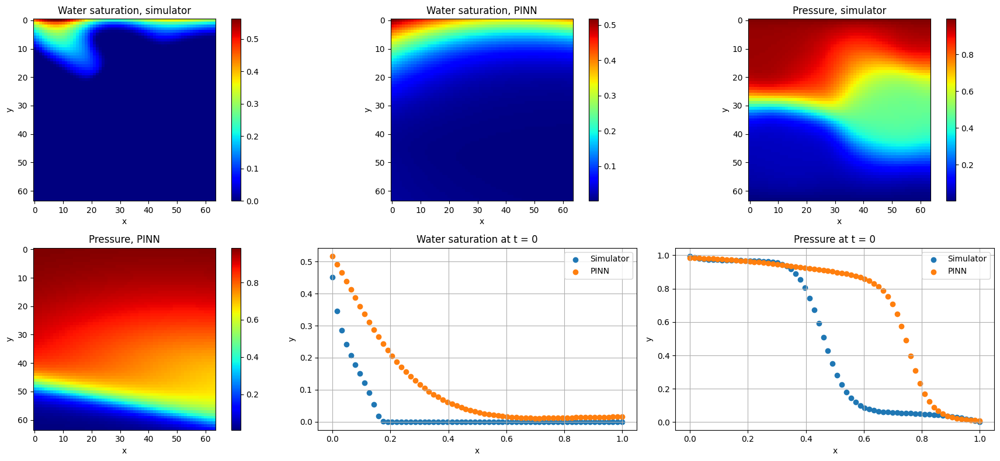

Epoch: 5620 | Loss: 0.00557 | PDE: 0.01273 | BC: 0.00127 | Data: 0.01877
Epoch: 5640 | Loss: 0.00557 | PDE: 0.01270 | BC: 0.00127 | Data: 0.01874
Epoch: 5660 | Loss: 0.00556 | PDE: 0.01267 | BC: 0.00127 | Data: 0.01871
Epoch: 5680 | Loss: 0.00555 | PDE: 0.01263 | BC: 0.00126 | Data: 0.01868
Epoch: 5700 | Loss: 0.00554 | PDE: 0.01260 | BC: 0.00126 | Data: 0.01865
Epoch: 5720 | Loss: 0.00554 | PDE: 0.01257 | BC: 0.00126 | Data: 0.01863
Epoch: 5740 | Loss: 0.00553 | PDE: 0.01255 | BC: 0.00126 | Data: 0.01860
Epoch: 5760 | Loss: 0.00552 | PDE: 0.01252 | BC: 0.00125 | Data: 0.01857
Epoch: 5780 | Loss: 0.00552 | PDE: 0.01249 | BC: 0.00125 | Data: 0.01854
Epoch: 5800 | Loss: 0.00551 | PDE: 0.01246 | BC: 0.00125 | Data: 0.01851


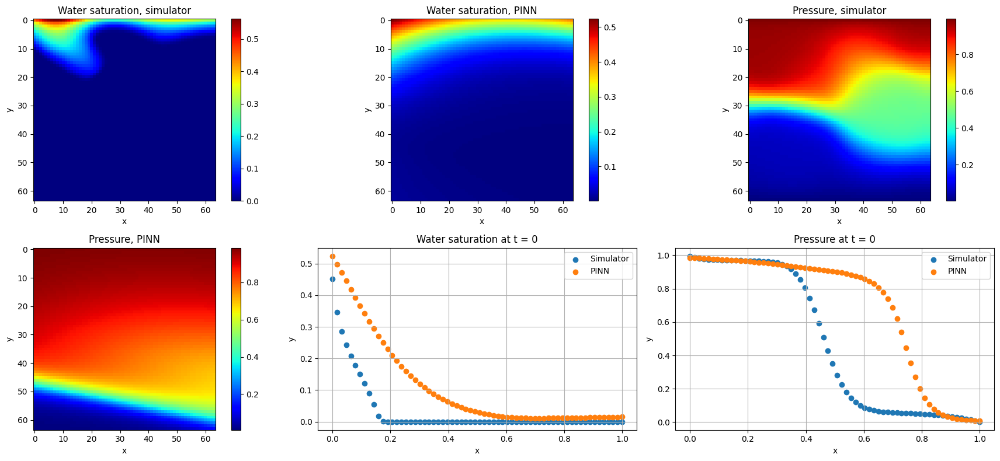

Epoch: 5820 | Loss: 0.00550 | PDE: 0.01243 | BC: 0.00125 | Data: 0.01848
Epoch: 5840 | Loss: 0.00550 | PDE: 0.01240 | BC: 0.00125 | Data: 0.01845
Epoch: 5860 | Loss: 0.00549 | PDE: 0.01238 | BC: 0.00124 | Data: 0.01842
Epoch: 5880 | Loss: 0.00548 | PDE: 0.01235 | BC: 0.00124 | Data: 0.01839
Epoch: 5900 | Loss: 0.00548 | PDE: 0.01232 | BC: 0.00124 | Data: 0.01836
Epoch: 5920 | Loss: 0.00547 | PDE: 0.01229 | BC: 0.00124 | Data: 0.01833
Epoch: 5940 | Loss: 0.00547 | PDE: 0.01227 | BC: 0.00124 | Data: 0.01830
Epoch: 5960 | Loss: 0.00546 | PDE: 0.01224 | BC: 0.00123 | Data: 0.01827
Epoch: 5980 | Loss: 0.00545 | PDE: 0.01221 | BC: 0.00123 | Data: 0.01823
Epoch: 6000 | Loss: 0.00545 | PDE: 0.01218 | BC: 0.00123 | Data: 0.01820


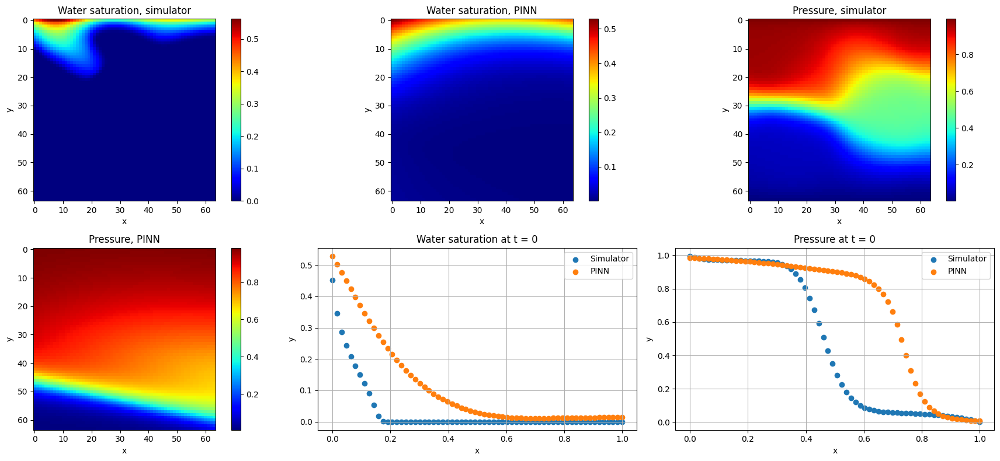

Epoch: 6020 | Loss: 0.00544 | PDE: 0.01216 | BC: 0.00123 | Data: 0.01817
Epoch: 6040 | Loss: 0.00544 | PDE: 0.01213 | BC: 0.00123 | Data: 0.01814
Epoch: 6060 | Loss: 0.00543 | PDE: 0.01211 | BC: 0.00123 | Data: 0.01811
Epoch: 6080 | Loss: 0.00543 | PDE: 0.01208 | BC: 0.00122 | Data: 0.01807
Epoch: 6100 | Loss: 0.00542 | PDE: 0.01206 | BC: 0.00122 | Data: 0.01804
Epoch: 6120 | Loss: 0.00542 | PDE: 0.01203 | BC: 0.00122 | Data: 0.01801
Epoch: 6140 | Loss: 0.00541 | PDE: 0.01201 | BC: 0.00122 | Data: 0.01798
Epoch: 6160 | Loss: 0.00541 | PDE: 0.01198 | BC: 0.00122 | Data: 0.01794
Epoch: 6180 | Loss: 0.00540 | PDE: 0.01196 | BC: 0.00122 | Data: 0.01791
Epoch: 6200 | Loss: 0.00540 | PDE: 0.01193 | BC: 0.00121 | Data: 0.01787


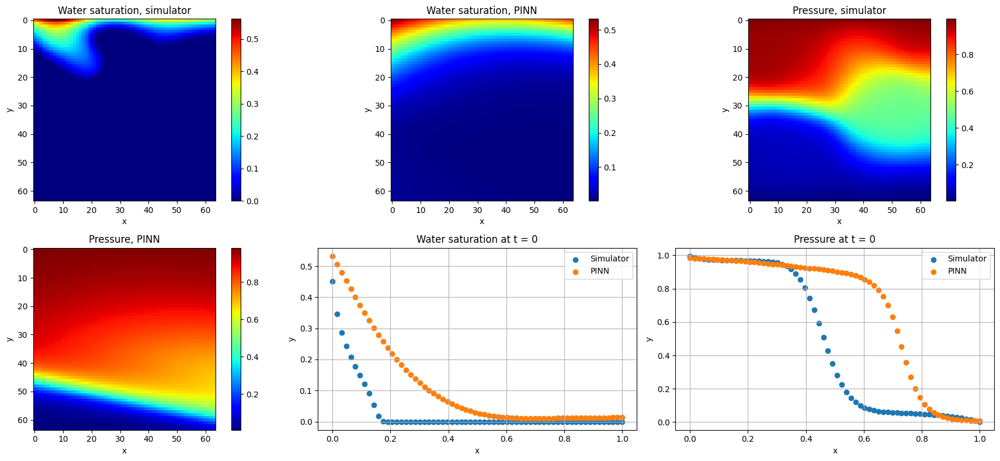

Epoch: 6220 | Loss: 0.00539 | PDE: 0.01191 | BC: 0.00121 | Data: 0.01784
Epoch: 6240 | Loss: 0.00539 | PDE: 0.01188 | BC: 0.00121 | Data: 0.01780
Epoch: 6260 | Loss: 0.00538 | PDE: 0.01185 | BC: 0.00121 | Data: 0.01776
Epoch: 6280 | Loss: 0.00537 | PDE: 0.01183 | BC: 0.00121 | Data: 0.01772
Epoch: 6300 | Loss: 0.00537 | PDE: 0.01180 | BC: 0.00121 | Data: 0.01769
Epoch: 6320 | Loss: 0.00536 | PDE: 0.01178 | BC: 0.00121 | Data: 0.01765
Epoch: 6340 | Loss: 0.00536 | PDE: 0.01175 | BC: 0.00120 | Data: 0.01762
Epoch: 6360 | Loss: 0.00535 | PDE: 0.01173 | BC: 0.00120 | Data: 0.01758
Epoch: 6380 | Loss: 0.00535 | PDE: 0.01171 | BC: 0.00120 | Data: 0.01754
Epoch: 6400 | Loss: 0.00534 | PDE: 0.01168 | BC: 0.00120 | Data: 0.01751


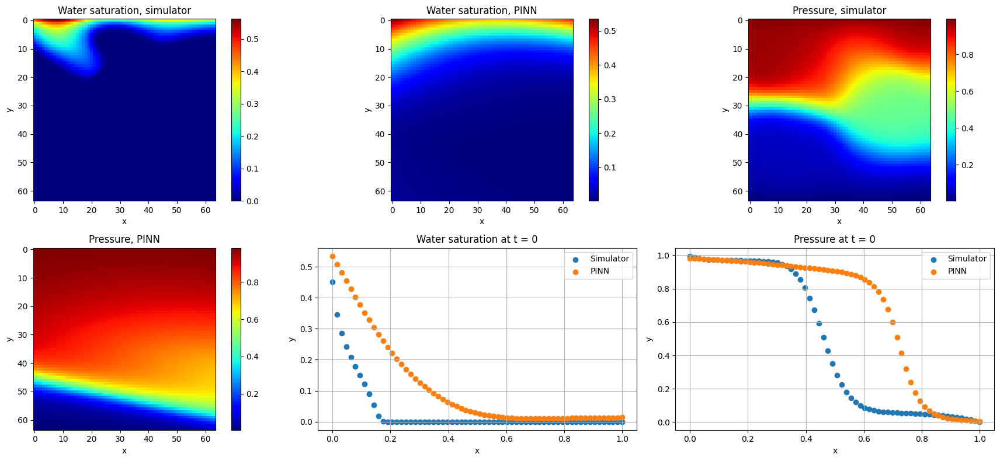

Epoch: 6420 | Loss: 0.00534 | PDE: 0.01166 | BC: 0.00120 | Data: 0.01747
Epoch: 6440 | Loss: 0.00533 | PDE: 0.01163 | BC: 0.00120 | Data: 0.01743
Epoch: 6460 | Loss: 0.00533 | PDE: 0.01161 | BC: 0.00120 | Data: 0.01739
Epoch: 6480 | Loss: 0.00532 | PDE: 0.01158 | BC: 0.00119 | Data: 0.01735
Epoch: 6500 | Loss: 0.00535 | PDE: 0.01157 | BC: 0.00119 | Data: 0.01731
Epoch: 6520 | Loss: 0.00531 | PDE: 0.01153 | BC: 0.00119 | Data: 0.01727
Epoch: 6540 | Loss: 0.00531 | PDE: 0.01151 | BC: 0.00119 | Data: 0.01723
Epoch: 6560 | Loss: 0.00530 | PDE: 0.01148 | BC: 0.00119 | Data: 0.01719
Epoch: 6580 | Loss: 0.00529 | PDE: 0.01146 | BC: 0.00119 | Data: 0.01715
Epoch: 6600 | Loss: 0.00529 | PDE: 0.01143 | BC: 0.00118 | Data: 0.01711


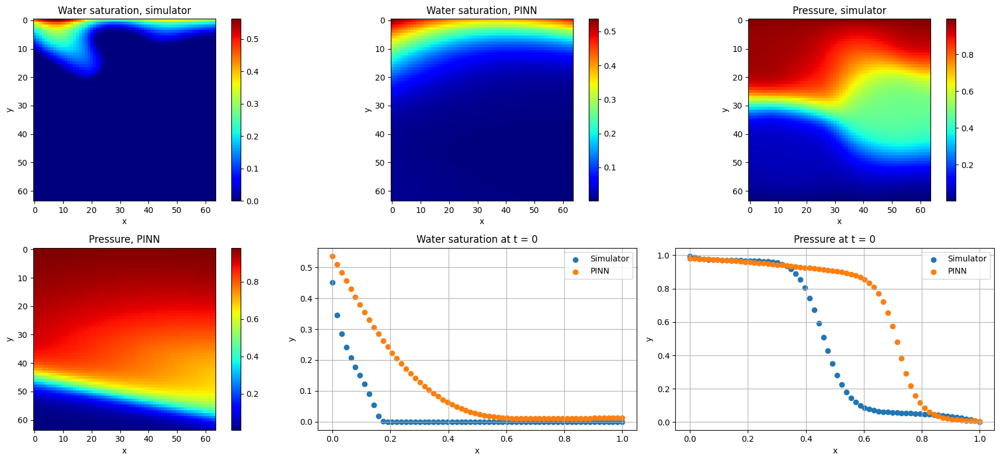

Epoch: 6620 | Loss: 0.00528 | PDE: 0.01141 | BC: 0.00118 | Data: 0.01707
Epoch: 6640 | Loss: 0.00528 | PDE: 0.01138 | BC: 0.00118 | Data: 0.01703
Epoch: 6660 | Loss: 0.00527 | PDE: 0.01136 | BC: 0.00118 | Data: 0.01699
Epoch: 6680 | Loss: 0.00526 | PDE: 0.01133 | BC: 0.00118 | Data: 0.01695
Epoch: 6700 | Loss: 0.00526 | PDE: 0.01131 | BC: 0.00118 | Data: 0.01691
Epoch: 6720 | Loss: 0.00525 | PDE: 0.01128 | BC: 0.00117 | Data: 0.01687
Epoch: 6740 | Loss: 0.00524 | PDE: 0.01126 | BC: 0.00117 | Data: 0.01682
Epoch: 6760 | Loss: 0.00524 | PDE: 0.01123 | BC: 0.00117 | Data: 0.01678
Epoch: 6780 | Loss: 0.00523 | PDE: 0.01121 | BC: 0.00117 | Data: 0.01674
Epoch: 6800 | Loss: 0.00522 | PDE: 0.01118 | BC: 0.00117 | Data: 0.01670


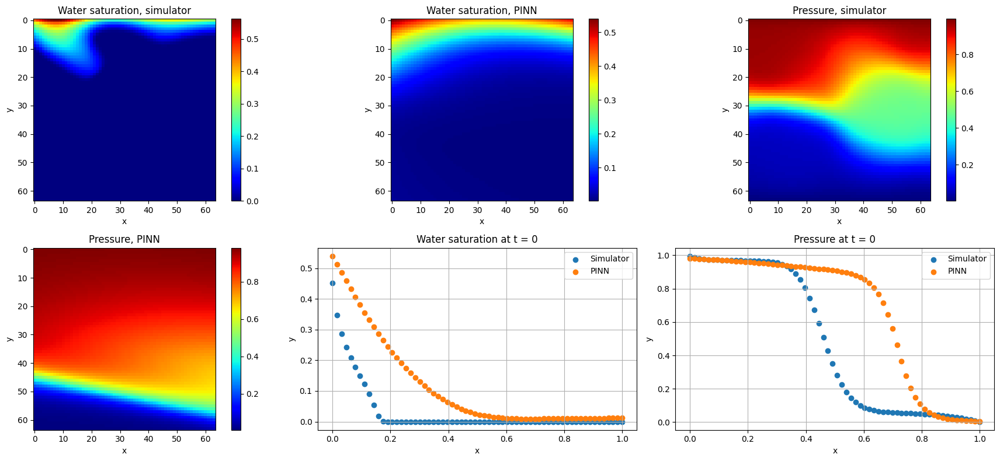

Epoch: 6820 | Loss: 0.00522 | PDE: 0.01116 | BC: 0.00117 | Data: 0.01665
Epoch: 6840 | Loss: 0.00522 | PDE: 0.01114 | BC: 0.00116 | Data: 0.01660
Epoch: 6860 | Loss: 0.00520 | PDE: 0.01110 | BC: 0.00116 | Data: 0.01656
Epoch: 6880 | Loss: 0.00519 | PDE: 0.01108 | BC: 0.00116 | Data: 0.01652
Epoch: 6900 | Loss: 0.00518 | PDE: 0.01105 | BC: 0.00116 | Data: 0.01647
Epoch: 6920 | Loss: 0.00518 | PDE: 0.01103 | BC: 0.00116 | Data: 0.01643
Epoch: 6940 | Loss: 0.00517 | PDE: 0.01100 | BC: 0.00115 | Data: 0.01639
Epoch: 6960 | Loss: 0.00516 | PDE: 0.01098 | BC: 0.00115 | Data: 0.01635
Epoch: 6980 | Loss: 0.00515 | PDE: 0.01095 | BC: 0.00115 | Data: 0.01630
Epoch: 7000 | Loss: 0.00515 | PDE: 0.01093 | BC: 0.00115 | Data: 0.01626


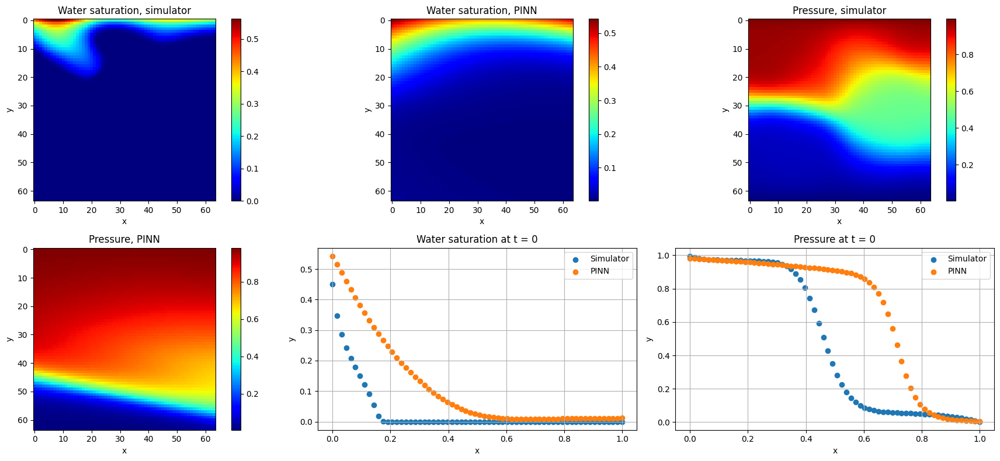

Epoch: 7020 | Loss: 0.00514 | PDE: 0.01090 | BC: 0.00115 | Data: 0.01622
Epoch: 7040 | Loss: 0.00513 | PDE: 0.01088 | BC: 0.00114 | Data: 0.01617
Epoch: 7060 | Loss: 0.00512 | PDE: 0.01085 | BC: 0.00114 | Data: 0.01613
Epoch: 7080 | Loss: 0.00511 | PDE: 0.01082 | BC: 0.00114 | Data: 0.01608
Epoch: 7100 | Loss: 0.00510 | PDE: 0.01080 | BC: 0.00114 | Data: 0.01604
Epoch: 7120 | Loss: 0.00509 | PDE: 0.01077 | BC: 0.00113 | Data: 0.01599
Epoch: 7140 | Loss: 0.00509 | PDE: 0.01074 | BC: 0.00113 | Data: 0.01594
Epoch: 7160 | Loss: 0.00512 | PDE: 0.01074 | BC: 0.00113 | Data: 0.01589
Epoch: 7180 | Loss: 0.00508 | PDE: 0.01070 | BC: 0.00113 | Data: 0.01584
Epoch: 7200 | Loss: 0.00506 | PDE: 0.01066 | BC: 0.00112 | Data: 0.01580


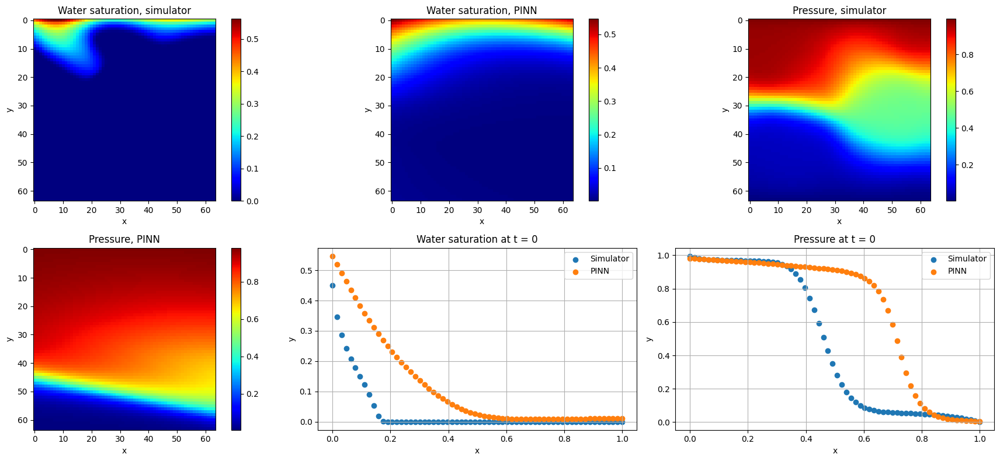

Epoch: 7220 | Loss: 0.00505 | PDE: 0.01064 | BC: 0.00112 | Data: 0.01576
Epoch: 7240 | Loss: 0.00504 | PDE: 0.01062 | BC: 0.00112 | Data: 0.01571
Epoch: 7260 | Loss: 0.00503 | PDE: 0.01059 | BC: 0.00112 | Data: 0.01567
Epoch: 7280 | Loss: 0.00502 | PDE: 0.01057 | BC: 0.00111 | Data: 0.01562
Epoch: 7300 | Loss: 0.00501 | PDE: 0.01054 | BC: 0.00111 | Data: 0.01558
Epoch: 7320 | Loss: 0.00500 | PDE: 0.01052 | BC: 0.00111 | Data: 0.01553
Epoch: 7340 | Loss: 0.00499 | PDE: 0.01049 | BC: 0.00111 | Data: 0.01548
Epoch: 7360 | Loss: 0.00499 | PDE: 0.01047 | BC: 0.00110 | Data: 0.01544
Epoch: 7380 | Loss: 0.00498 | PDE: 0.01044 | BC: 0.00110 | Data: 0.01539
Epoch: 7400 | Loss: 0.00497 | PDE: 0.01041 | BC: 0.00110 | Data: 0.01534


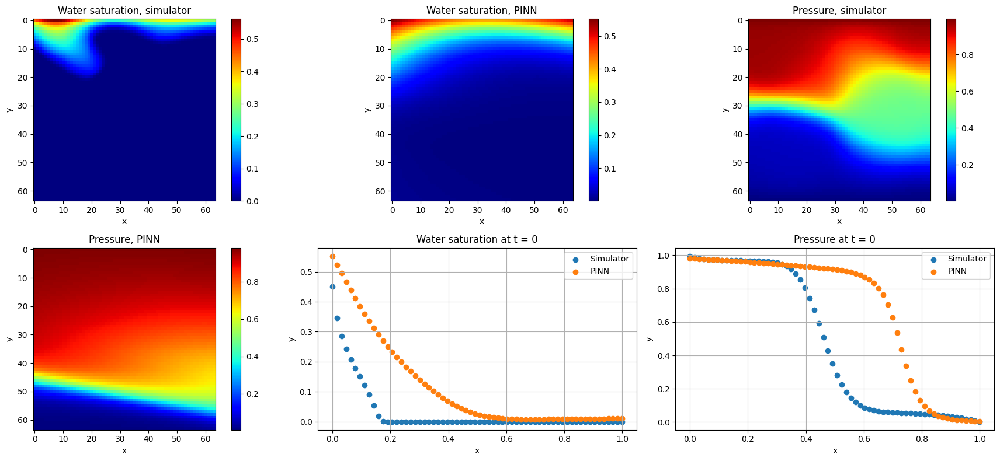

Epoch: 7420 | Loss: 0.00496 | PDE: 0.01039 | BC: 0.00110 | Data: 0.01529
Epoch: 7440 | Loss: 0.00495 | PDE: 0.01036 | BC: 0.00109 | Data: 0.01524
Epoch: 7460 | Loss: 0.00494 | PDE: 0.01034 | BC: 0.00109 | Data: 0.01519
Epoch: 7480 | Loss: 0.00493 | PDE: 0.01031 | BC: 0.00109 | Data: 0.01514
Epoch: 7500 | Loss: 0.00492 | PDE: 0.01028 | BC: 0.00108 | Data: 0.01509
Epoch: 7520 | Loss: 0.00491 | PDE: 0.01026 | BC: 0.00108 | Data: 0.01505
Epoch: 7540 | Loss: 0.00490 | PDE: 0.01024 | BC: 0.00108 | Data: 0.01500
Epoch: 7560 | Loss: 0.00489 | PDE: 0.01021 | BC: 0.00108 | Data: 0.01495
Epoch: 7580 | Loss: 0.00488 | PDE: 0.01019 | BC: 0.00107 | Data: 0.01490
Epoch: 7600 | Loss: 0.00487 | PDE: 0.01017 | BC: 0.00107 | Data: 0.01485


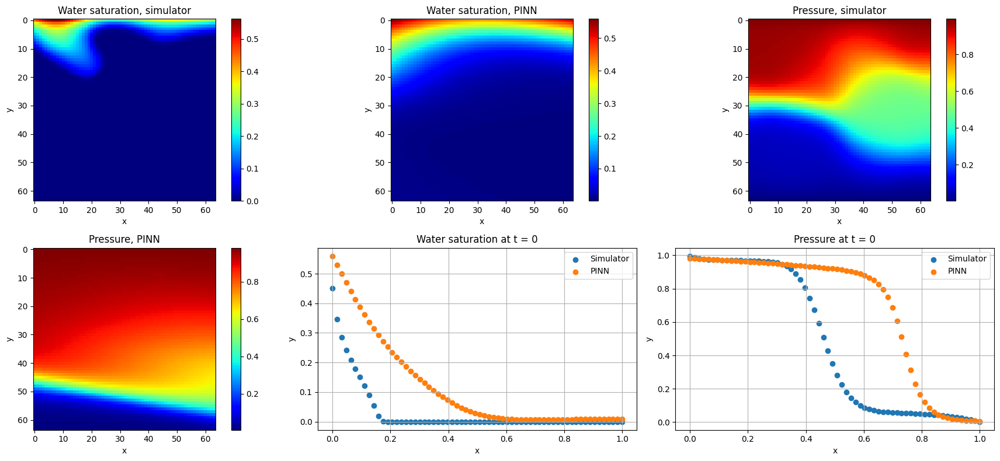

Epoch: 7620 | Loss: 0.00486 | PDE: 0.01014 | BC: 0.00107 | Data: 0.01481
Epoch: 7640 | Loss: 0.00486 | PDE: 0.01012 | BC: 0.00107 | Data: 0.01476
Epoch: 7660 | Loss: 0.00485 | PDE: 0.01009 | BC: 0.00107 | Data: 0.01471
Epoch: 7680 | Loss: 0.00484 | PDE: 0.01007 | BC: 0.00106 | Data: 0.01465
Epoch: 7700 | Loss: 0.00483 | PDE: 0.01005 | BC: 0.00106 | Data: 0.01460
Epoch: 7720 | Loss: 0.00482 | PDE: 0.01002 | BC: 0.00106 | Data: 0.01455
Epoch: 7740 | Loss: 0.00485 | PDE: 0.01003 | BC: 0.00106 | Data: 0.01449
Epoch: 7760 | Loss: 0.00481 | PDE: 0.00998 | BC: 0.00105 | Data: 0.01444
Epoch: 7780 | Loss: 0.00479 | PDE: 0.00995 | BC: 0.00105 | Data: 0.01439
Epoch: 7800 | Loss: 0.00478 | PDE: 0.00992 | BC: 0.00105 | Data: 0.01434


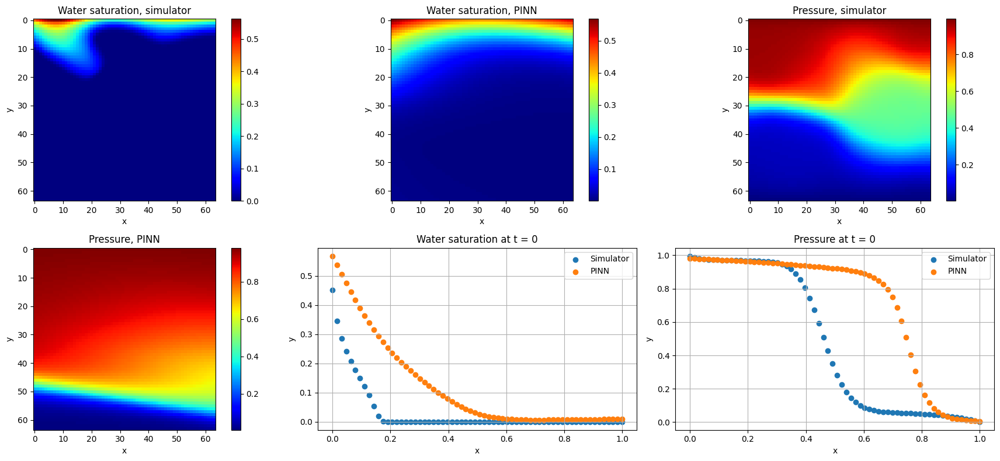

Epoch: 7820 | Loss: 0.00477 | PDE: 0.00990 | BC: 0.00105 | Data: 0.01429
Epoch: 7840 | Loss: 0.00476 | PDE: 0.00988 | BC: 0.00104 | Data: 0.01425
Epoch: 7860 | Loss: 0.00475 | PDE: 0.00986 | BC: 0.00104 | Data: 0.01420
Epoch: 7880 | Loss: 0.00474 | PDE: 0.00983 | BC: 0.00104 | Data: 0.01415
Epoch: 7900 | Loss: 0.00473 | PDE: 0.00981 | BC: 0.00104 | Data: 0.01410
Epoch: 7920 | Loss: 0.00473 | PDE: 0.00979 | BC: 0.00103 | Data: 0.01405
Epoch: 7940 | Loss: 0.00472 | PDE: 0.00977 | BC: 0.00103 | Data: 0.01400
Epoch: 7960 | Loss: 0.00471 | PDE: 0.00974 | BC: 0.00103 | Data: 0.01395
Epoch: 7980 | Loss: 0.00470 | PDE: 0.00972 | BC: 0.00103 | Data: 0.01390
Epoch: 8000 | Loss: 0.00468 | PDE: 0.00969 | BC: 0.00102 | Data: 0.01385


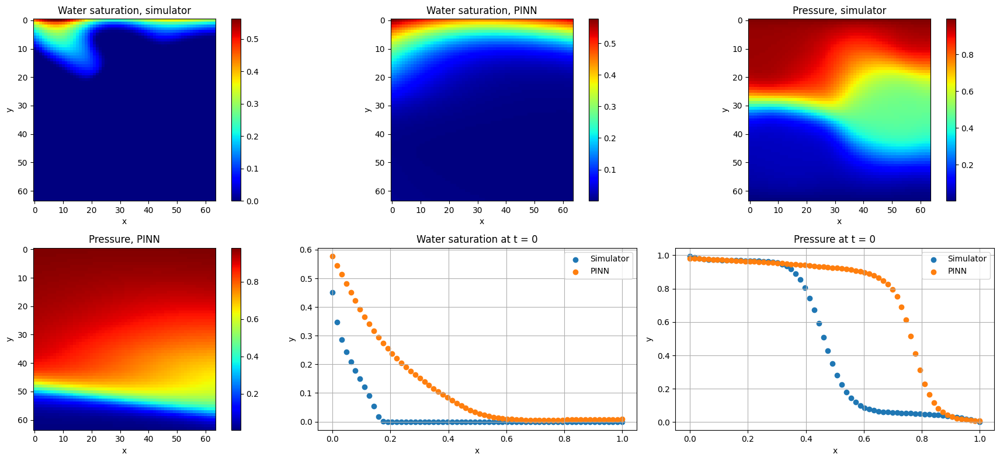

Epoch: 8020 | Loss: 0.00467 | PDE: 0.00967 | BC: 0.00102 | Data: 0.01380
Epoch: 8040 | Loss: 0.00466 | PDE: 0.00965 | BC: 0.00102 | Data: 0.01374
Epoch: 8060 | Loss: 0.00465 | PDE: 0.00962 | BC: 0.00102 | Data: 0.01369
Epoch: 8080 | Loss: 0.00464 | PDE: 0.00960 | BC: 0.00101 | Data: 0.01364
Epoch: 8100 | Loss: 0.00463 | PDE: 0.00957 | BC: 0.00101 | Data: 0.01359
Epoch: 8120 | Loss: 0.00462 | PDE: 0.00955 | BC: 0.00101 | Data: 0.01354
Epoch: 8140 | Loss: 0.00461 | PDE: 0.00953 | BC: 0.00101 | Data: 0.01349
Epoch: 8160 | Loss: 0.00460 | PDE: 0.00951 | BC: 0.00100 | Data: 0.01345
Epoch: 8180 | Loss: 0.00459 | PDE: 0.00948 | BC: 0.00100 | Data: 0.01340
Epoch: 8200 | Loss: 0.00458 | PDE: 0.00946 | BC: 0.00100 | Data: 0.01335


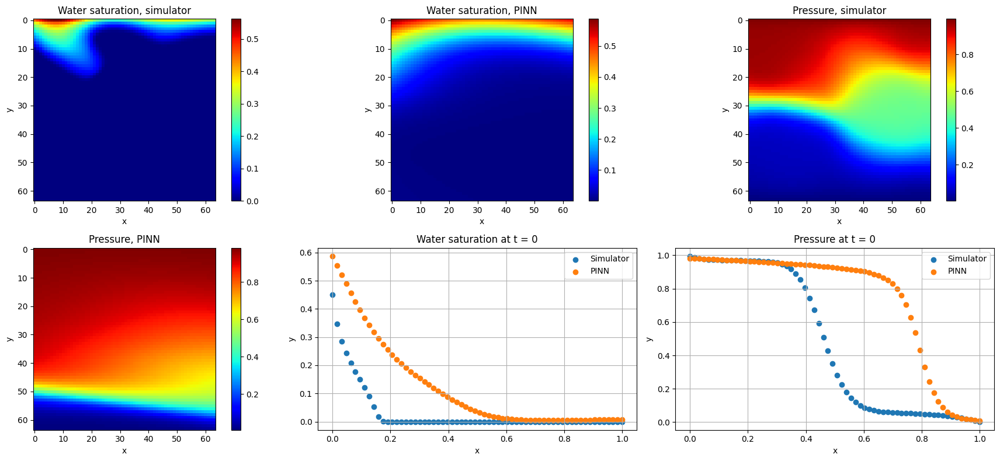

Epoch: 8220 | Loss: 0.00456 | PDE: 0.00944 | BC: 0.00100 | Data: 0.01330
Epoch: 8240 | Loss: 0.00455 | PDE: 0.00941 | BC: 0.00099 | Data: 0.01325
Epoch: 8260 | Loss: 0.00454 | PDE: 0.00939 | BC: 0.00099 | Data: 0.01320
Epoch: 8280 | Loss: 0.00453 | PDE: 0.00936 | BC: 0.00099 | Data: 0.01316
Epoch: 8300 | Loss: 0.00452 | PDE: 0.00934 | BC: 0.00099 | Data: 0.01311
Epoch: 8320 | Loss: 0.00450 | PDE: 0.00931 | BC: 0.00098 | Data: 0.01306
Epoch: 8340 | Loss: 0.00449 | PDE: 0.00929 | BC: 0.00098 | Data: 0.01301
Epoch: 8360 | Loss: 0.00447 | PDE: 0.00926 | BC: 0.00098 | Data: 0.01296
Epoch: 8380 | Loss: 0.00447 | PDE: 0.00924 | BC: 0.00098 | Data: 0.01291
Epoch: 8400 | Loss: 0.00445 | PDE: 0.00922 | BC: 0.00097 | Data: 0.01286


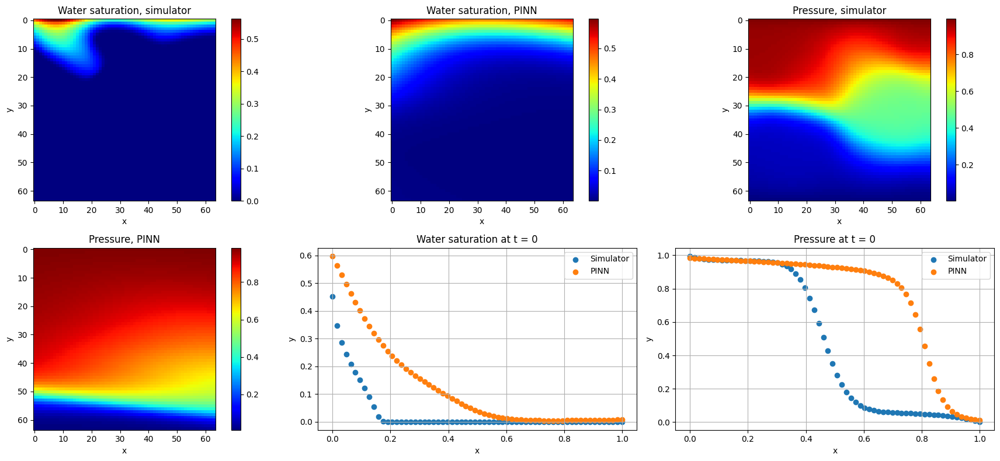

Epoch: 8420 | Loss: 0.00444 | PDE: 0.00919 | BC: 0.00097 | Data: 0.01282
Epoch: 8440 | Loss: 0.00443 | PDE: 0.00917 | BC: 0.00097 | Data: 0.01277
Epoch: 8460 | Loss: 0.00442 | PDE: 0.00914 | BC: 0.00097 | Data: 0.01273
Epoch: 8480 | Loss: 0.00440 | PDE: 0.00912 | BC: 0.00096 | Data: 0.01268
Epoch: 8500 | Loss: 0.00439 | PDE: 0.00910 | BC: 0.00096 | Data: 0.01264
Epoch: 8520 | Loss: 0.00438 | PDE: 0.00907 | BC: 0.00096 | Data: 0.01260
Epoch: 8540 | Loss: 0.00436 | PDE: 0.00905 | BC: 0.00096 | Data: 0.01255
Epoch: 8560 | Loss: 0.00435 | PDE: 0.00902 | BC: 0.00095 | Data: 0.01251
Epoch: 8580 | Loss: 0.00434 | PDE: 0.00900 | BC: 0.00095 | Data: 0.01246
Epoch: 8600 | Loss: 0.00432 | PDE: 0.00898 | BC: 0.00095 | Data: 0.01242


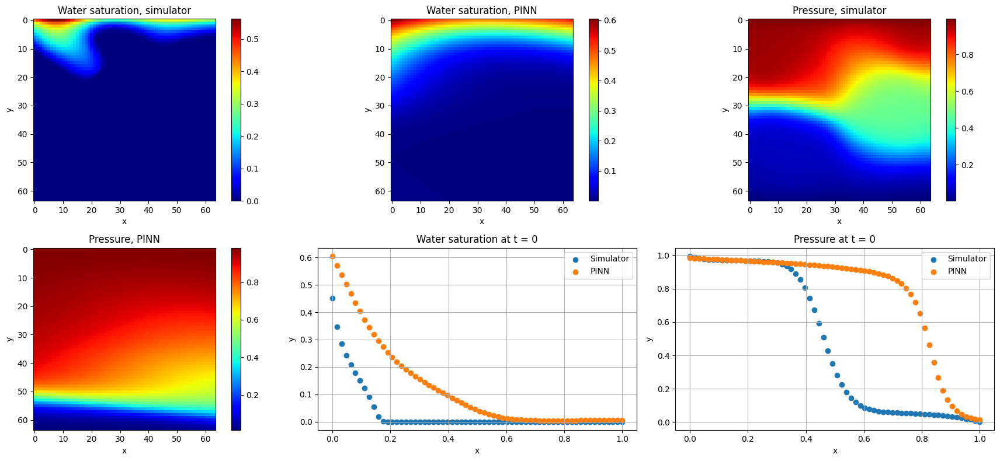

Epoch: 8620 | Loss: 0.00431 | PDE: 0.00895 | BC: 0.00095 | Data: 0.01238
Epoch: 8640 | Loss: 0.00429 | PDE: 0.00893 | BC: 0.00094 | Data: 0.01233
Epoch: 8660 | Loss: 0.00428 | PDE: 0.00890 | BC: 0.00094 | Data: 0.01229
Epoch: 8680 | Loss: 0.00427 | PDE: 0.00888 | BC: 0.00094 | Data: 0.01225
Epoch: 8700 | Loss: 0.00425 | PDE: 0.00885 | BC: 0.00093 | Data: 0.01220
Epoch: 8720 | Loss: 0.00424 | PDE: 0.00883 | BC: 0.00093 | Data: 0.01216
Epoch: 8740 | Loss: 0.00423 | PDE: 0.00881 | BC: 0.00093 | Data: 0.01212
Epoch: 8760 | Loss: 0.00421 | PDE: 0.00878 | BC: 0.00093 | Data: 0.01209
Epoch: 8780 | Loss: 0.00420 | PDE: 0.00876 | BC: 0.00092 | Data: 0.01205
Epoch: 8800 | Loss: 0.00419 | PDE: 0.00874 | BC: 0.00092 | Data: 0.01201


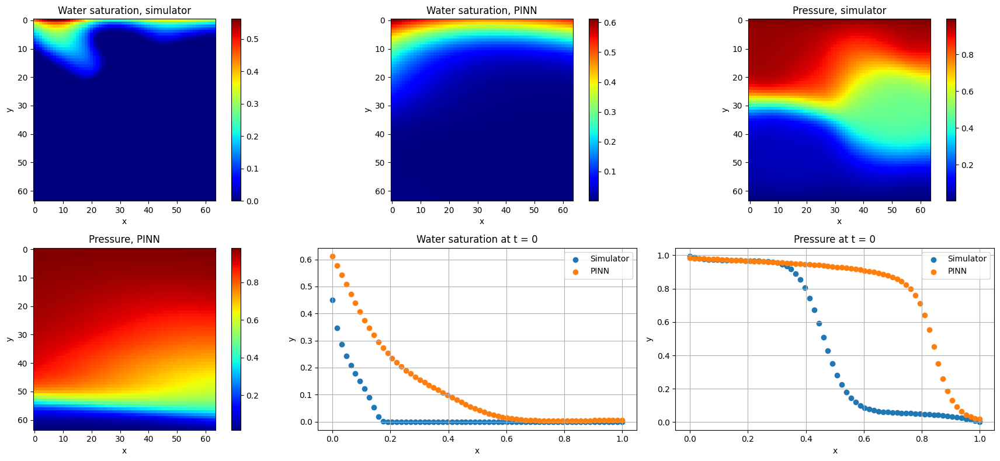

Epoch: 8820 | Loss: 0.00417 | PDE: 0.00871 | BC: 0.00092 | Data: 0.01197
Epoch: 8840 | Loss: 0.00416 | PDE: 0.00869 | BC: 0.00092 | Data: 0.01193
Epoch: 8860 | Loss: 0.00415 | PDE: 0.00867 | BC: 0.00091 | Data: 0.01189
Epoch: 8880 | Loss: 0.00413 | PDE: 0.00864 | BC: 0.00091 | Data: 0.01185
Epoch: 8900 | Loss: 0.00412 | PDE: 0.00862 | BC: 0.00091 | Data: 0.01182
Epoch: 8920 | Loss: 0.00411 | PDE: 0.00860 | BC: 0.00091 | Data: 0.01178
Epoch: 8940 | Loss: 0.00409 | PDE: 0.00858 | BC: 0.00090 | Data: 0.01174
Epoch: 8960 | Loss: 0.00408 | PDE: 0.00855 | BC: 0.00090 | Data: 0.01170
Epoch: 8980 | Loss: 0.00406 | PDE: 0.00853 | BC: 0.00090 | Data: 0.01166
Epoch: 9000 | Loss: 0.00404 | PDE: 0.00850 | BC: 0.00089 | Data: 0.01163


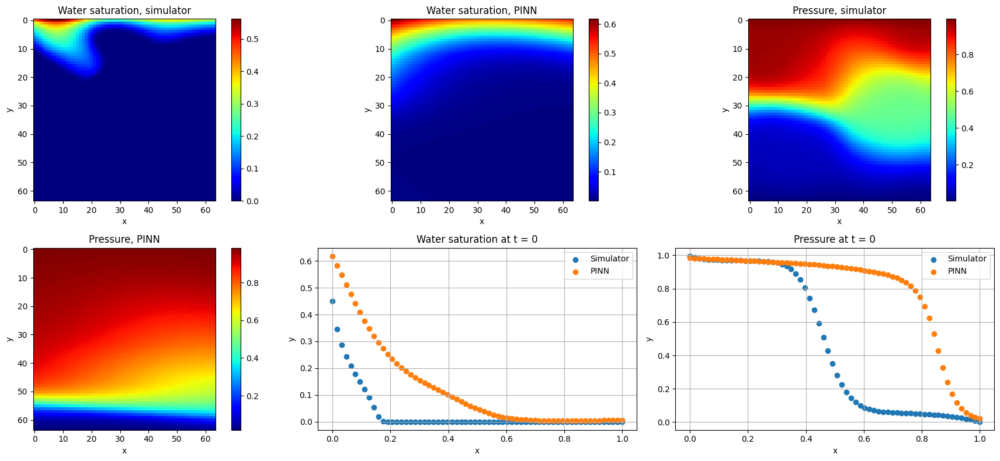

Epoch: 9020 | Loss: 0.00403 | PDE: 0.00848 | BC: 0.00089 | Data: 0.01159
Epoch: 9040 | Loss: 0.00402 | PDE: 0.00846 | BC: 0.00089 | Data: 0.01156
Epoch: 9060 | Loss: 0.00401 | PDE: 0.00844 | BC: 0.00089 | Data: 0.01153
Epoch: 9080 | Loss: 0.00400 | PDE: 0.00842 | BC: 0.00089 | Data: 0.01149
Epoch: 9100 | Loss: 0.00399 | PDE: 0.00840 | BC: 0.00088 | Data: 0.01146
Epoch: 9120 | Loss: 0.00398 | PDE: 0.00838 | BC: 0.00088 | Data: 0.01143
Epoch: 9140 | Loss: 0.00396 | PDE: 0.00836 | BC: 0.00088 | Data: 0.01139
Epoch: 9160 | Loss: 0.00395 | PDE: 0.00834 | BC: 0.00088 | Data: 0.01136
Epoch: 9180 | Loss: 0.00394 | PDE: 0.00832 | BC: 0.00087 | Data: 0.01133
Epoch: 9200 | Loss: 0.00393 | PDE: 0.00830 | BC: 0.00087 | Data: 0.01129


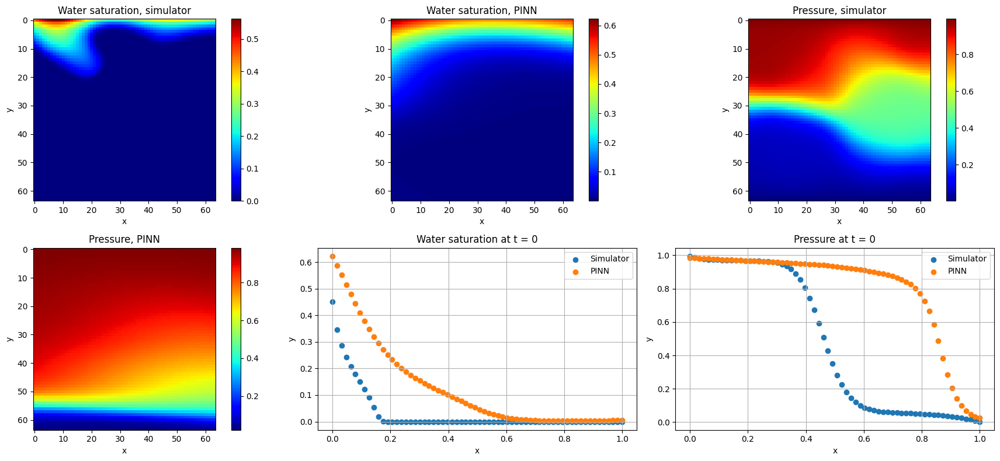

Epoch: 9220 | Loss: 0.00391 | PDE: 0.00827 | BC: 0.00087 | Data: 0.01126
Epoch: 9240 | Loss: 0.00390 | PDE: 0.00825 | BC: 0.00087 | Data: 0.01123
Epoch: 9260 | Loss: 0.00389 | PDE: 0.00823 | BC: 0.00086 | Data: 0.01119
Epoch: 9280 | Loss: 0.00387 | PDE: 0.00821 | BC: 0.00086 | Data: 0.01116
Epoch: 9300 | Loss: 0.00386 | PDE: 0.00819 | BC: 0.00086 | Data: 0.01113
Epoch: 9320 | Loss: 0.00385 | PDE: 0.00817 | BC: 0.00086 | Data: 0.01110
Epoch: 9340 | Loss: 0.00384 | PDE: 0.00815 | BC: 0.00085 | Data: 0.01107
Epoch: 9360 | Loss: 0.00383 | PDE: 0.00813 | BC: 0.00085 | Data: 0.01104
Epoch: 9380 | Loss: 0.00382 | PDE: 0.00812 | BC: 0.00085 | Data: 0.01101
Epoch: 9400 | Loss: 0.00381 | PDE: 0.00810 | BC: 0.00085 | Data: 0.01098


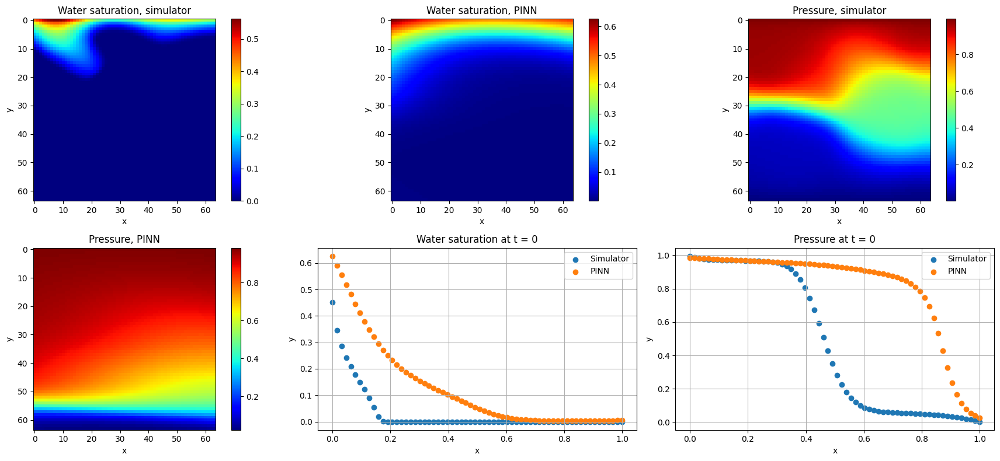

Epoch: 9420 | Loss: 0.00379 | PDE: 0.00808 | BC: 0.00085 | Data: 0.01095
Epoch: 9440 | Loss: 0.00378 | PDE: 0.00806 | BC: 0.00084 | Data: 0.01092
Epoch: 9460 | Loss: 0.00377 | PDE: 0.00804 | BC: 0.00084 | Data: 0.01089
Epoch: 9480 | Loss: 0.00376 | PDE: 0.00802 | BC: 0.00084 | Data: 0.01086
Epoch: 9500 | Loss: 0.00375 | PDE: 0.00800 | BC: 0.00084 | Data: 0.01084
Epoch: 9520 | Loss: 0.00374 | PDE: 0.00798 | BC: 0.00084 | Data: 0.01081
Epoch: 9540 | Loss: 0.00373 | PDE: 0.00797 | BC: 0.00083 | Data: 0.01078
Epoch: 9560 | Loss: 0.00372 | PDE: 0.00795 | BC: 0.00083 | Data: 0.01075
Epoch: 9580 | Loss: 0.00370 | PDE: 0.00793 | BC: 0.00083 | Data: 0.01072
Epoch: 9600 | Loss: 0.00369 | PDE: 0.00791 | BC: 0.00083 | Data: 0.01069


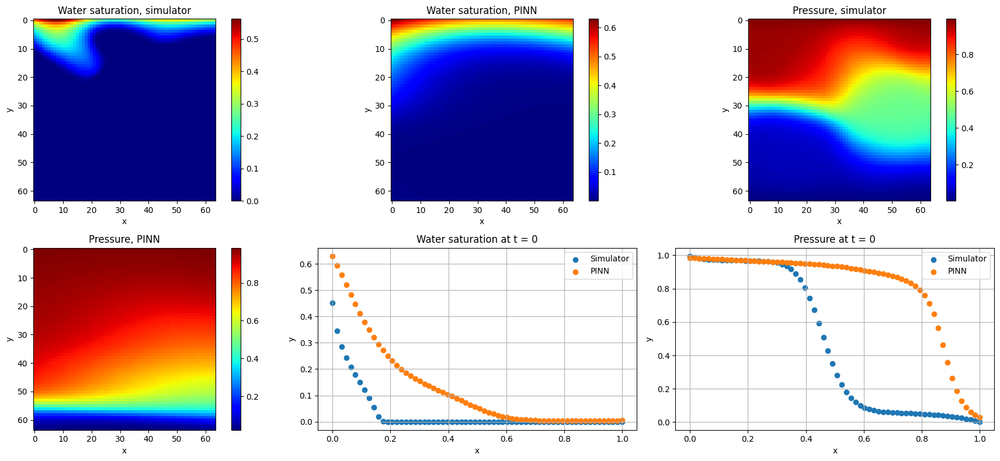

Epoch: 9620 | Loss: 0.00368 | PDE: 0.00789 | BC: 0.00083 | Data: 0.01066
Epoch: 9640 | Loss: 0.00367 | PDE: 0.00788 | BC: 0.00082 | Data: 0.01064
Epoch: 9660 | Loss: 0.00366 | PDE: 0.00786 | BC: 0.00082 | Data: 0.01061
Epoch: 9680 | Loss: 0.00365 | PDE: 0.00784 | BC: 0.00082 | Data: 0.01059
Epoch: 9700 | Loss: 0.00364 | PDE: 0.00783 | BC: 0.00082 | Data: 0.01056
Epoch: 9720 | Loss: 0.00363 | PDE: 0.00781 | BC: 0.00082 | Data: 0.01054
Epoch: 9740 | Loss: 0.00362 | PDE: 0.00779 | BC: 0.00081 | Data: 0.01051
Epoch: 9760 | Loss: 0.00361 | PDE: 0.00778 | BC: 0.00081 | Data: 0.01048
Epoch: 9780 | Loss: 0.00360 | PDE: 0.00776 | BC: 0.00081 | Data: 0.01046
Epoch: 9800 | Loss: 0.00359 | PDE: 0.00774 | BC: 0.00081 | Data: 0.01043


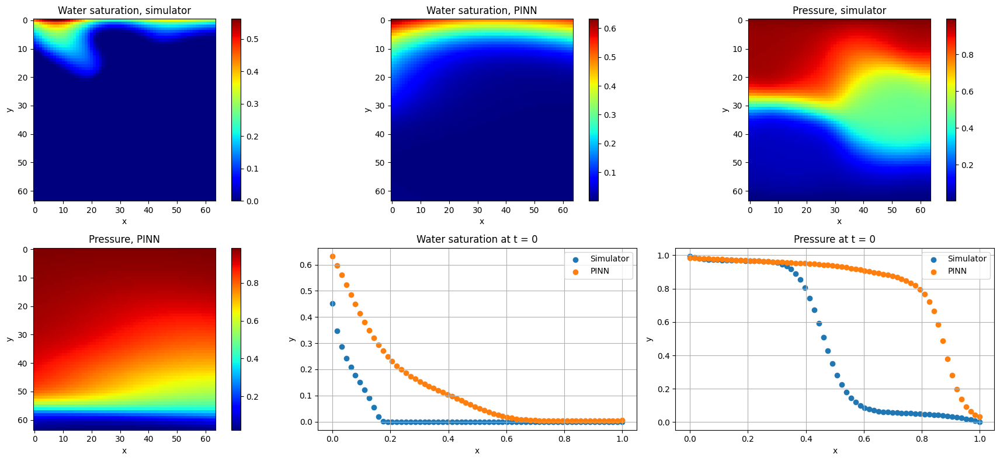

Epoch: 9820 | Loss: 0.00358 | PDE: 0.00773 | BC: 0.00081 | Data: 0.01041
Epoch: 9840 | Loss: 0.00357 | PDE: 0.00771 | BC: 0.00080 | Data: 0.01038
Epoch: 9860 | Loss: 0.00356 | PDE: 0.00769 | BC: 0.00080 | Data: 0.01036
Epoch: 9880 | Loss: 0.00355 | PDE: 0.00767 | BC: 0.00080 | Data: 0.01033
Epoch: 9900 | Loss: 0.00354 | PDE: 0.00766 | BC: 0.00080 | Data: 0.01030
Epoch: 9920 | Loss: 0.00353 | PDE: 0.00764 | BC: 0.00080 | Data: 0.01028
Epoch: 9940 | Loss: 0.00352 | PDE: 0.00763 | BC: 0.00080 | Data: 0.01026
Epoch: 9960 | Loss: 0.00351 | PDE: 0.00761 | BC: 0.00079 | Data: 0.01024
Epoch: 9980 | Loss: 0.00351 | PDE: 0.00760 | BC: 0.00079 | Data: 0.01021
Epoch: 10000 | Loss: 0.00350 | PDE: 0.00758 | BC: 0.00079 | Data: 0.01019


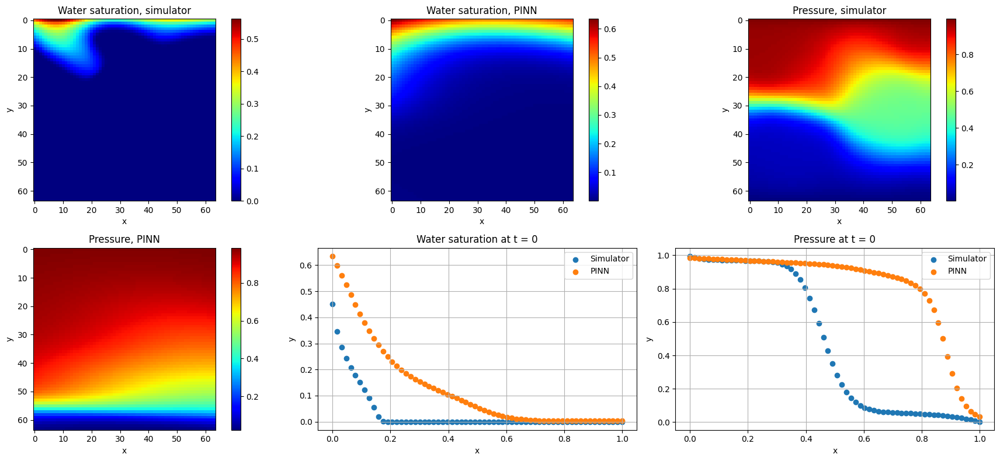

Epoch: 10020 | Loss: 0.00349 | PDE: 0.00757 | BC: 0.00079 | Data: 0.01017
Epoch: 10040 | Loss: 0.00348 | PDE: 0.00755 | BC: 0.00079 | Data: 0.01014
Epoch: 10060 | Loss: 0.00347 | PDE: 0.00753 | BC: 0.00079 | Data: 0.01012
Epoch: 10080 | Loss: 0.00346 | PDE: 0.00752 | BC: 0.00078 | Data: 0.01010
Epoch: 10100 | Loss: 0.00345 | PDE: 0.00750 | BC: 0.00078 | Data: 0.01008
Epoch: 10120 | Loss: 0.00344 | PDE: 0.00749 | BC: 0.00078 | Data: 0.01005
Epoch: 10140 | Loss: 0.00343 | PDE: 0.00747 | BC: 0.00078 | Data: 0.01003
Epoch: 10160 | Loss: 0.00342 | PDE: 0.00746 | BC: 0.00078 | Data: 0.01001
Epoch: 10180 | Loss: 0.00341 | PDE: 0.00744 | BC: 0.00078 | Data: 0.00999
Epoch: 10200 | Loss: 0.00340 | PDE: 0.00742 | BC: 0.00077 | Data: 0.00996


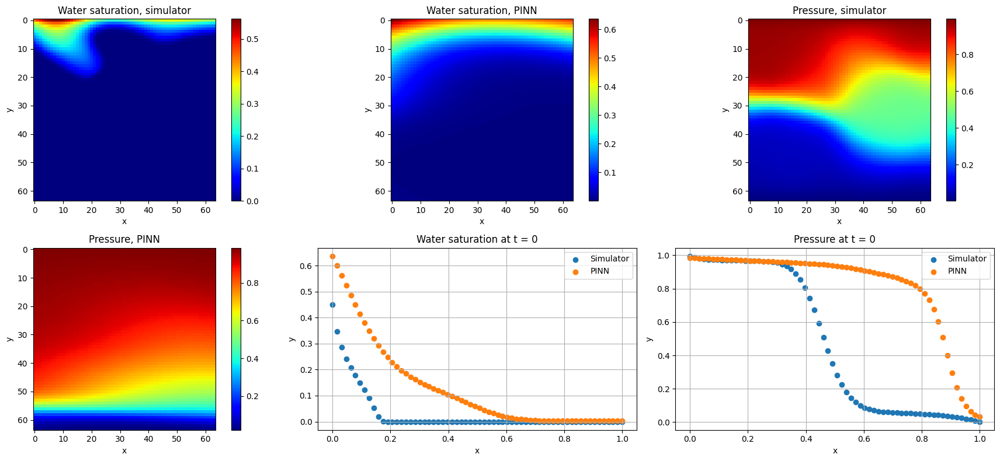

Epoch: 10220 | Loss: 0.00340 | PDE: 0.00741 | BC: 0.00077 | Data: 0.00994
Epoch: 10240 | Loss: 0.00339 | PDE: 0.00740 | BC: 0.00077 | Data: 0.00992
Epoch: 10260 | Loss: 0.00338 | PDE: 0.00738 | BC: 0.00077 | Data: 0.00990
Epoch: 10280 | Loss: 0.00337 | PDE: 0.00737 | BC: 0.00077 | Data: 0.00988
Epoch: 10300 | Loss: 0.00336 | PDE: 0.00735 | BC: 0.00077 | Data: 0.00986
Epoch: 10320 | Loss: 0.00335 | PDE: 0.00734 | BC: 0.00077 | Data: 0.00984
Epoch: 10340 | Loss: 0.00335 | PDE: 0.00732 | BC: 0.00076 | Data: 0.00982
Epoch: 10360 | Loss: 0.00334 | PDE: 0.00731 | BC: 0.00076 | Data: 0.00980
Epoch: 10380 | Loss: 0.00333 | PDE: 0.00729 | BC: 0.00076 | Data: 0.00978
Epoch: 10400 | Loss: 0.00332 | PDE: 0.00728 | BC: 0.00076 | Data: 0.00976


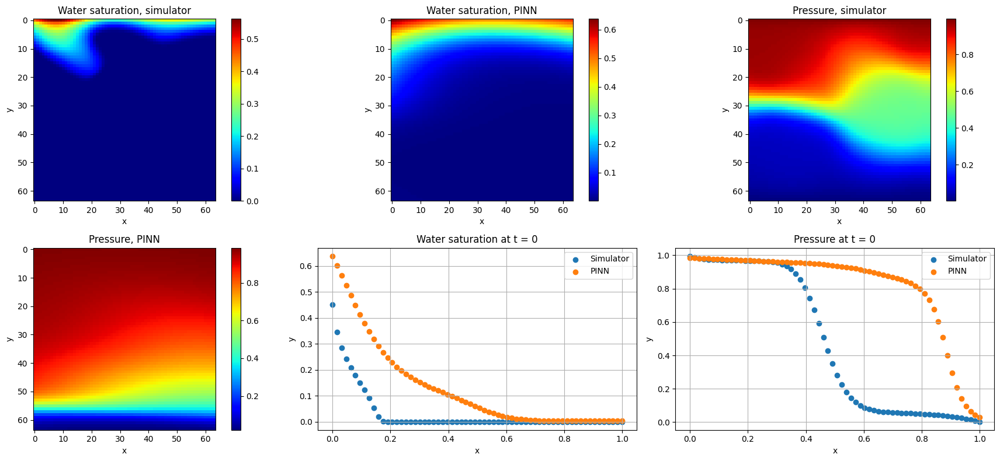

Epoch: 10420 | Loss: 0.00331 | PDE: 0.00727 | BC: 0.00076 | Data: 0.00974
Epoch: 10440 | Loss: 0.00330 | PDE: 0.00725 | BC: 0.00076 | Data: 0.00972
Epoch: 10460 | Loss: 0.00329 | PDE: 0.00724 | BC: 0.00076 | Data: 0.00970
Epoch: 10480 | Loss: 0.00329 | PDE: 0.00722 | BC: 0.00075 | Data: 0.00968
Epoch: 10500 | Loss: 0.00328 | PDE: 0.00721 | BC: 0.00075 | Data: 0.00966
Epoch: 10520 | Loss: 0.00327 | PDE: 0.00719 | BC: 0.00075 | Data: 0.00965
Epoch: 10540 | Loss: 0.00326 | PDE: 0.00718 | BC: 0.00075 | Data: 0.00963
Epoch: 10560 | Loss: 0.00325 | PDE: 0.00717 | BC: 0.00075 | Data: 0.00961
Epoch: 10580 | Loss: 0.00325 | PDE: 0.00715 | BC: 0.00075 | Data: 0.00959
Epoch: 10600 | Loss: 0.00324 | PDE: 0.00714 | BC: 0.00075 | Data: 0.00958


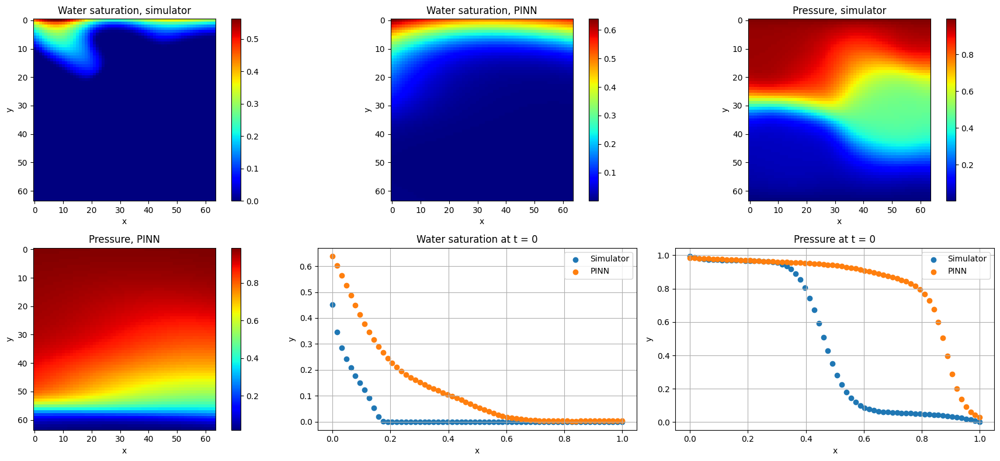

Epoch: 10620 | Loss: 0.00323 | PDE: 0.00712 | BC: 0.00075 | Data: 0.00956
Epoch: 10640 | Loss: 0.00322 | PDE: 0.00711 | BC: 0.00074 | Data: 0.00954
Epoch: 10660 | Loss: 0.00322 | PDE: 0.00710 | BC: 0.00074 | Data: 0.00952
Epoch: 10680 | Loss: 0.00321 | PDE: 0.00708 | BC: 0.00074 | Data: 0.00950
Epoch: 10700 | Loss: 0.00320 | PDE: 0.00707 | BC: 0.00074 | Data: 0.00949
Epoch: 10720 | Loss: 0.00319 | PDE: 0.00706 | BC: 0.00074 | Data: 0.00947
Epoch: 10740 | Loss: 0.00318 | PDE: 0.00704 | BC: 0.00074 | Data: 0.00945
Epoch: 10760 | Loss: 0.00318 | PDE: 0.00703 | BC: 0.00074 | Data: 0.00944
Epoch: 10780 | Loss: 0.00317 | PDE: 0.00701 | BC: 0.00074 | Data: 0.00942
Epoch: 10800 | Loss: 0.00316 | PDE: 0.00700 | BC: 0.00073 | Data: 0.00940


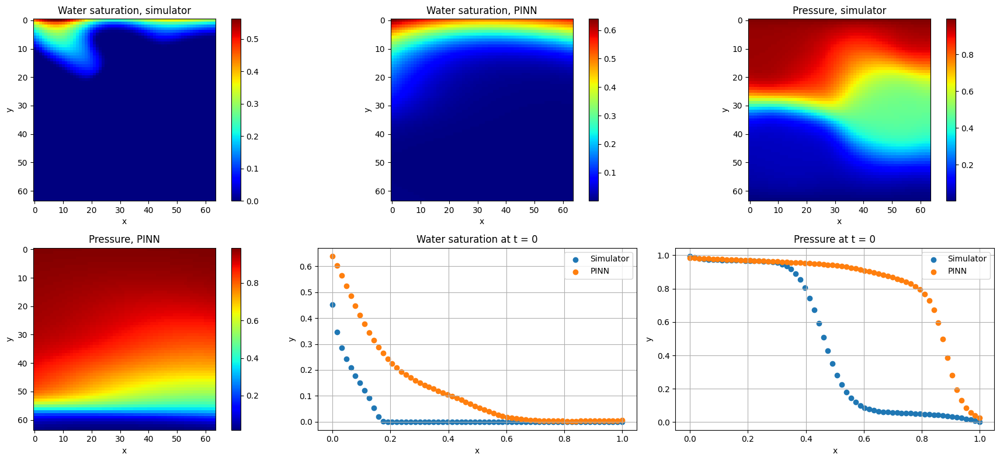

Epoch: 10820 | Loss: 0.00315 | PDE: 0.00699 | BC: 0.00073 | Data: 0.00938
Epoch: 10840 | Loss: 0.00315 | PDE: 0.00697 | BC: 0.00073 | Data: 0.00937
Epoch: 10860 | Loss: 0.00314 | PDE: 0.00696 | BC: 0.00073 | Data: 0.00935
Epoch: 10880 | Loss: 0.00313 | PDE: 0.00695 | BC: 0.00073 | Data: 0.00934
Epoch: 10900 | Loss: 0.00312 | PDE: 0.00694 | BC: 0.00073 | Data: 0.00932
Epoch: 10920 | Loss: 0.00312 | PDE: 0.00692 | BC: 0.00073 | Data: 0.00931
Epoch: 10940 | Loss: 0.00311 | PDE: 0.00691 | BC: 0.00073 | Data: 0.00929
Epoch: 10960 | Loss: 0.00310 | PDE: 0.00690 | BC: 0.00073 | Data: 0.00928
Epoch: 10980 | Loss: 0.00310 | PDE: 0.00688 | BC: 0.00072 | Data: 0.00926
Epoch: 11000 | Loss: 0.00309 | PDE: 0.00687 | BC: 0.00072 | Data: 0.00924


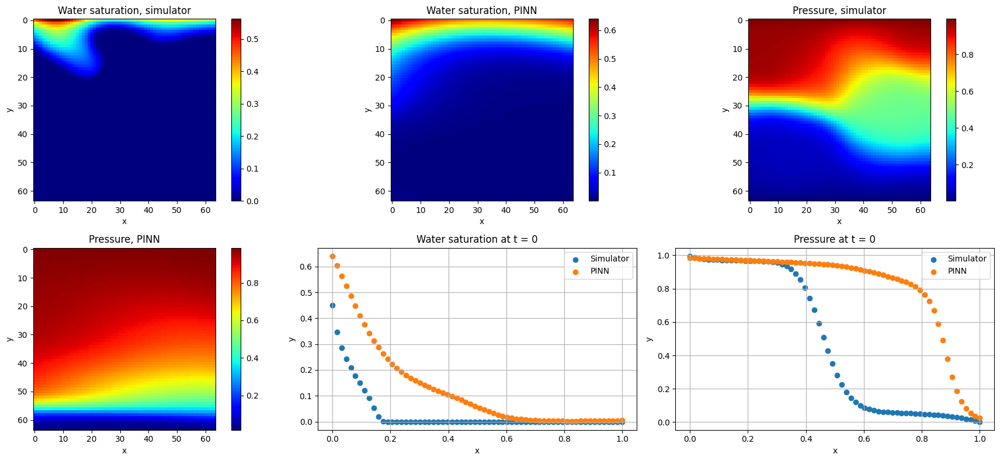

Epoch: 11020 | Loss: 0.00308 | PDE: 0.00686 | BC: 0.00072 | Data: 0.00923
Epoch: 11040 | Loss: 0.00307 | PDE: 0.00685 | BC: 0.00072 | Data: 0.00921
Epoch: 11060 | Loss: 0.00307 | PDE: 0.00683 | BC: 0.00072 | Data: 0.00920
Epoch: 11080 | Loss: 0.00306 | PDE: 0.00682 | BC: 0.00072 | Data: 0.00918
Epoch: 11100 | Loss: 0.00305 | PDE: 0.00681 | BC: 0.00072 | Data: 0.00917
Epoch: 11120 | Loss: 0.00304 | PDE: 0.00679 | BC: 0.00072 | Data: 0.00915
Epoch: 11140 | Loss: 0.00304 | PDE: 0.00678 | BC: 0.00072 | Data: 0.00914
Epoch: 11160 | Loss: 0.00303 | PDE: 0.00677 | BC: 0.00071 | Data: 0.00913
Epoch: 11180 | Loss: 0.00302 | PDE: 0.00676 | BC: 0.00071 | Data: 0.00911
Epoch: 11200 | Loss: 0.00302 | PDE: 0.00675 | BC: 0.00071 | Data: 0.00910


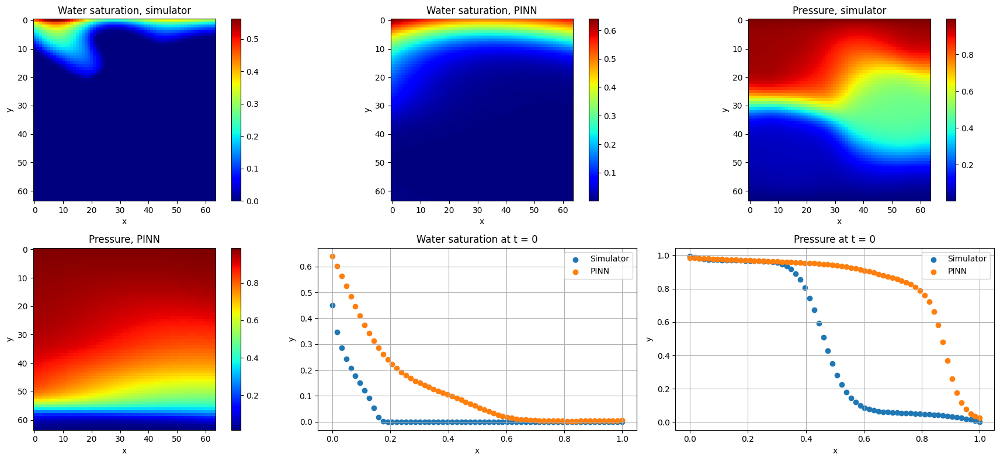

Epoch: 11220 | Loss: 0.00301 | PDE: 0.00674 | BC: 0.00071 | Data: 0.00909
Epoch: 11240 | Loss: 0.00300 | PDE: 0.00672 | BC: 0.00071 | Data: 0.00907
Epoch: 11260 | Loss: 0.00300 | PDE: 0.00671 | BC: 0.00071 | Data: 0.00906
Epoch: 11280 | Loss: 0.00299 | PDE: 0.00670 | BC: 0.00071 | Data: 0.00904
Epoch: 11300 | Loss: 0.00298 | PDE: 0.00669 | BC: 0.00071 | Data: 0.00903
Epoch: 11320 | Loss: 0.00298 | PDE: 0.00668 | BC: 0.00071 | Data: 0.00902
Epoch: 11340 | Loss: 0.00297 | PDE: 0.00666 | BC: 0.00071 | Data: 0.00900
Epoch: 11360 | Loss: 0.00296 | PDE: 0.00665 | BC: 0.00070 | Data: 0.00899
Epoch: 11380 | Loss: 0.00296 | PDE: 0.00664 | BC: 0.00070 | Data: 0.00898
Epoch: 11400 | Loss: 0.00295 | PDE: 0.00663 | BC: 0.00070 | Data: 0.00896


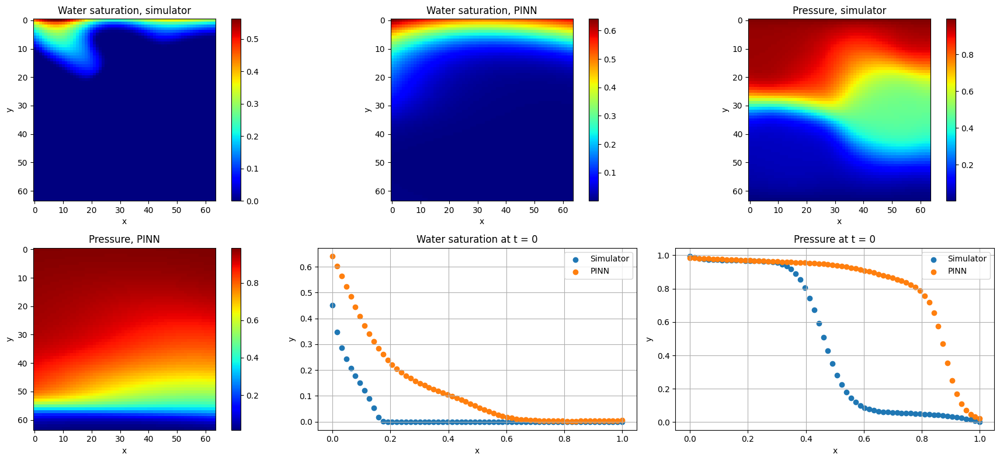

Epoch: 11420 | Loss: 0.00294 | PDE: 0.00662 | BC: 0.00070 | Data: 0.00895
Epoch: 11440 | Loss: 0.00294 | PDE: 0.00661 | BC: 0.00070 | Data: 0.00894
Epoch: 11460 | Loss: 0.00293 | PDE: 0.00660 | BC: 0.00070 | Data: 0.00893
Epoch: 11480 | Loss: 0.00292 | PDE: 0.00658 | BC: 0.00070 | Data: 0.00892
Epoch: 11500 | Loss: 0.00292 | PDE: 0.00657 | BC: 0.00070 | Data: 0.00890
Epoch: 11520 | Loss: 0.00291 | PDE: 0.00656 | BC: 0.00070 | Data: 0.00889
Epoch: 11540 | Loss: 0.00290 | PDE: 0.00655 | BC: 0.00070 | Data: 0.00888
Epoch: 11560 | Loss: 0.00290 | PDE: 0.00654 | BC: 0.00069 | Data: 0.00887
Epoch: 11580 | Loss: 0.00289 | PDE: 0.00653 | BC: 0.00069 | Data: 0.00886
Epoch: 11600 | Loss: 0.00288 | PDE: 0.00652 | BC: 0.00069 | Data: 0.00884


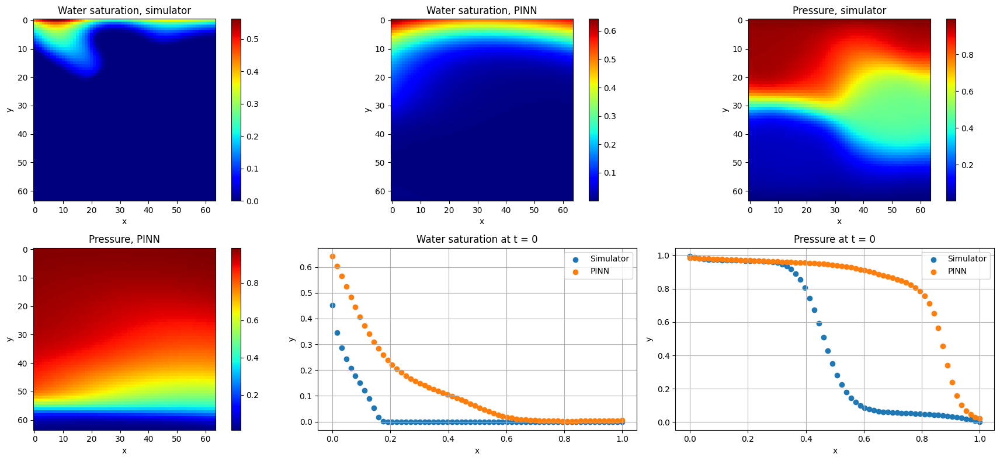

Epoch: 11620 | Loss: 0.00288 | PDE: 0.00651 | BC: 0.00069 | Data: 0.00883
Epoch: 11640 | Loss: 0.00287 | PDE: 0.00650 | BC: 0.00069 | Data: 0.00882
Epoch: 11660 | Loss: 0.00287 | PDE: 0.00649 | BC: 0.00069 | Data: 0.00881
Epoch: 11680 | Loss: 0.00286 | PDE: 0.00647 | BC: 0.00069 | Data: 0.00880
Epoch: 11700 | Loss: 0.00285 | PDE: 0.00646 | BC: 0.00069 | Data: 0.00878
Epoch: 11720 | Loss: 0.00285 | PDE: 0.00645 | BC: 0.00069 | Data: 0.00877
Epoch: 11740 | Loss: 0.00284 | PDE: 0.00644 | BC: 0.00069 | Data: 0.00876
Epoch: 11760 | Loss: 0.00284 | PDE: 0.00643 | BC: 0.00069 | Data: 0.00875
Epoch: 11780 | Loss: 0.00283 | PDE: 0.00642 | BC: 0.00068 | Data: 0.00874
Epoch: 11800 | Loss: 0.00282 | PDE: 0.00641 | BC: 0.00068 | Data: 0.00873


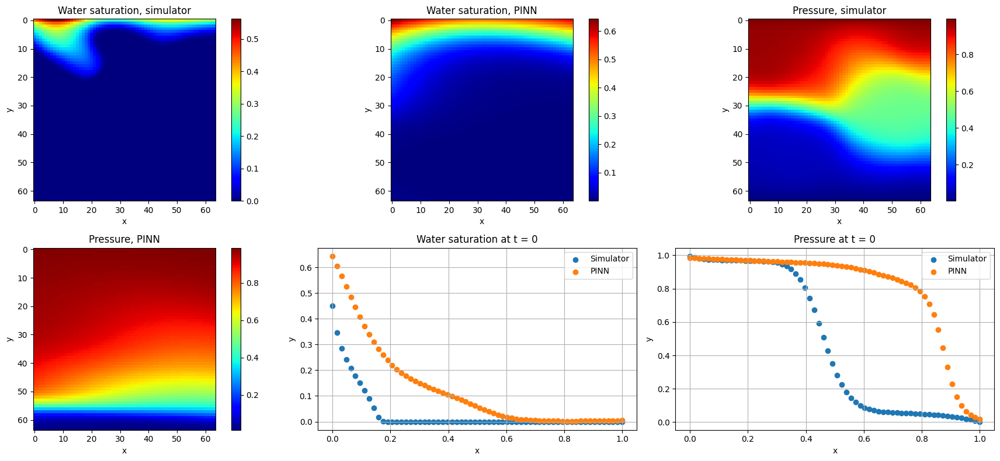

Epoch: 11820 | Loss: 0.00282 | PDE: 0.00640 | BC: 0.00068 | Data: 0.00872
Epoch: 11840 | Loss: 0.00281 | PDE: 0.00639 | BC: 0.00068 | Data: 0.00871
Epoch: 11860 | Loss: 0.00281 | PDE: 0.00638 | BC: 0.00068 | Data: 0.00870
Epoch: 11880 | Loss: 0.00280 | PDE: 0.00637 | BC: 0.00068 | Data: 0.00869
Epoch: 11900 | Loss: 0.00279 | PDE: 0.00636 | BC: 0.00068 | Data: 0.00868
Epoch: 11920 | Loss: 0.00279 | PDE: 0.00635 | BC: 0.00068 | Data: 0.00867
Epoch: 11940 | Loss: 0.00278 | PDE: 0.00634 | BC: 0.00068 | Data: 0.00866
Epoch: 11960 | Loss: 0.00278 | PDE: 0.00633 | BC: 0.00068 | Data: 0.00865
Epoch: 11980 | Loss: 0.00277 | PDE: 0.00632 | BC: 0.00068 | Data: 0.00863
Epoch: 12000 | Loss: 0.00276 | PDE: 0.00631 | BC: 0.00068 | Data: 0.00862


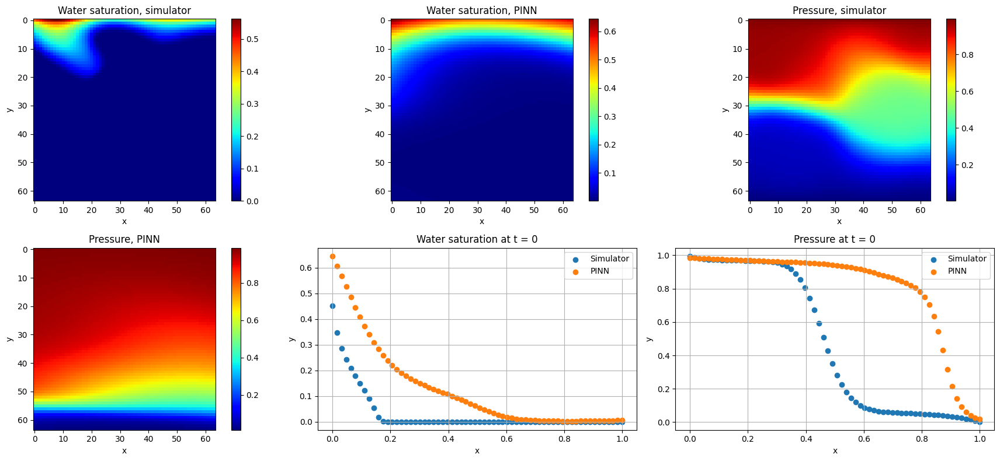

Epoch: 12020 | Loss: 0.00276 | PDE: 0.00630 | BC: 0.00067 | Data: 0.00861
Epoch: 12040 | Loss: 0.00275 | PDE: 0.00630 | BC: 0.00067 | Data: 0.00861
Epoch: 12060 | Loss: 0.00275 | PDE: 0.00629 | BC: 0.00067 | Data: 0.00860
Epoch: 12080 | Loss: 0.00274 | PDE: 0.00628 | BC: 0.00067 | Data: 0.00859
Epoch: 12100 | Loss: 0.00274 | PDE: 0.00627 | BC: 0.00067 | Data: 0.00858
Epoch: 12120 | Loss: 0.00273 | PDE: 0.00626 | BC: 0.00067 | Data: 0.00857
Epoch: 12140 | Loss: 0.00273 | PDE: 0.00625 | BC: 0.00067 | Data: 0.00856
Epoch: 12160 | Loss: 0.00272 | PDE: 0.00624 | BC: 0.00067 | Data: 0.00855
Epoch: 12180 | Loss: 0.00272 | PDE: 0.00623 | BC: 0.00067 | Data: 0.00854
Epoch: 12200 | Loss: 0.00271 | PDE: 0.00622 | BC: 0.00067 | Data: 0.00853


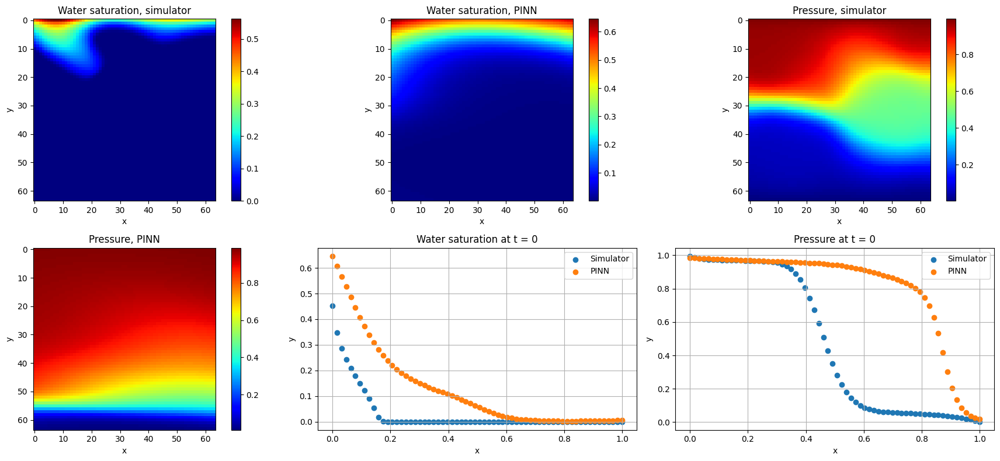

Epoch: 12220 | Loss: 0.00270 | PDE: 0.00621 | BC: 0.00067 | Data: 0.00852
Epoch: 12240 | Loss: 0.00270 | PDE: 0.00620 | BC: 0.00067 | Data: 0.00851
Epoch: 12260 | Loss: 0.00269 | PDE: 0.00619 | BC: 0.00066 | Data: 0.00850
Epoch: 12280 | Loss: 0.00269 | PDE: 0.00619 | BC: 0.00066 | Data: 0.00849
Epoch: 12300 | Loss: 0.00268 | PDE: 0.00618 | BC: 0.00066 | Data: 0.00848
Epoch: 12320 | Loss: 0.00268 | PDE: 0.00617 | BC: 0.00066 | Data: 0.00847
Epoch: 12340 | Loss: 0.00267 | PDE: 0.00616 | BC: 0.00066 | Data: 0.00847
Epoch: 12360 | Loss: 0.00267 | PDE: 0.00615 | BC: 0.00066 | Data: 0.00846
Epoch: 12380 | Loss: 0.00266 | PDE: 0.00614 | BC: 0.00066 | Data: 0.00845
Epoch: 12400 | Loss: 0.00266 | PDE: 0.00613 | BC: 0.00066 | Data: 0.00844


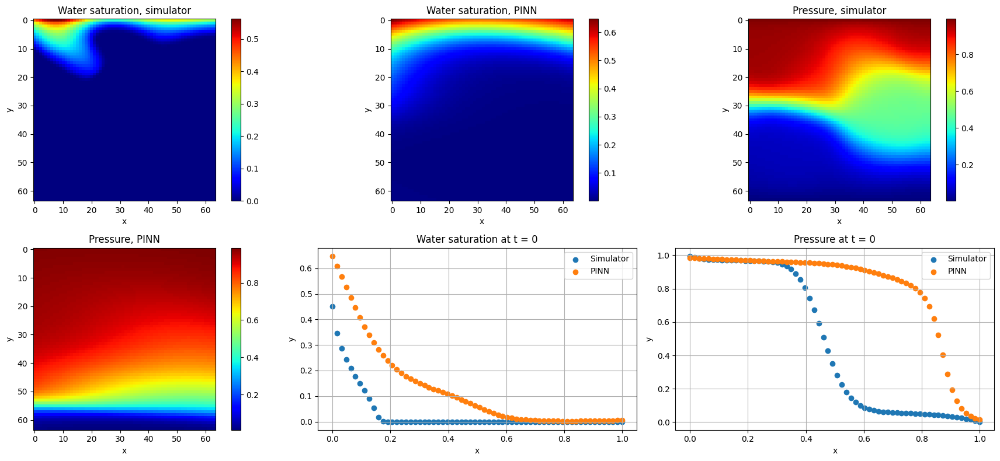

Epoch: 12420 | Loss: 0.00265 | PDE: 0.00613 | BC: 0.00066 | Data: 0.00843
Epoch: 12440 | Loss: 0.00265 | PDE: 0.00612 | BC: 0.00066 | Data: 0.00842
Epoch: 12460 | Loss: 0.00264 | PDE: 0.00611 | BC: 0.00066 | Data: 0.00842
Epoch: 12480 | Loss: 0.00264 | PDE: 0.00610 | BC: 0.00066 | Data: 0.00841
Epoch: 12500 | Loss: 0.00263 | PDE: 0.00609 | BC: 0.00066 | Data: 0.00840
Epoch: 12520 | Loss: 0.00263 | PDE: 0.00609 | BC: 0.00065 | Data: 0.00839
Epoch: 12540 | Loss: 0.00262 | PDE: 0.00608 | BC: 0.00065 | Data: 0.00838
Epoch: 12560 | Loss: 0.00262 | PDE: 0.00607 | BC: 0.00065 | Data: 0.00838
Epoch: 12580 | Loss: 0.00261 | PDE: 0.00606 | BC: 0.00065 | Data: 0.00837
Epoch: 12600 | Loss: 0.00261 | PDE: 0.00605 | BC: 0.00065 | Data: 0.00836


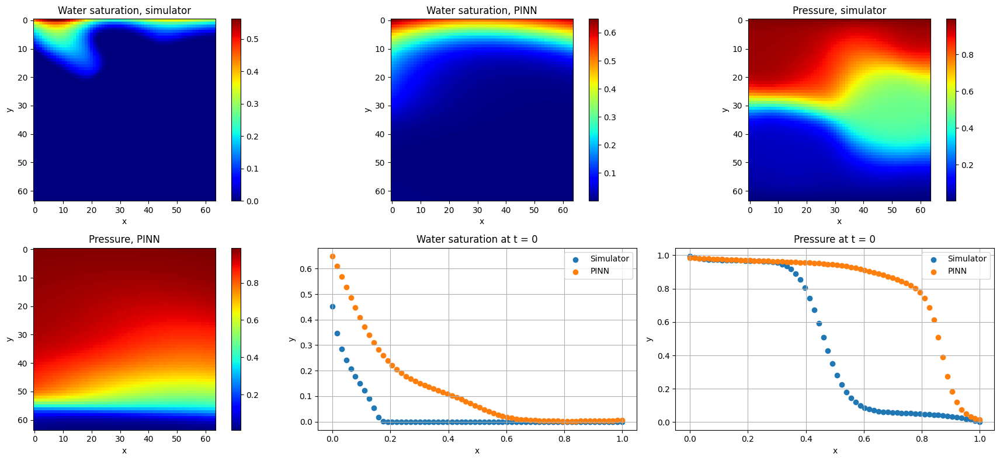

Epoch: 12620 | Loss: 0.00260 | PDE: 0.00604 | BC: 0.00065 | Data: 0.00835
Epoch: 12640 | Loss: 0.00260 | PDE: 0.00604 | BC: 0.00065 | Data: 0.00834
Epoch: 12660 | Loss: 0.00259 | PDE: 0.00603 | BC: 0.00065 | Data: 0.00834
Epoch: 12680 | Loss: 0.00259 | PDE: 0.00602 | BC: 0.00065 | Data: 0.00833
Epoch: 12700 | Loss: 0.00259 | PDE: 0.00601 | BC: 0.00065 | Data: 0.00832
Epoch: 12720 | Loss: 0.00258 | PDE: 0.00601 | BC: 0.00065 | Data: 0.00831
Epoch: 12740 | Loss: 0.00258 | PDE: 0.00600 | BC: 0.00065 | Data: 0.00831
Epoch: 12760 | Loss: 0.00257 | PDE: 0.00599 | BC: 0.00065 | Data: 0.00830
Epoch: 12780 | Loss: 0.00257 | PDE: 0.00598 | BC: 0.00065 | Data: 0.00829
Epoch: 12800 | Loss: 0.00256 | PDE: 0.00598 | BC: 0.00064 | Data: 0.00828


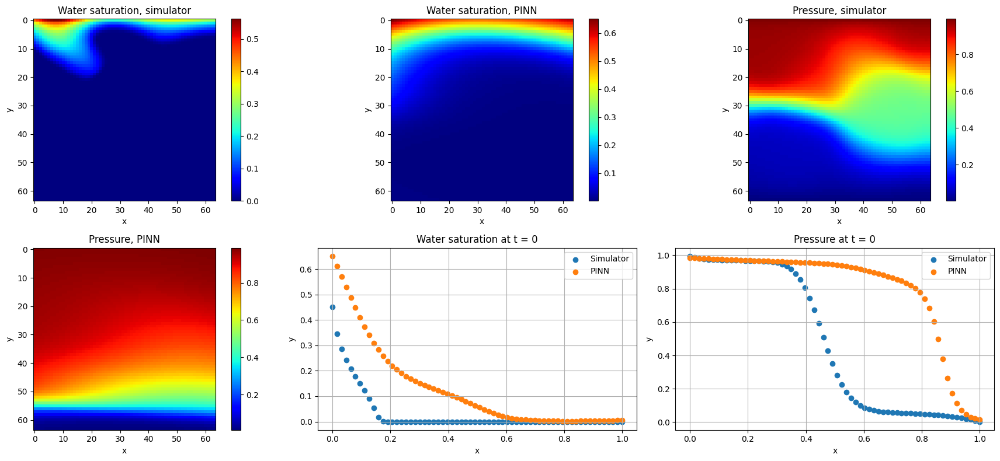

Epoch: 12820 | Loss: 0.00256 | PDE: 0.00597 | BC: 0.00064 | Data: 0.00828
Epoch: 12840 | Loss: 0.00255 | PDE: 0.00596 | BC: 0.00064 | Data: 0.00827
Epoch: 12860 | Loss: 0.00255 | PDE: 0.00595 | BC: 0.00064 | Data: 0.00826
Epoch: 12880 | Loss: 0.00254 | PDE: 0.00595 | BC: 0.00064 | Data: 0.00826
Epoch: 12900 | Loss: 0.00254 | PDE: 0.00594 | BC: 0.00064 | Data: 0.00825
Epoch: 12920 | Loss: 0.00254 | PDE: 0.00593 | BC: 0.00064 | Data: 0.00824
Epoch: 12940 | Loss: 0.00253 | PDE: 0.00593 | BC: 0.00064 | Data: 0.00824
Epoch: 12960 | Loss: 0.00253 | PDE: 0.00592 | BC: 0.00064 | Data: 0.00823
Epoch: 12980 | Loss: 0.00252 | PDE: 0.00591 | BC: 0.00064 | Data: 0.00822
Epoch: 13000 | Loss: 0.00252 | PDE: 0.00591 | BC: 0.00064 | Data: 0.00822


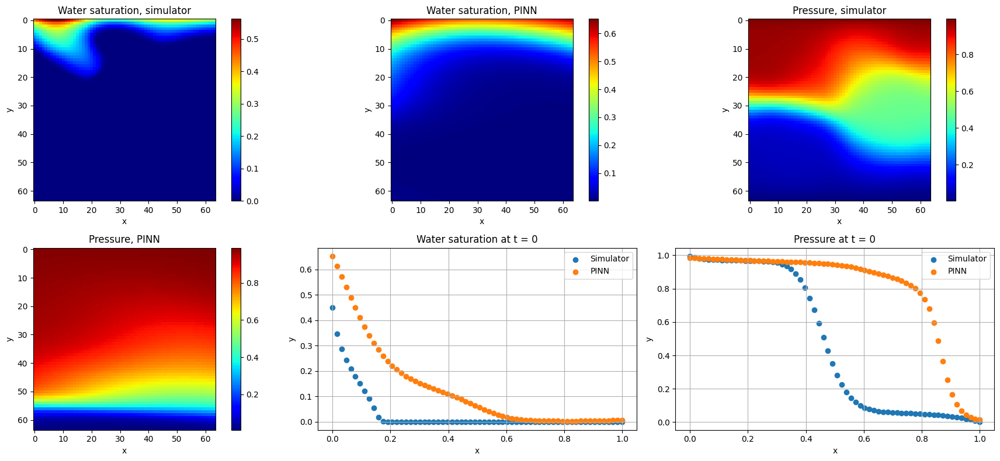

Epoch: 13020 | Loss: 0.00251 | PDE: 0.00590 | BC: 0.00064 | Data: 0.00821
Epoch: 13040 | Loss: 0.00251 | PDE: 0.00589 | BC: 0.00064 | Data: 0.00820
Epoch: 13060 | Loss: 0.00251 | PDE: 0.00588 | BC: 0.00064 | Data: 0.00820
Epoch: 13080 | Loss: 0.00250 | PDE: 0.00588 | BC: 0.00064 | Data: 0.00819
Epoch: 13100 | Loss: 0.00250 | PDE: 0.00587 | BC: 0.00064 | Data: 0.00818
Epoch: 13120 | Loss: 0.00249 | PDE: 0.00586 | BC: 0.00063 | Data: 0.00818
Epoch: 13140 | Loss: 0.00249 | PDE: 0.00586 | BC: 0.00063 | Data: 0.00817
Epoch: 13160 | Loss: 0.00249 | PDE: 0.00585 | BC: 0.00063 | Data: 0.00816
Epoch: 13180 | Loss: 0.00248 | PDE: 0.00584 | BC: 0.00063 | Data: 0.00816
Epoch: 13200 | Loss: 0.00248 | PDE: 0.00584 | BC: 0.00063 | Data: 0.00815


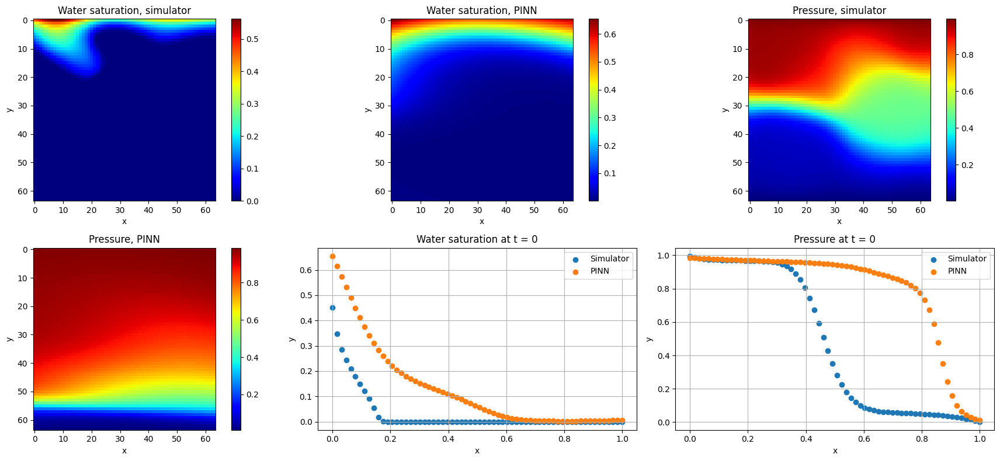

Epoch: 13220 | Loss: 0.00247 | PDE: 0.00583 | BC: 0.00063 | Data: 0.00814
Epoch: 13240 | Loss: 0.00247 | PDE: 0.00582 | BC: 0.00063 | Data: 0.00814
Epoch: 13260 | Loss: 0.00247 | PDE: 0.00582 | BC: 0.00063 | Data: 0.00813
Epoch: 13280 | Loss: 0.00246 | PDE: 0.00581 | BC: 0.00063 | Data: 0.00813
Epoch: 13300 | Loss: 0.00246 | PDE: 0.00581 | BC: 0.00063 | Data: 0.00812
Epoch: 13320 | Loss: 0.00245 | PDE: 0.00580 | BC: 0.00063 | Data: 0.00812
Epoch: 13340 | Loss: 0.00245 | PDE: 0.00579 | BC: 0.00063 | Data: 0.00811
Epoch: 13360 | Loss: 0.00245 | PDE: 0.00579 | BC: 0.00063 | Data: 0.00810
Epoch: 13380 | Loss: 0.00244 | PDE: 0.00578 | BC: 0.00063 | Data: 0.00810
Epoch: 13400 | Loss: 0.00244 | PDE: 0.00578 | BC: 0.00063 | Data: 0.00809


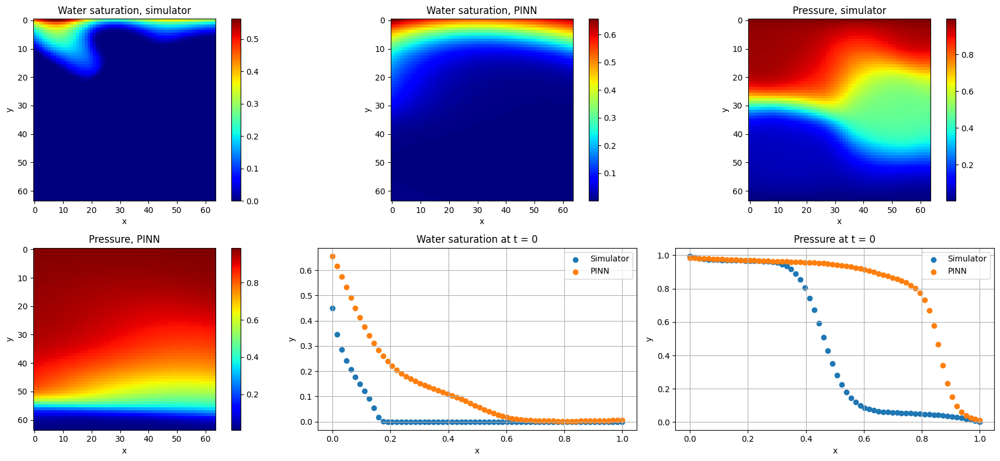

Epoch: 13420 | Loss: 0.00244 | PDE: 0.00577 | BC: 0.00063 | Data: 0.00809
Epoch: 13440 | Loss: 0.00243 | PDE: 0.00576 | BC: 0.00063 | Data: 0.00808
Epoch: 13460 | Loss: 0.00243 | PDE: 0.00576 | BC: 0.00062 | Data: 0.00808
Epoch: 13480 | Loss: 0.00242 | PDE: 0.00575 | BC: 0.00062 | Data: 0.00807
Epoch: 13500 | Loss: 0.00242 | PDE: 0.00575 | BC: 0.00062 | Data: 0.00806
Epoch: 13520 | Loss: 0.00242 | PDE: 0.00574 | BC: 0.00062 | Data: 0.00806
Epoch: 13540 | Loss: 0.00241 | PDE: 0.00573 | BC: 0.00062 | Data: 0.00805
Epoch: 13560 | Loss: 0.00241 | PDE: 0.00573 | BC: 0.00062 | Data: 0.00805
Epoch: 13580 | Loss: 0.00241 | PDE: 0.00572 | BC: 0.00062 | Data: 0.00804
Epoch: 13600 | Loss: 0.00240 | PDE: 0.00572 | BC: 0.00062 | Data: 0.00804


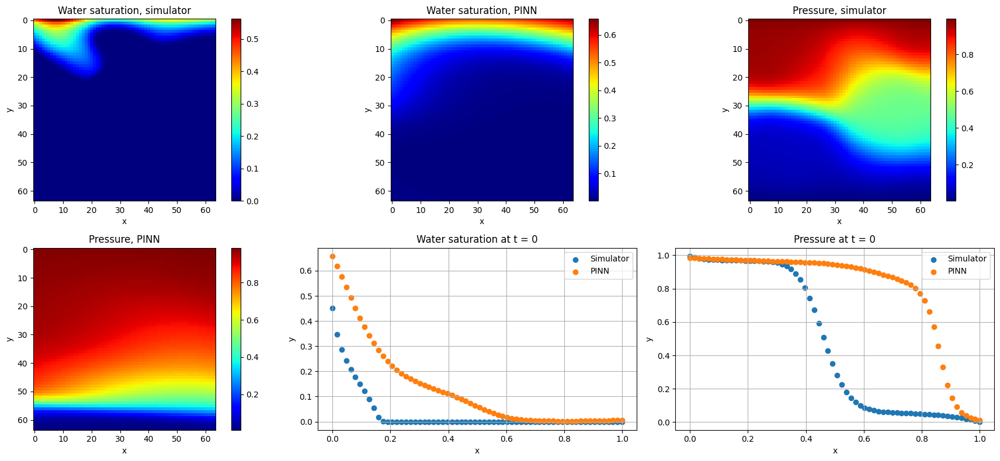

Epoch: 13620 | Loss: 0.00240 | PDE: 0.00571 | BC: 0.00062 | Data: 0.00803
Epoch: 13640 | Loss: 0.00240 | PDE: 0.00571 | BC: 0.00062 | Data: 0.00803
Epoch: 13660 | Loss: 0.00239 | PDE: 0.00570 | BC: 0.00062 | Data: 0.00802
Epoch: 13680 | Loss: 0.00239 | PDE: 0.00570 | BC: 0.00062 | Data: 0.00802
Epoch: 13700 | Loss: 0.00239 | PDE: 0.00569 | BC: 0.00062 | Data: 0.00801
Epoch: 13720 | Loss: 0.00238 | PDE: 0.00568 | BC: 0.00062 | Data: 0.00801
Epoch: 13740 | Loss: 0.00238 | PDE: 0.00568 | BC: 0.00062 | Data: 0.00800
Epoch: 13760 | Loss: 0.00238 | PDE: 0.00567 | BC: 0.00062 | Data: 0.00800
Epoch: 13780 | Loss: 0.00237 | PDE: 0.00567 | BC: 0.00062 | Data: 0.00799
Epoch: 13800 | Loss: 0.00237 | PDE: 0.00566 | BC: 0.00062 | Data: 0.00799


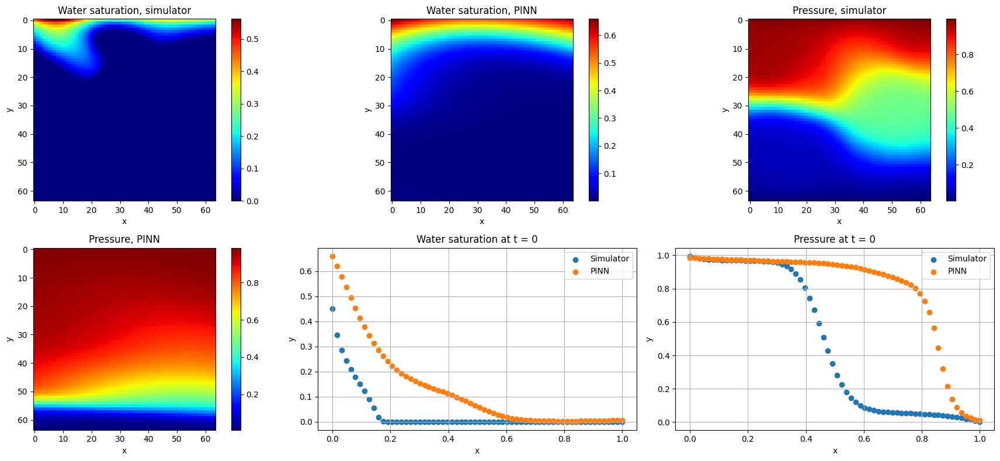

Epoch: 13820 | Loss: 0.00237 | PDE: 0.00566 | BC: 0.00062 | Data: 0.00798
Epoch: 13840 | Loss: 0.00236 | PDE: 0.00565 | BC: 0.00061 | Data: 0.00798
Epoch: 13860 | Loss: 0.00236 | PDE: 0.00565 | BC: 0.00061 | Data: 0.00797
Epoch: 13880 | Loss: 0.00236 | PDE: 0.00564 | BC: 0.00061 | Data: 0.00797
Epoch: 13900 | Loss: 0.00235 | PDE: 0.00564 | BC: 0.00061 | Data: 0.00796
Epoch: 13920 | Loss: 0.00235 | PDE: 0.00563 | BC: 0.00061 | Data: 0.00796
Epoch: 13940 | Loss: 0.00235 | PDE: 0.00563 | BC: 0.00061 | Data: 0.00796
Epoch: 13960 | Loss: 0.00234 | PDE: 0.00562 | BC: 0.00061 | Data: 0.00795
Epoch: 13980 | Loss: 0.00234 | PDE: 0.00562 | BC: 0.00061 | Data: 0.00795
Epoch: 14000 | Loss: 0.00234 | PDE: 0.00561 | BC: 0.00061 | Data: 0.00794


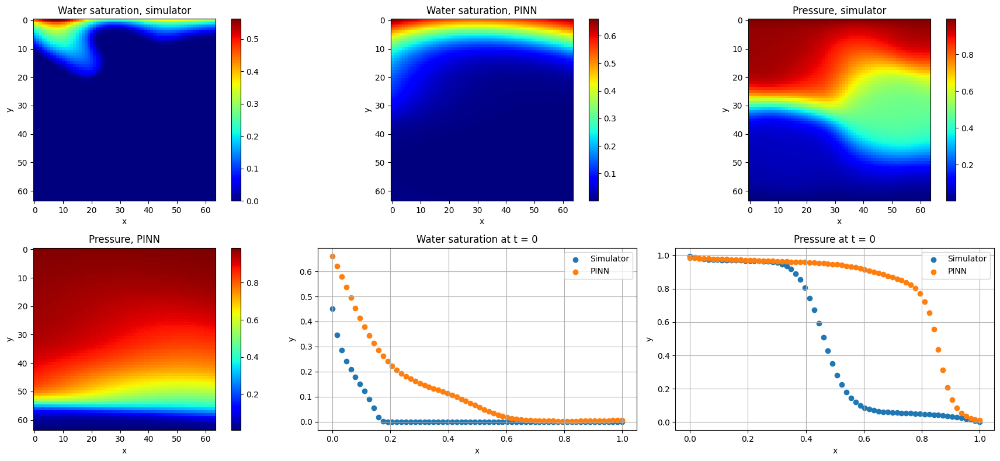

Epoch: 14020 | Loss: 0.00234 | PDE: 0.00561 | BC: 0.00061 | Data: 0.00794
Epoch: 14040 | Loss: 0.00233 | PDE: 0.00560 | BC: 0.00061 | Data: 0.00793
Epoch: 14060 | Loss: 0.00233 | PDE: 0.00560 | BC: 0.00061 | Data: 0.00793
Epoch: 14080 | Loss: 0.00233 | PDE: 0.00559 | BC: 0.00061 | Data: 0.00792
Epoch: 14100 | Loss: 0.00232 | PDE: 0.00559 | BC: 0.00061 | Data: 0.00792
Epoch: 14120 | Loss: 0.00232 | PDE: 0.00558 | BC: 0.00061 | Data: 0.00792
Epoch: 14140 | Loss: 0.00232 | PDE: 0.00558 | BC: 0.00061 | Data: 0.00791
Epoch: 14160 | Loss: 0.00231 | PDE: 0.00557 | BC: 0.00061 | Data: 0.00791
Epoch: 14180 | Loss: 0.00231 | PDE: 0.00557 | BC: 0.00061 | Data: 0.00790
Epoch: 14200 | Loss: 0.00231 | PDE: 0.00556 | BC: 0.00061 | Data: 0.00790


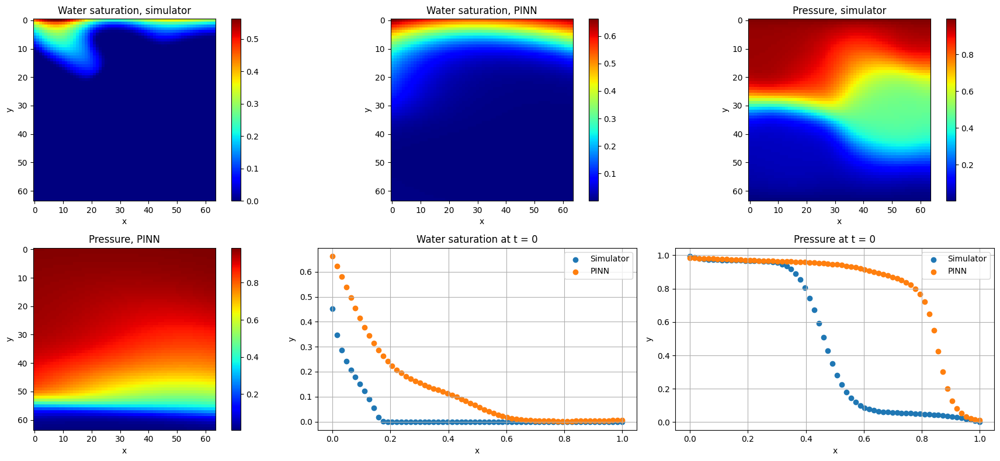

Epoch: 14220 | Loss: 0.00231 | PDE: 0.00556 | BC: 0.00061 | Data: 0.00790
Epoch: 14240 | Loss: 0.00230 | PDE: 0.00556 | BC: 0.00061 | Data: 0.00789
Epoch: 14260 | Loss: 0.00230 | PDE: 0.00555 | BC: 0.00061 | Data: 0.00789
Epoch: 14280 | Loss: 0.00230 | PDE: 0.00555 | BC: 0.00061 | Data: 0.00788
Epoch: 14300 | Loss: 0.00229 | PDE: 0.00554 | BC: 0.00060 | Data: 0.00788
Epoch: 14320 | Loss: 0.00229 | PDE: 0.00554 | BC: 0.00060 | Data: 0.00788
Epoch: 14340 | Loss: 0.00229 | PDE: 0.00553 | BC: 0.00060 | Data: 0.00787
Epoch: 14360 | Loss: 0.00229 | PDE: 0.00553 | BC: 0.00060 | Data: 0.00787
Epoch: 14380 | Loss: 0.00228 | PDE: 0.00552 | BC: 0.00060 | Data: 0.00786
Epoch: 14400 | Loss: 0.00228 | PDE: 0.00552 | BC: 0.00060 | Data: 0.00786


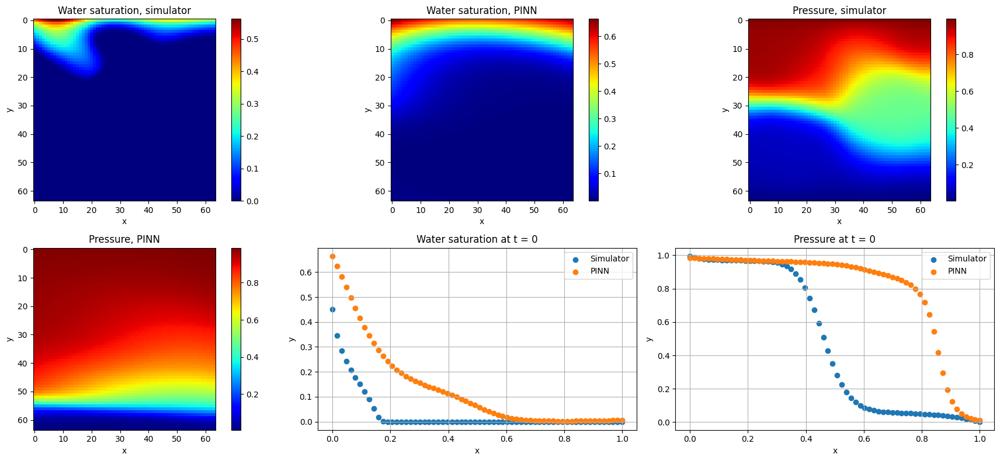

Epoch: 14420 | Loss: 0.00228 | PDE: 0.00552 | BC: 0.00060 | Data: 0.00786
Epoch: 14440 | Loss: 0.00228 | PDE: 0.00551 | BC: 0.00060 | Data: 0.00785
Epoch: 14460 | Loss: 0.00227 | PDE: 0.00551 | BC: 0.00060 | Data: 0.00785
Epoch: 14480 | Loss: 0.00227 | PDE: 0.00550 | BC: 0.00060 | Data: 0.00785
Epoch: 14500 | Loss: 0.00227 | PDE: 0.00550 | BC: 0.00060 | Data: 0.00784
Epoch: 14520 | Loss: 0.00227 | PDE: 0.00550 | BC: 0.00060 | Data: 0.00784
Epoch: 14540 | Loss: 0.00226 | PDE: 0.00549 | BC: 0.00060 | Data: 0.00783
Epoch: 14560 | Loss: 0.00226 | PDE: 0.00549 | BC: 0.00060 | Data: 0.00783
Epoch: 14580 | Loss: 0.00226 | PDE: 0.00548 | BC: 0.00060 | Data: 0.00783
Epoch: 14600 | Loss: 0.00226 | PDE: 0.00548 | BC: 0.00060 | Data: 0.00782


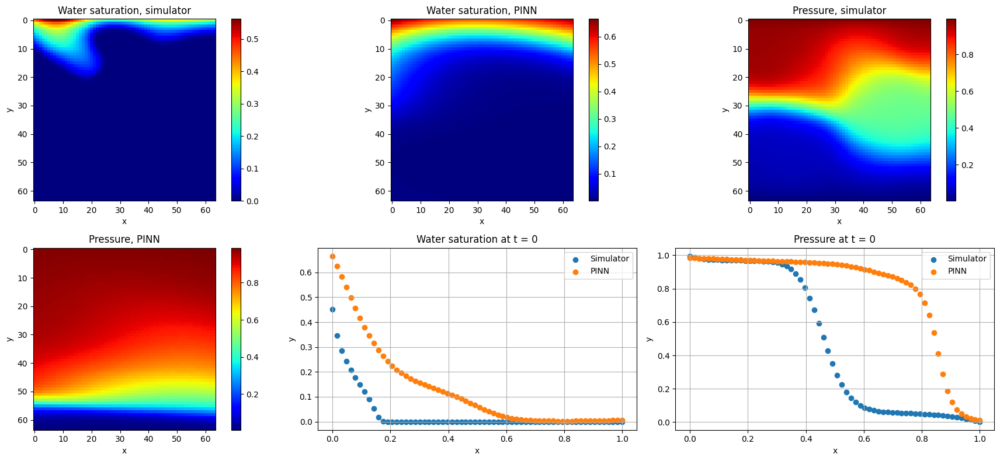

Epoch: 14620 | Loss: 0.00225 | PDE: 0.00548 | BC: 0.00060 | Data: 0.00782
Epoch: 14640 | Loss: 0.00225 | PDE: 0.00547 | BC: 0.00060 | Data: 0.00782
Epoch: 14660 | Loss: 0.00225 | PDE: 0.00547 | BC: 0.00060 | Data: 0.00781
Epoch: 14680 | Loss: 0.00225 | PDE: 0.00546 | BC: 0.00060 | Data: 0.00781
Epoch: 14700 | Loss: 0.00224 | PDE: 0.00546 | BC: 0.00060 | Data: 0.00781
Epoch: 14720 | Loss: 0.00224 | PDE: 0.00546 | BC: 0.00060 | Data: 0.00780
Epoch: 14740 | Loss: 0.00224 | PDE: 0.00545 | BC: 0.00060 | Data: 0.00780
Epoch: 14760 | Loss: 0.00224 | PDE: 0.00545 | BC: 0.00060 | Data: 0.00780
Epoch: 14780 | Loss: 0.00223 | PDE: 0.00544 | BC: 0.00060 | Data: 0.00779
Epoch: 14800 | Loss: 0.00223 | PDE: 0.00544 | BC: 0.00060 | Data: 0.00779


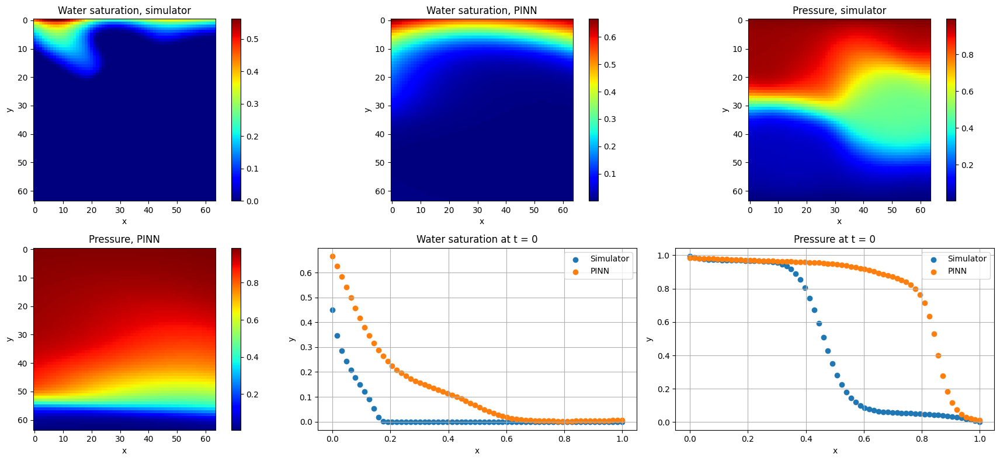

Epoch: 14820 | Loss: 0.00223 | PDE: 0.00544 | BC: 0.00060 | Data: 0.00779
Epoch: 14840 | Loss: 0.00223 | PDE: 0.00543 | BC: 0.00059 | Data: 0.00778
Epoch: 14860 | Loss: 0.00223 | PDE: 0.00543 | BC: 0.00059 | Data: 0.00778
Epoch: 14880 | Loss: 0.00222 | PDE: 0.00543 | BC: 0.00059 | Data: 0.00778
Epoch: 14900 | Loss: 0.00222 | PDE: 0.00542 | BC: 0.00059 | Data: 0.00777
Epoch: 14920 | Loss: 0.00222 | PDE: 0.00542 | BC: 0.00059 | Data: 0.00777
Epoch: 14940 | Loss: 0.00222 | PDE: 0.00542 | BC: 0.00059 | Data: 0.00777
Epoch: 14960 | Loss: 0.00221 | PDE: 0.00541 | BC: 0.00059 | Data: 0.00777
Epoch: 14980 | Loss: 0.00221 | PDE: 0.00541 | BC: 0.00059 | Data: 0.00776
Epoch: 15000 | Loss: 0.00221 | PDE: 0.00540 | BC: 0.00059 | Data: 0.00776


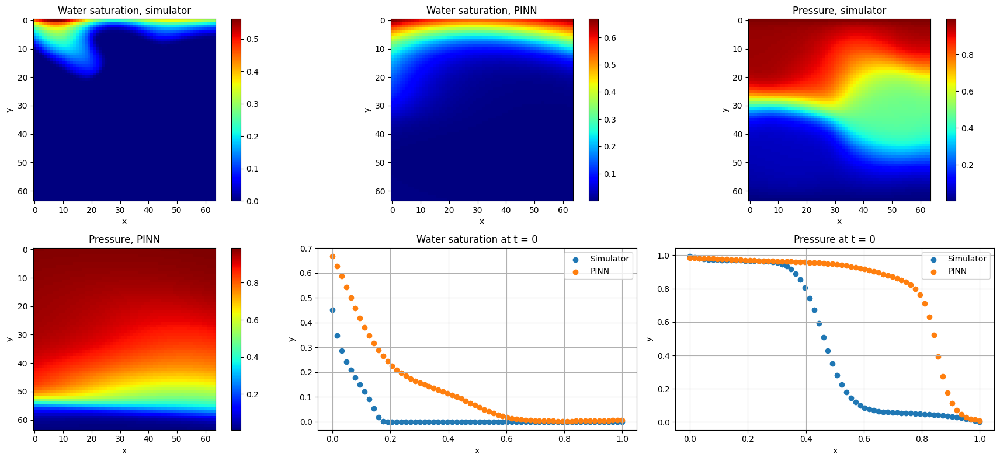

Epoch: 15020 | Loss: 0.00221 | PDE: 0.00540 | BC: 0.00059 | Data: 0.00776
Epoch: 15040 | Loss: 0.00221 | PDE: 0.00540 | BC: 0.00059 | Data: 0.00775
Epoch: 15060 | Loss: 0.00220 | PDE: 0.00539 | BC: 0.00059 | Data: 0.00775
Epoch: 15080 | Loss: 0.00220 | PDE: 0.00539 | BC: 0.00059 | Data: 0.00775
Epoch: 15100 | Loss: 0.00220 | PDE: 0.00539 | BC: 0.00059 | Data: 0.00774
Epoch: 15120 | Loss: 0.00220 | PDE: 0.00539 | BC: 0.00059 | Data: 0.00774
Epoch: 15140 | Loss: 0.00220 | PDE: 0.00538 | BC: 0.00059 | Data: 0.00774
Epoch: 15160 | Loss: 0.00219 | PDE: 0.00538 | BC: 0.00059 | Data: 0.00774
Epoch: 15180 | Loss: 0.00219 | PDE: 0.00538 | BC: 0.00059 | Data: 0.00773
Epoch: 15200 | Loss: 0.00219 | PDE: 0.00537 | BC: 0.00059 | Data: 0.00773


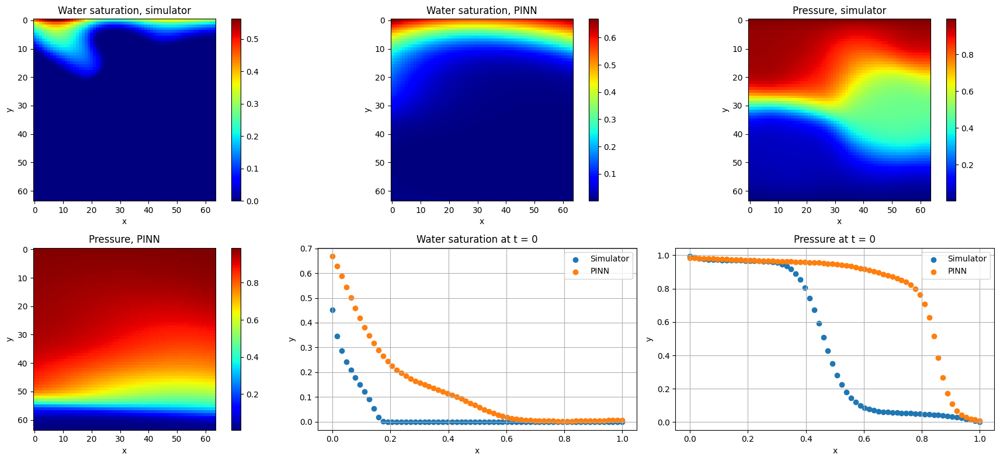

Epoch: 15220 | Loss: 0.00219 | PDE: 0.00537 | BC: 0.00059 | Data: 0.00773
Epoch: 15240 | Loss: 0.00218 | PDE: 0.00537 | BC: 0.00059 | Data: 0.00773
Epoch: 15260 | Loss: 0.00218 | PDE: 0.00536 | BC: 0.00059 | Data: 0.00772
Epoch: 15280 | Loss: 0.00218 | PDE: 0.00536 | BC: 0.00059 | Data: 0.00772
Epoch: 15300 | Loss: 0.00218 | PDE: 0.00536 | BC: 0.00059 | Data: 0.00772
Epoch: 15320 | Loss: 0.00218 | PDE: 0.00535 | BC: 0.00059 | Data: 0.00771
Epoch: 15340 | Loss: 0.00218 | PDE: 0.00535 | BC: 0.00059 | Data: 0.00771
Epoch: 15360 | Loss: 0.00217 | PDE: 0.00535 | BC: 0.00059 | Data: 0.00771
Epoch: 15380 | Loss: 0.00217 | PDE: 0.00534 | BC: 0.00059 | Data: 0.00771
Epoch: 15400 | Loss: 0.00217 | PDE: 0.00534 | BC: 0.00059 | Data: 0.00770


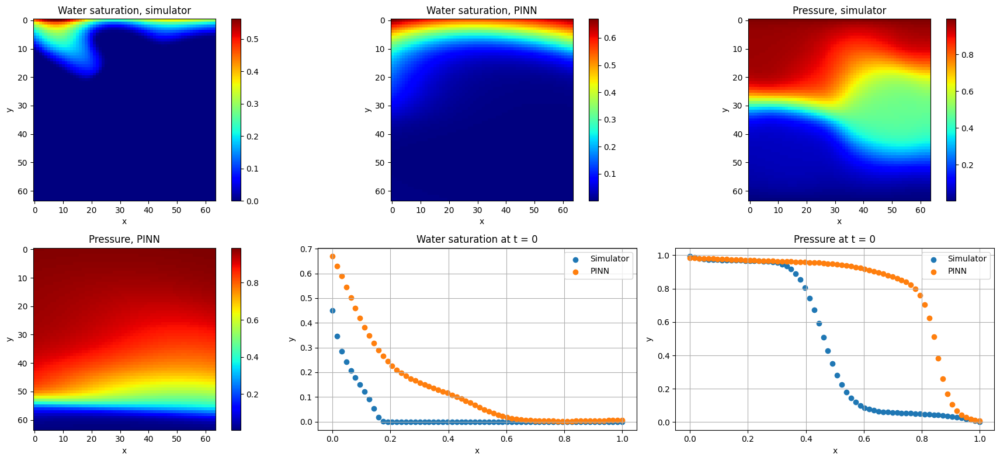

Epoch: 15420 | Loss: 0.00217 | PDE: 0.00534 | BC: 0.00059 | Data: 0.00770
Epoch: 15440 | Loss: 0.00217 | PDE: 0.00534 | BC: 0.00059 | Data: 0.00770
Epoch: 15460 | Loss: 0.00216 | PDE: 0.00533 | BC: 0.00059 | Data: 0.00770
Epoch: 15480 | Loss: 0.00216 | PDE: 0.00533 | BC: 0.00059 | Data: 0.00769
Epoch: 15500 | Loss: 0.00216 | PDE: 0.00533 | BC: 0.00058 | Data: 0.00769
Epoch: 15520 | Loss: 0.00216 | PDE: 0.00532 | BC: 0.00058 | Data: 0.00769
Epoch: 15540 | Loss: 0.00216 | PDE: 0.00532 | BC: 0.00058 | Data: 0.00769
Epoch: 15560 | Loss: 0.00216 | PDE: 0.00532 | BC: 0.00058 | Data: 0.00768
Epoch: 15580 | Loss: 0.00215 | PDE: 0.00531 | BC: 0.00058 | Data: 0.00768
Epoch: 15600 | Loss: 0.00215 | PDE: 0.00531 | BC: 0.00058 | Data: 0.00768


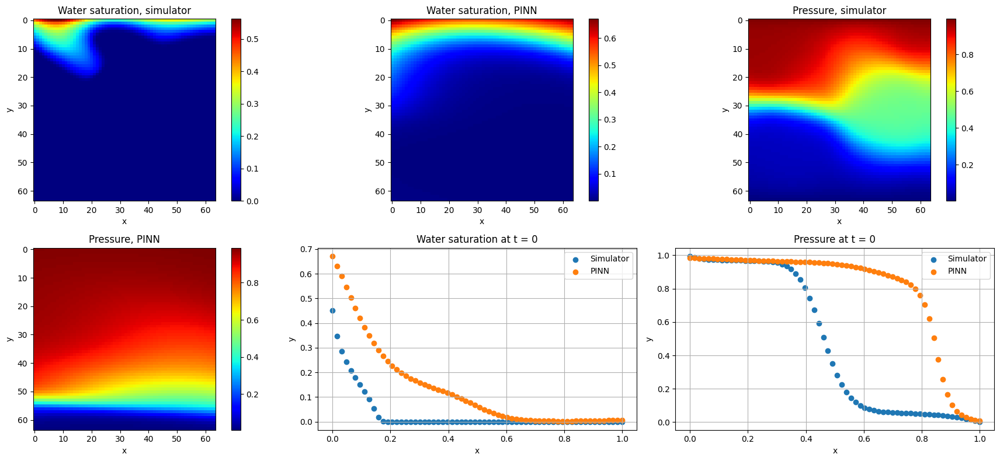

Epoch: 15620 | Loss: 0.00215 | PDE: 0.00531 | BC: 0.00058 | Data: 0.00768
Epoch: 15640 | Loss: 0.00215 | PDE: 0.00531 | BC: 0.00058 | Data: 0.00767
Epoch: 15660 | Loss: 0.00215 | PDE: 0.00530 | BC: 0.00058 | Data: 0.00767
Epoch: 15680 | Loss: 0.00214 | PDE: 0.00530 | BC: 0.00058 | Data: 0.00767
Epoch: 15700 | Loss: 0.00214 | PDE: 0.00530 | BC: 0.00058 | Data: 0.00767
Epoch: 15720 | Loss: 0.00214 | PDE: 0.00530 | BC: 0.00058 | Data: 0.00767
Epoch: 15740 | Loss: 0.00214 | PDE: 0.00529 | BC: 0.00058 | Data: 0.00766
Epoch: 15760 | Loss: 0.00214 | PDE: 0.00529 | BC: 0.00058 | Data: 0.00766
Epoch: 15780 | Loss: 0.00214 | PDE: 0.00529 | BC: 0.00058 | Data: 0.00766
Epoch: 15800 | Loss: 0.00213 | PDE: 0.00529 | BC: 0.00058 | Data: 0.00766


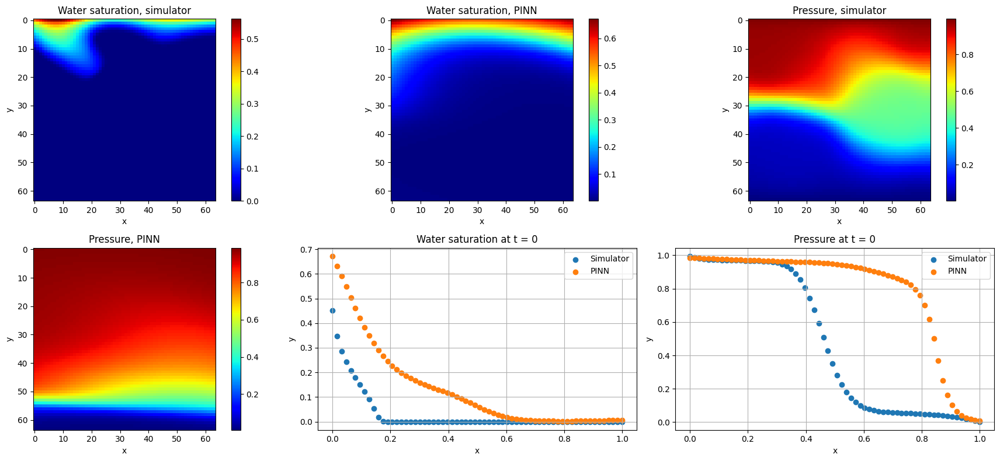

Epoch: 15820 | Loss: 0.00213 | PDE: 0.00528 | BC: 0.00058 | Data: 0.00765
Epoch: 15840 | Loss: 0.00213 | PDE: 0.00528 | BC: 0.00058 | Data: 0.00765
Epoch: 15860 | Loss: 0.00213 | PDE: 0.00528 | BC: 0.00058 | Data: 0.00765
Epoch: 15880 | Loss: 0.00213 | PDE: 0.00528 | BC: 0.00058 | Data: 0.00765
Epoch: 15900 | Loss: 0.00213 | PDE: 0.00527 | BC: 0.00058 | Data: 0.00765
Epoch: 15920 | Loss: 0.00213 | PDE: 0.00527 | BC: 0.00058 | Data: 0.00764
Epoch: 15940 | Loss: 0.00212 | PDE: 0.00527 | BC: 0.00058 | Data: 0.00764
Epoch: 15960 | Loss: 0.00212 | PDE: 0.00527 | BC: 0.00058 | Data: 0.00764
Epoch: 15980 | Loss: 0.00212 | PDE: 0.00526 | BC: 0.00058 | Data: 0.00764
Epoch: 16000 | Loss: 0.00212 | PDE: 0.00526 | BC: 0.00058 | Data: 0.00764


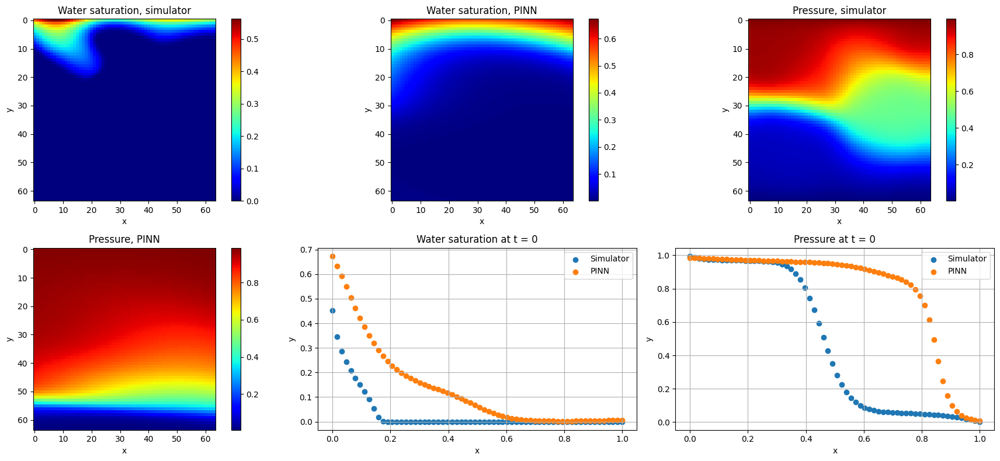

Epoch: 16020 | Loss: 0.00212 | PDE: 0.00526 | BC: 0.00058 | Data: 0.00763
Epoch: 16040 | Loss: 0.00212 | PDE: 0.00526 | BC: 0.00058 | Data: 0.00763
Epoch: 16060 | Loss: 0.00211 | PDE: 0.00525 | BC: 0.00058 | Data: 0.00763
Epoch: 16080 | Loss: 0.00211 | PDE: 0.00525 | BC: 0.00058 | Data: 0.00763
Epoch: 16100 | Loss: 0.00211 | PDE: 0.00525 | BC: 0.00058 | Data: 0.00763
Epoch: 16120 | Loss: 0.00211 | PDE: 0.00525 | BC: 0.00058 | Data: 0.00762
Epoch: 16140 | Loss: 0.00211 | PDE: 0.00524 | BC: 0.00058 | Data: 0.00762
Epoch: 16160 | Loss: 0.00211 | PDE: 0.00524 | BC: 0.00058 | Data: 0.00762
Epoch: 16180 | Loss: 0.00211 | PDE: 0.00524 | BC: 0.00058 | Data: 0.00762
Epoch: 16200 | Loss: 0.00210 | PDE: 0.00524 | BC: 0.00058 | Data: 0.00762


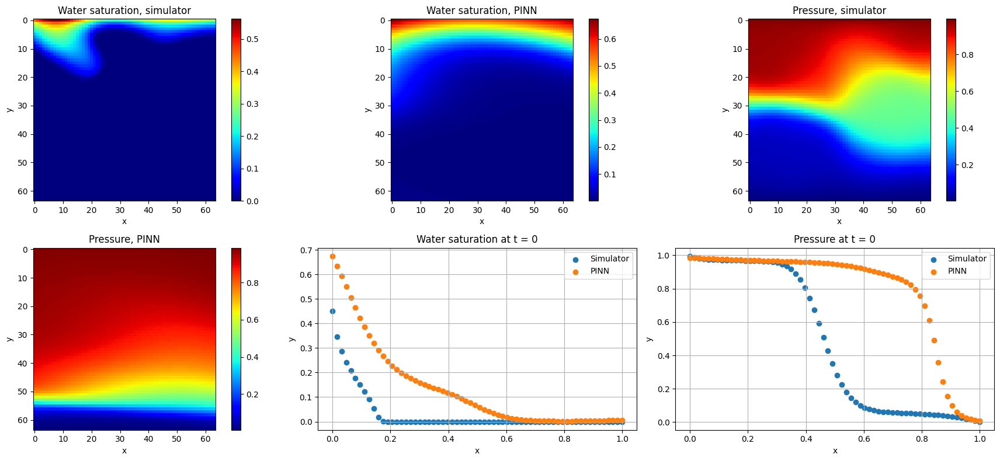

Epoch: 16220 | Loss: 0.00210 | PDE: 0.00523 | BC: 0.00058 | Data: 0.00761
Epoch: 16240 | Loss: 0.00210 | PDE: 0.00523 | BC: 0.00058 | Data: 0.00761
Epoch: 16260 | Loss: 0.00210 | PDE: 0.00523 | BC: 0.00058 | Data: 0.00761
Epoch: 16280 | Loss: 0.00210 | PDE: 0.00523 | BC: 0.00058 | Data: 0.00761
Epoch: 16300 | Loss: 0.00210 | PDE: 0.00523 | BC: 0.00058 | Data: 0.00761
Epoch: 16320 | Loss: 0.00210 | PDE: 0.00522 | BC: 0.00058 | Data: 0.00761
Epoch: 16340 | Loss: 0.00210 | PDE: 0.00522 | BC: 0.00058 | Data: 0.00760
Epoch: 16360 | Loss: 0.00209 | PDE: 0.00522 | BC: 0.00058 | Data: 0.00760
Epoch: 16380 | Loss: 0.00209 | PDE: 0.00522 | BC: 0.00057 | Data: 0.00760
Epoch: 16400 | Loss: 0.00209 | PDE: 0.00522 | BC: 0.00057 | Data: 0.00760


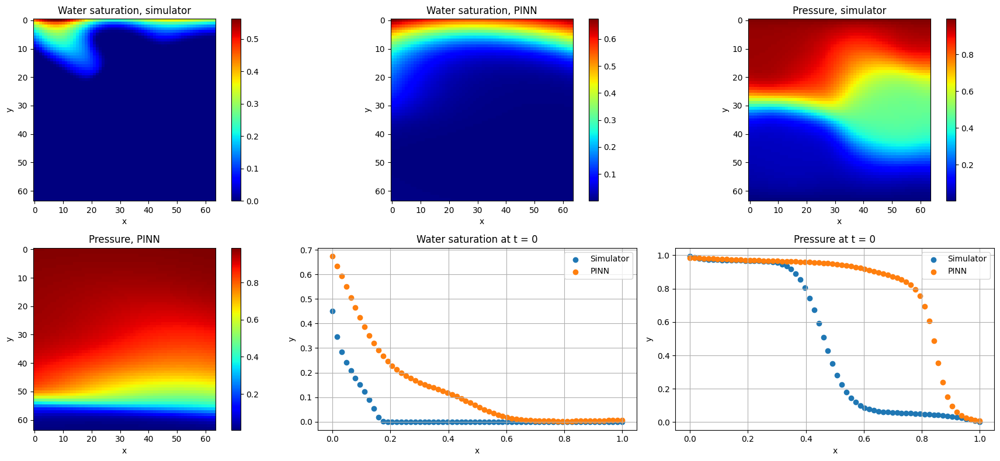

Epoch: 16420 | Loss: 0.00209 | PDE: 0.00521 | BC: 0.00057 | Data: 0.00760
Epoch: 16440 | Loss: 0.00209 | PDE: 0.00521 | BC: 0.00057 | Data: 0.00759
Epoch: 16460 | Loss: 0.00209 | PDE: 0.00521 | BC: 0.00057 | Data: 0.00759
Epoch: 16480 | Loss: 0.00209 | PDE: 0.00521 | BC: 0.00057 | Data: 0.00759
Epoch: 16500 | Loss: 0.00208 | PDE: 0.00521 | BC: 0.00057 | Data: 0.00759
Epoch: 16520 | Loss: 0.00208 | PDE: 0.00520 | BC: 0.00057 | Data: 0.00759
Epoch: 16540 | Loss: 0.00208 | PDE: 0.00520 | BC: 0.00057 | Data: 0.00759
Epoch: 16560 | Loss: 0.00208 | PDE: 0.00520 | BC: 0.00057 | Data: 0.00758
Epoch: 16580 | Loss: 0.00208 | PDE: 0.00520 | BC: 0.00057 | Data: 0.00758
Epoch: 16600 | Loss: 0.00208 | PDE: 0.00520 | BC: 0.00057 | Data: 0.00758


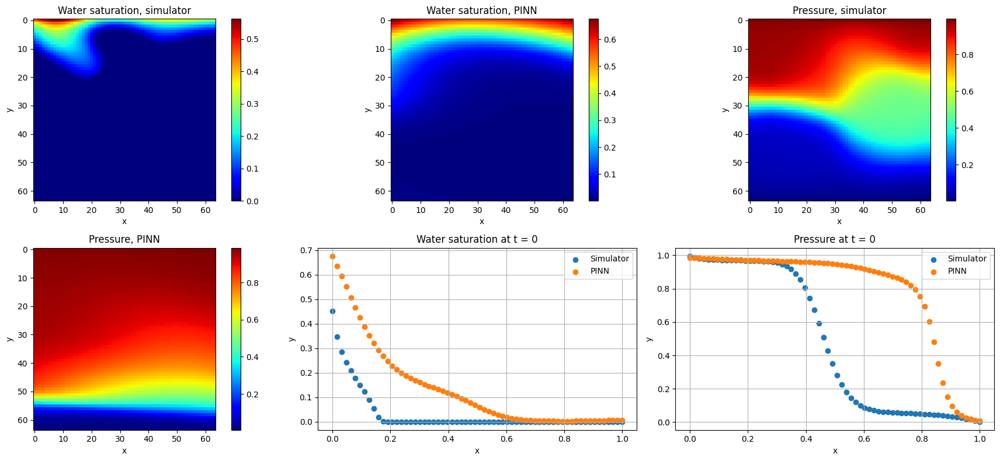

Epoch: 16620 | Loss: 0.00208 | PDE: 0.00519 | BC: 0.00057 | Data: 0.00758
Epoch: 16640 | Loss: 0.00208 | PDE: 0.00519 | BC: 0.00057 | Data: 0.00758
Epoch: 16660 | Loss: 0.00208 | PDE: 0.00519 | BC: 0.00057 | Data: 0.00758
Epoch: 16680 | Loss: 0.00207 | PDE: 0.00519 | BC: 0.00057 | Data: 0.00757
Epoch: 16700 | Loss: 0.00207 | PDE: 0.00519 | BC: 0.00057 | Data: 0.00757
Epoch: 16720 | Loss: 0.00207 | PDE: 0.00518 | BC: 0.00057 | Data: 0.00757
Epoch: 16740 | Loss: 0.00207 | PDE: 0.00518 | BC: 0.00057 | Data: 0.00757
Epoch: 16760 | Loss: 0.00207 | PDE: 0.00518 | BC: 0.00057 | Data: 0.00757
Epoch: 16780 | Loss: 0.00207 | PDE: 0.00518 | BC: 0.00057 | Data: 0.00757
Epoch: 16800 | Loss: 0.00207 | PDE: 0.00518 | BC: 0.00057 | Data: 0.00757


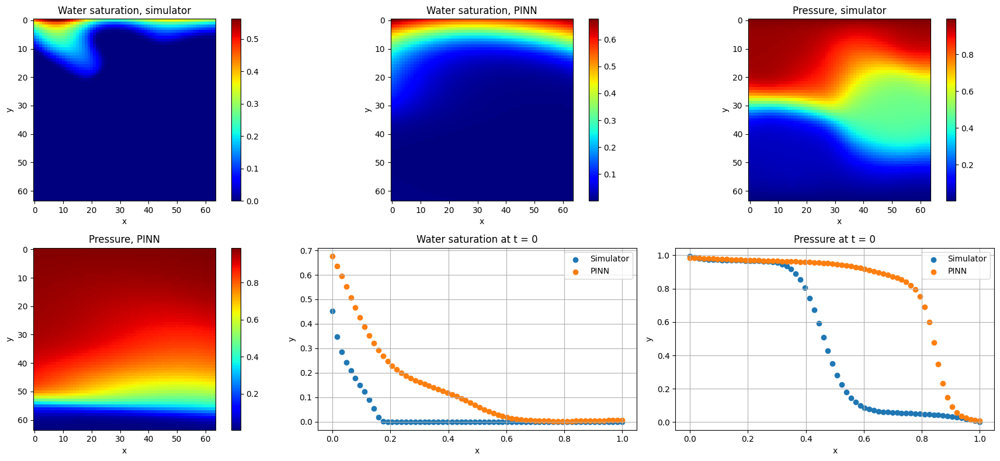

Epoch: 16820 | Loss: 0.00207 | PDE: 0.00517 | BC: 0.00057 | Data: 0.00756
Epoch: 16840 | Loss: 0.00206 | PDE: 0.00517 | BC: 0.00057 | Data: 0.00756
Epoch: 16860 | Loss: 0.00206 | PDE: 0.00517 | BC: 0.00057 | Data: 0.00756
Epoch: 16880 | Loss: 0.00206 | PDE: 0.00517 | BC: 0.00057 | Data: 0.00756
Epoch: 16900 | Loss: 0.00206 | PDE: 0.00517 | BC: 0.00057 | Data: 0.00756
Epoch: 16920 | Loss: 0.00206 | PDE: 0.00517 | BC: 0.00057 | Data: 0.00756
Epoch: 16940 | Loss: 0.00206 | PDE: 0.00516 | BC: 0.00057 | Data: 0.00756
Epoch: 16960 | Loss: 0.00206 | PDE: 0.00516 | BC: 0.00057 | Data: 0.00755
Epoch: 16980 | Loss: 0.00206 | PDE: 0.00516 | BC: 0.00057 | Data: 0.00755
Epoch: 17000 | Loss: 0.00206 | PDE: 0.00516 | BC: 0.00057 | Data: 0.00755


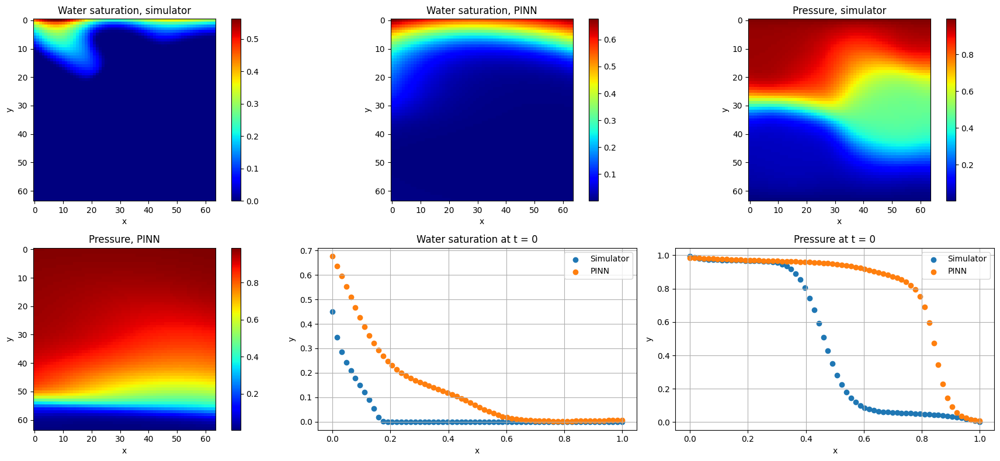

Epoch: 17020 | Loss: 0.00205 | PDE: 0.00516 | BC: 0.00057 | Data: 0.00755
Epoch: 17040 | Loss: 0.00205 | PDE: 0.00516 | BC: 0.00057 | Data: 0.00755
Epoch: 17060 | Loss: 0.00205 | PDE: 0.00515 | BC: 0.00057 | Data: 0.00755
Epoch: 17080 | Loss: 0.00205 | PDE: 0.00515 | BC: 0.00057 | Data: 0.00755
Epoch: 17100 | Loss: 0.00205 | PDE: 0.00515 | BC: 0.00057 | Data: 0.00754
Epoch: 17120 | Loss: 0.00205 | PDE: 0.00515 | BC: 0.00057 | Data: 0.00754
Epoch: 17140 | Loss: 0.00205 | PDE: 0.00515 | BC: 0.00057 | Data: 0.00754
Epoch: 17160 | Loss: 0.00205 | PDE: 0.00515 | BC: 0.00057 | Data: 0.00754
Epoch: 17180 | Loss: 0.00205 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00754
Epoch: 17200 | Loss: 0.00205 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00754


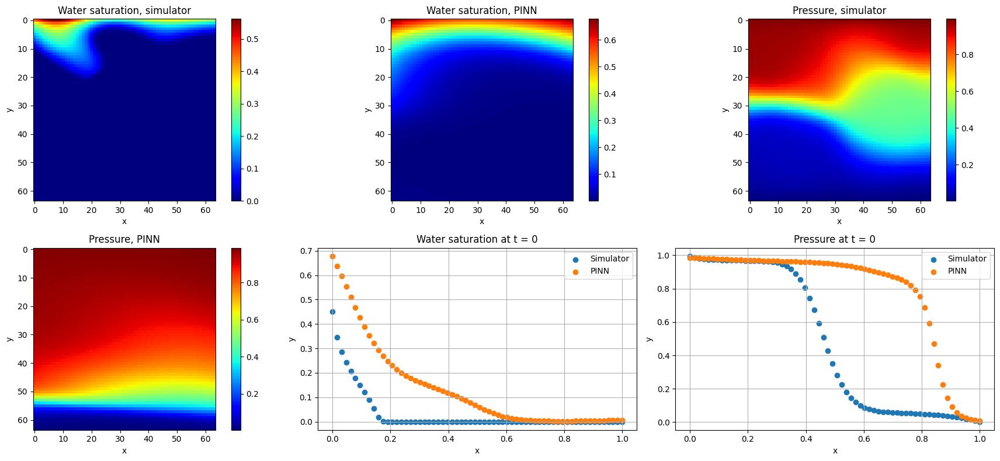

Epoch: 17220 | Loss: 0.00204 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00754
Epoch: 17240 | Loss: 0.00204 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00753
Epoch: 17260 | Loss: 0.00204 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00753
Epoch: 17280 | Loss: 0.00204 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00753
Epoch: 17300 | Loss: 0.00204 | PDE: 0.00514 | BC: 0.00057 | Data: 0.00753
Epoch: 17320 | Loss: 0.00204 | PDE: 0.00513 | BC: 0.00057 | Data: 0.00753
Epoch: 17340 | Loss: 0.00204 | PDE: 0.00513 | BC: 0.00057 | Data: 0.00753
Epoch: 17360 | Loss: 0.00204 | PDE: 0.00513 | BC: 0.00057 | Data: 0.00753
Epoch: 17380 | Loss: 0.00204 | PDE: 0.00513 | BC: 0.00057 | Data: 0.00753
Epoch: 17400 | Loss: 0.00204 | PDE: 0.00513 | BC: 0.00057 | Data: 0.00752


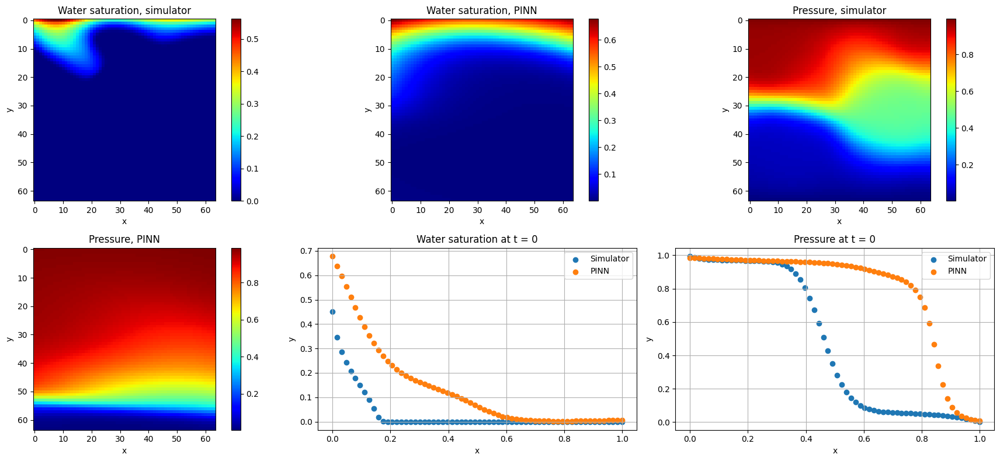

Epoch: 17420 | Loss: 0.00204 | PDE: 0.00513 | BC: 0.00057 | Data: 0.00752
Epoch: 17440 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17460 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17480 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17500 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17520 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17540 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17560 | Loss: 0.00203 | PDE: 0.00512 | BC: 0.00057 | Data: 0.00752
Epoch: 17580 | Loss: 0.00203 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751
Epoch: 17600 | Loss: 0.00203 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751


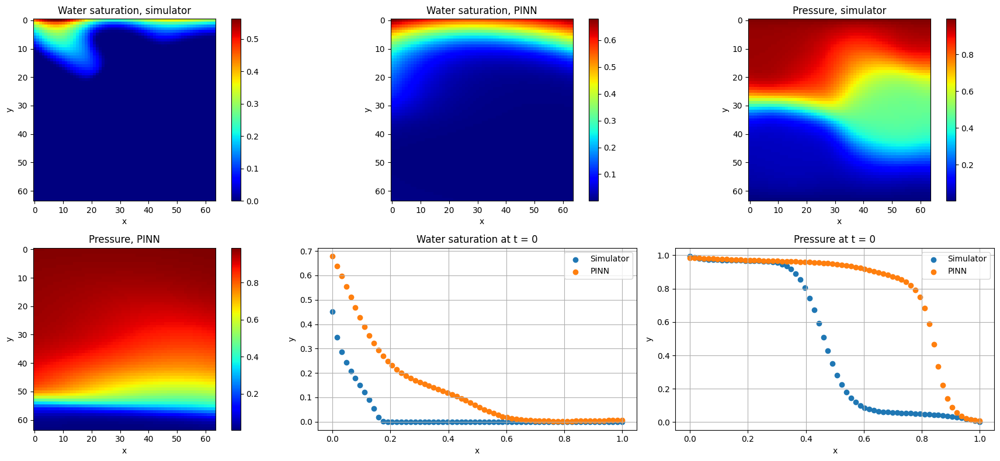

Epoch: 17620 | Loss: 0.00203 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751
Epoch: 17640 | Loss: 0.00203 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751
Epoch: 17660 | Loss: 0.00202 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751
Epoch: 17680 | Loss: 0.00202 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751
Epoch: 17700 | Loss: 0.00202 | PDE: 0.00511 | BC: 0.00057 | Data: 0.00751
Epoch: 17720 | Loss: 0.00202 | PDE: 0.00511 | BC: 0.00056 | Data: 0.00751
Epoch: 17740 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00751
Epoch: 17760 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750
Epoch: 17780 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750
Epoch: 17800 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750


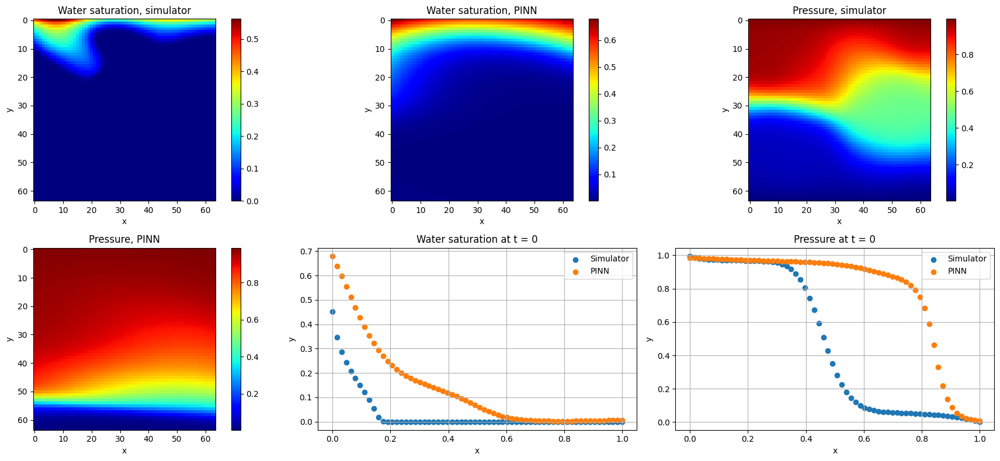

Epoch: 17820 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750
Epoch: 17840 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750
Epoch: 17860 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750
Epoch: 17880 | Loss: 0.00202 | PDE: 0.00510 | BC: 0.00056 | Data: 0.00750
Epoch: 17900 | Loss: 0.00202 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00750
Epoch: 17920 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00750
Epoch: 17940 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00750
Epoch: 17960 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00749
Epoch: 17980 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00749
Epoch: 18000 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00749


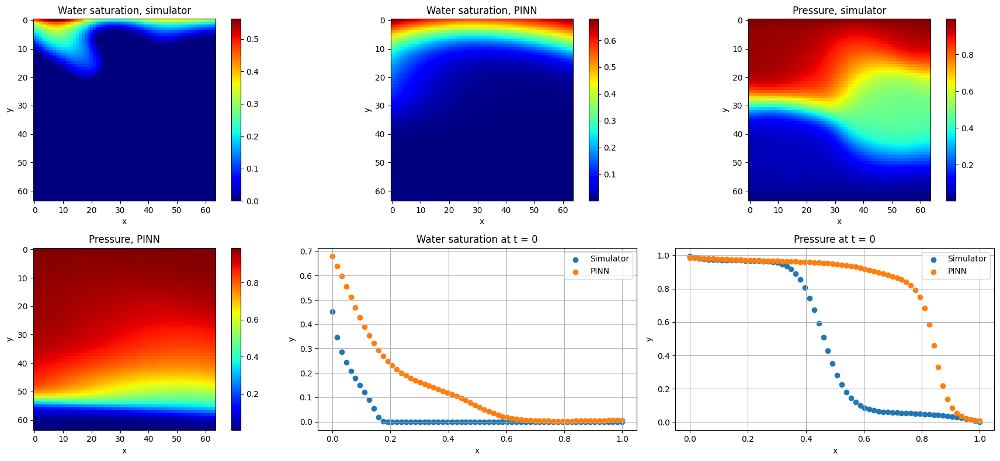

Epoch: 18020 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00749
Epoch: 18040 | Loss: 0.00201 | PDE: 0.00509 | BC: 0.00056 | Data: 0.00749
Epoch: 18060 | Loss: 0.00201 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00749
Epoch: 18080 | Loss: 0.00201 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00749
Epoch: 18100 | Loss: 0.00201 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00749
Epoch: 18120 | Loss: 0.00201 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00749
Epoch: 18140 | Loss: 0.00201 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00749
Epoch: 18160 | Loss: 0.00201 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00748
Epoch: 18180 | Loss: 0.00200 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00748
Epoch: 18200 | Loss: 0.00200 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00748


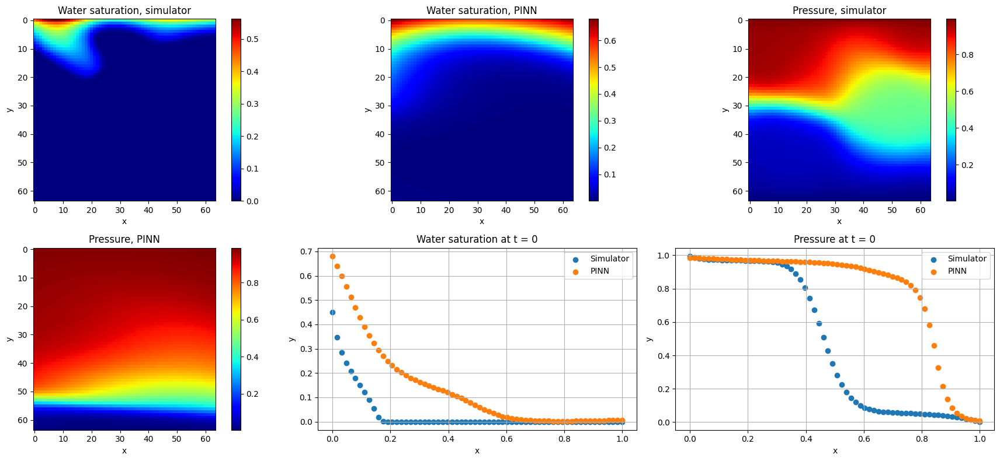

Epoch: 18220 | Loss: 0.00200 | PDE: 0.00508 | BC: 0.00056 | Data: 0.00748
Epoch: 18240 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18260 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18280 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18300 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18320 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18340 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18360 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00748
Epoch: 18380 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00747
Epoch: 18400 | Loss: 0.00200 | PDE: 0.00507 | BC: 0.00056 | Data: 0.00747


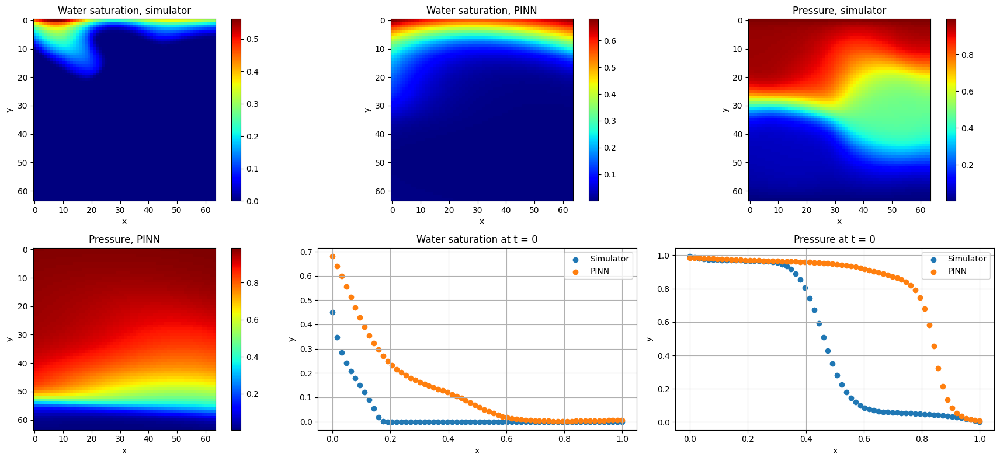

Epoch: 18420 | Loss: 0.00200 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18440 | Loss: 0.00200 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18460 | Loss: 0.00200 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18480 | Loss: 0.00200 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18500 | Loss: 0.00199 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18520 | Loss: 0.00199 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18540 | Loss: 0.00199 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18560 | Loss: 0.00199 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18580 | Loss: 0.00199 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747
Epoch: 18600 | Loss: 0.00199 | PDE: 0.00506 | BC: 0.00056 | Data: 0.00747


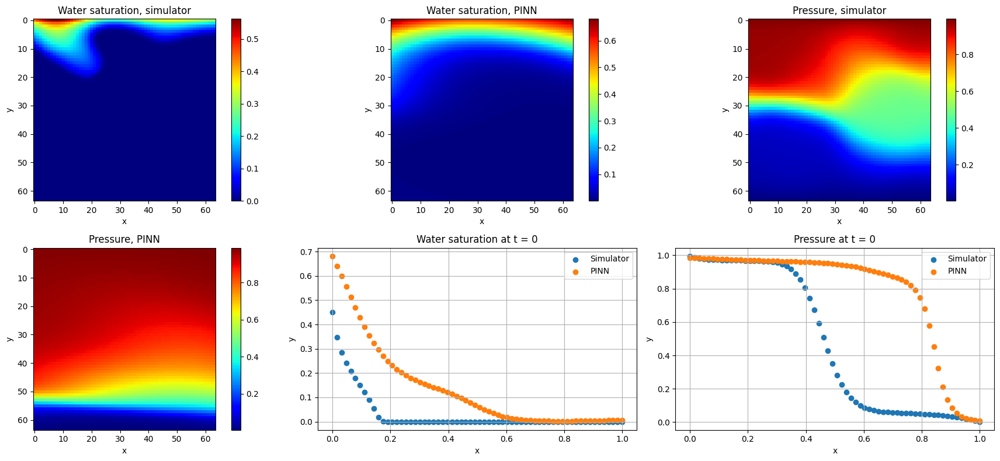

Epoch: 18620 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00747
Epoch: 18640 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18660 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18680 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18700 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18720 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18740 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18760 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18780 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18800 | Loss: 0.00199 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746


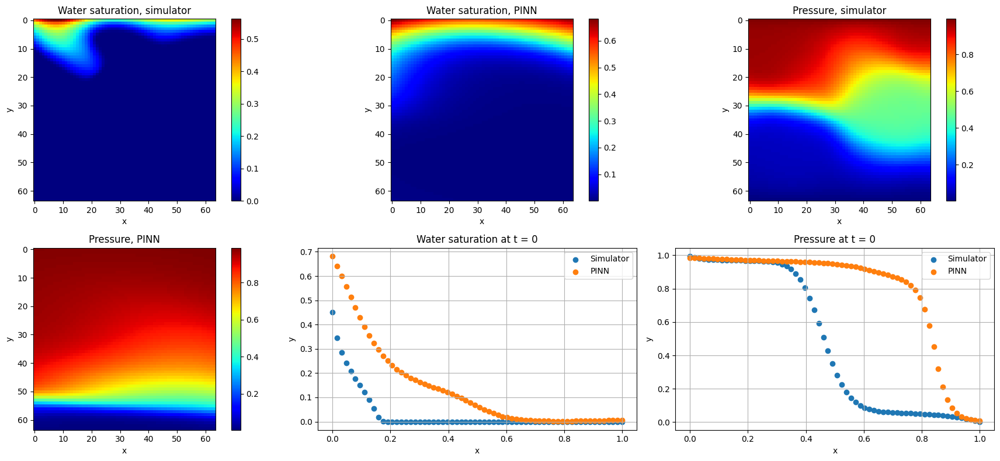

Epoch: 18820 | Loss: 0.00198 | PDE: 0.00505 | BC: 0.00056 | Data: 0.00746
Epoch: 18840 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00746
Epoch: 18860 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00746
Epoch: 18880 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00746
Epoch: 18900 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 18920 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 18940 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 18960 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 18980 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 19000 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745


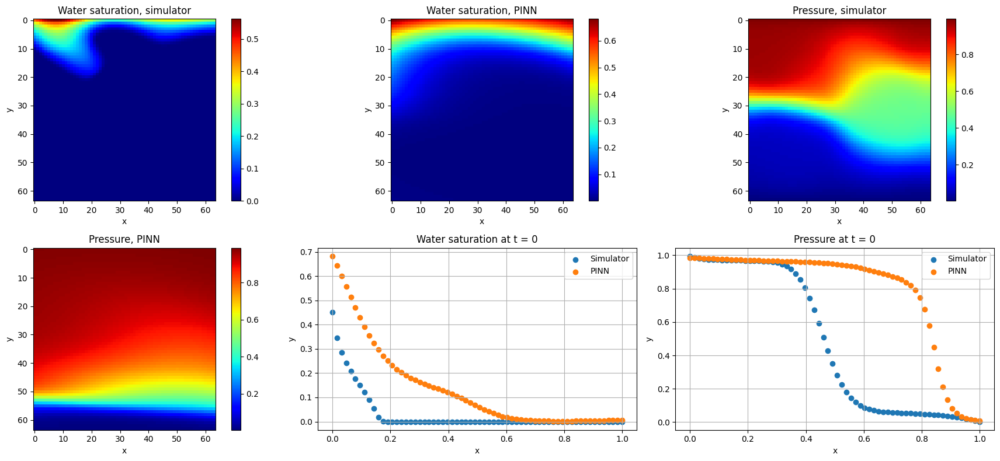

Epoch: 19020 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 19040 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 19060 | Loss: 0.00198 | PDE: 0.00504 | BC: 0.00056 | Data: 0.00745
Epoch: 19080 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00745
Epoch: 19100 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00745
Epoch: 19120 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00745
Epoch: 19140 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00745
Epoch: 19160 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00745
Epoch: 19180 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00745
Epoch: 19200 | Loss: 0.00198 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744


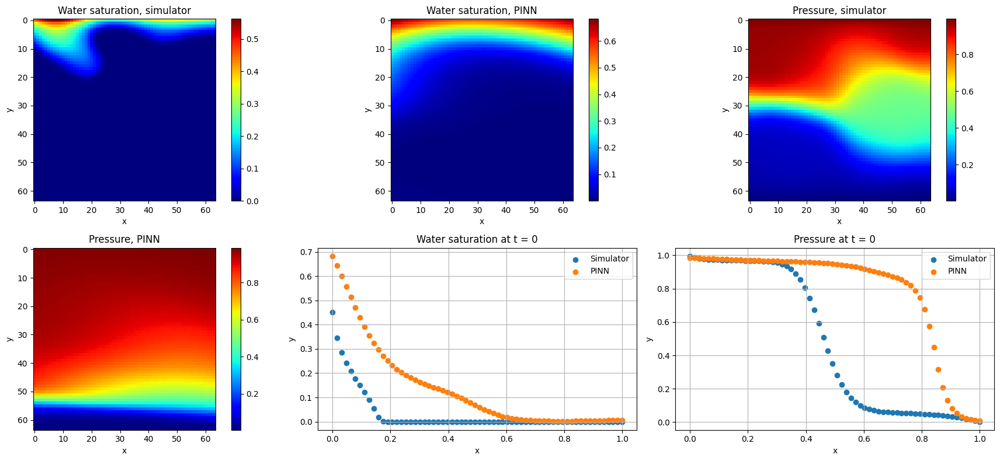

Epoch: 19220 | Loss: 0.00197 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744
Epoch: 19240 | Loss: 0.00197 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744
Epoch: 19260 | Loss: 0.00197 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744
Epoch: 19280 | Loss: 0.00197 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744
Epoch: 19300 | Loss: 0.00197 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744
Epoch: 19320 | Loss: 0.00197 | PDE: 0.00503 | BC: 0.00056 | Data: 0.00744
Epoch: 19340 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19360 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19380 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19400 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744


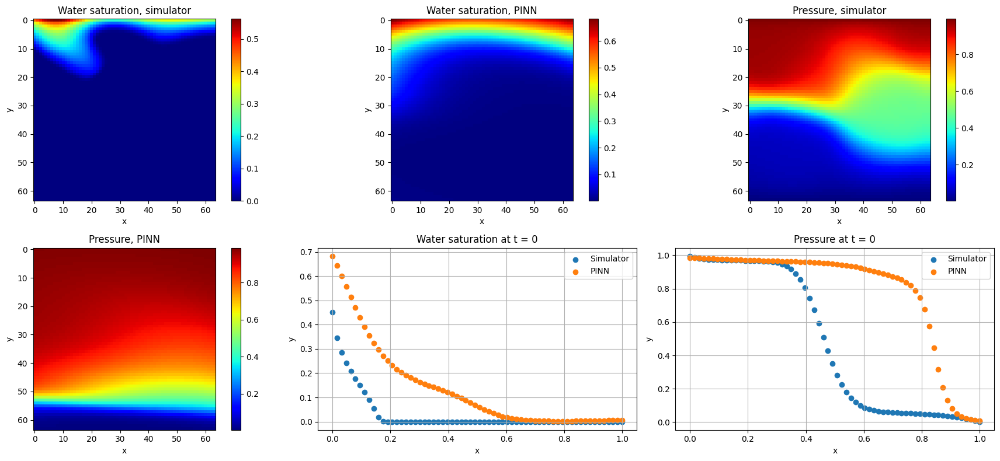

Epoch: 19420 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19440 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19460 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19480 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19500 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19520 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00744
Epoch: 19540 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00743
Epoch: 19560 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00743
Epoch: 19580 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00743
Epoch: 19600 | Loss: 0.00197 | PDE: 0.00502 | BC: 0.00056 | Data: 0.00743


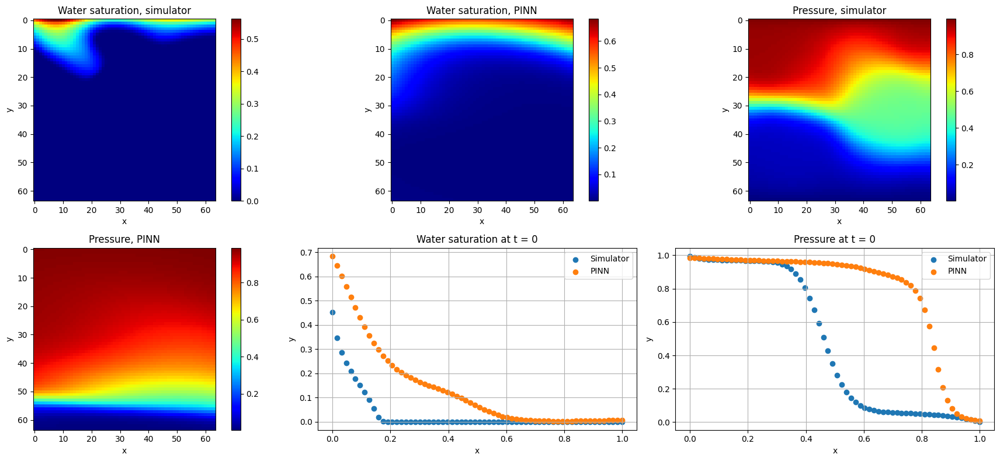

Epoch: 19620 | Loss: 0.00197 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19640 | Loss: 0.00197 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19660 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19680 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19700 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19720 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19740 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19760 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19780 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19800 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743


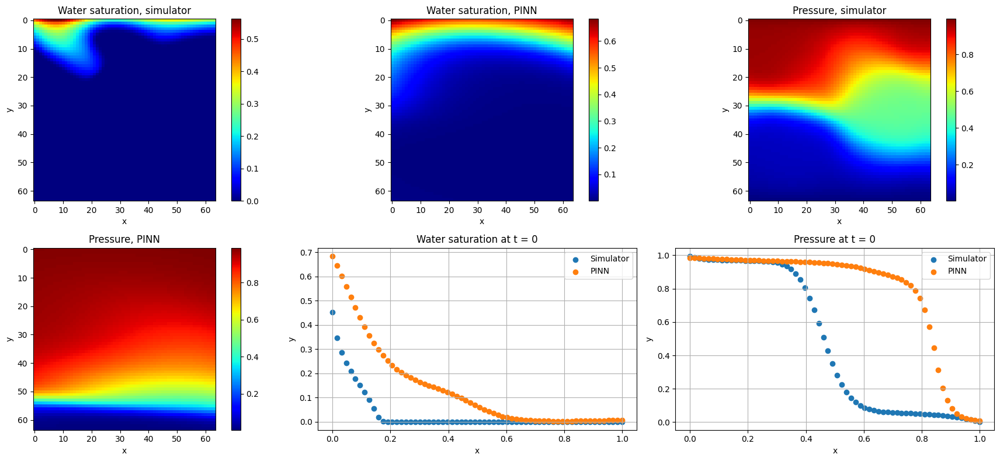

Epoch: 19820 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19840 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19860 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19880 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19900 | Loss: 0.00196 | PDE: 0.00501 | BC: 0.00056 | Data: 0.00743
Epoch: 19920 | Loss: 0.00196 | PDE: 0.00500 | BC: 0.00056 | Data: 0.00742
Epoch: 19940 | Loss: 0.00196 | PDE: 0.00500 | BC: 0.00056 | Data: 0.00742
Epoch: 19960 | Loss: 0.00196 | PDE: 0.00500 | BC: 0.00056 | Data: 0.00742
Epoch: 19980 | Loss: 0.00196 | PDE: 0.00500 | BC: 0.00056 | Data: 0.00742


In [37]:
epochs = 20_000

# Initialize Model
# model = pinn_model().to(DEVICE)
# model = ModifiedPINN(
#    input_dim=7,
#    hidden_dim=128,
#    num_layers=5,
#    output_dim=7
# ).to(DEVICE)
DEVICE = 'cpu'
model = ModifiedPINN(
   input_dim=7,
   hidden_dim=32,  # Try 128, 256
   num_layers=4,    # Try 5-8
   output_dim=7
).to(DEVICE)
# model.load_state_dict(torch.load('pinn-test4-250-batched-new.pth',map_location=DEVICE))

optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
min_loss = float('inf')  # Renamed from max_dist for clarity

# ============================================================================
# PREPARE FULL DATASETS ON DEVICE (Done once before loop)
# ============================================================================

# 1. PDE / Collocation Points (All points)
points_full = points.to(DEVICE)

# 2. Permeability Vector (All points)
# Assuming 'perm', 'x', and 'y' are aligned with 'points'
perm_vec_full = torch.tensor(
    perm[list(x.cpu().detach().numpy().astype(int)), 
         list(y.cpu().detach().numpy().astype(int)), -1].astype(np.float32)
).to(DEVICE)

# 3. Boundary Condition Points (All points)
pres0_pts = pres0_x1_points.to(DEVICE)
pres1_pts = pres1_x1_points.to(DEVICE)
soil0_pts = soil0_x1_points.to(DEVICE)
swat0_pts = swat0_x1_points.to(DEVICE)

# 4. Simulation / Data Fitting Points (All points)
data_points_full = points.to(DEVICE) # Assuming simulation data aligns with points
sim_data_full = simulation_data_train.to(DEVICE)

# ============================================================================
# MAIN TRAINING LOOP (FULL BATCH)
# ============================================================================

for cur_epoch in trange(epochs):
    
    optimizer.zero_grad()
    
    # --------------------------------------------------------------------
    # 1. PDE RESIDUALS (Full Dataset)
    # --------------------------------------------------------------------
    # Compute residuals on all points at once
    
    
    r1, r2, r3_x1, r3_x2, r4_x1, r4_x2, r5, _ = \
        compute_pde_residuals(model, points_full, perm_vec_full)
    
    loss0 = torch.mean(
        r1**2 + r2**2 + r3_x1**2 + r3_x2**2 + r4_x1**2 + r4_x2**2 + r5**2
    )
    
    # --------------------------------------------------------------------
    # 2. BOUNDARY CONDITIONS (Full Dataset)
    # --------------------------------------------------------------------
    # Predict on all boundary points
    press0 = model(pres0_pts)[:, 0]
    press1 = model(pres1_pts)[:, 0]
    soil0 = model(soil0_pts)[:, 1]
    swat0 = model(swat0_pts)[:, 2]
    
    loss1 = torch.mean(
        (press0 - 1.0)**2 + press1**2 + 
        (soil0 - 1.0)**2 + swat0**2
    )
    
    # --------------------------------------------------------------------
    # 3. DATA LOSS (Full Dataset)
    # --------------------------------------------------------------------
    # Predict on all data points
    model_res_data = model(data_points_full)
    
    loss2 = torch.mean(
        (model_res_data[:, 0] - sim_data_full[:, 0])**2 + 
        (model_res_data[:, 2] - sim_data_full[:, 1])**2 + 
        (model_res_data[:, 1] - sim_data_full[:, 2])**2
    )
    
    # --------------------------------------------------------------------
    # DYNAMIC WEIGHTS & BACKWARD
    # --------------------------------------------------------------------
    # Compute weights based on the full-batch gradients/losses
    w_ic, w_pde, w_data = compute_weights_grad_orthogonal_autograd(
        model, loss1, loss0, loss2, kappa=8.0
    )
    
    loss = w_pde * loss0 + w_ic * loss1 + w_data * loss2
    
    loss.backward()
    
    # Optional: Gradient clipping usually helps stability even in full batch
    torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
    
    optimizer.step()
    
    # --------------------------------------------------------------------
    # LOGGING & SAVING
    # --------------------------------------------------------------------
    # Current unweighted total loss for comparison
    current_total_dist = loss0.item() + loss1.item() + loss2.item()
    
    if cur_epoch % 20 == 0:
        print(f'Epoch: {cur_epoch} | Loss: {loss.item():.5f} | PDE: {loss0.item():.5f} | BC: {loss1.item():.5f} | Data: {loss2.item():.5f}')
        
    if cur_epoch % 200 == 0:
         # Assuming plot_validation handles moving data to CPU internally if needed
        plot_validation(model, PRES, SWAT, SOIL, device=DEVICE)

    if current_total_dist < min_loss:
        torch.save(model.state_dict(), 'pinn_fullbatch_100-new.pth')
        min_loss = current_total_dist
        
    # Learning rate scheduler
    if cur_epoch % 300 == 0 and cur_epoch > 0:
        optimizer.param_groups[0]['lr'] *= 0.9

  0%|          | 0/30000 [00:00<?, ?it/s]

epoch: 0	loss: (0.6933379854474749, 1.1463757114750999, 0.6158218894686017, 0.6158218894686017)	


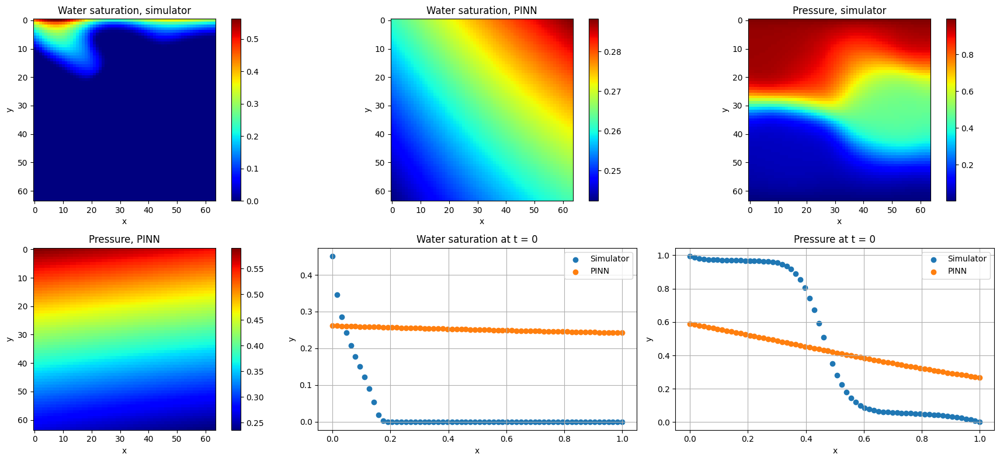

epoch: 20	loss: (0.02771469418491636, 0.04088718311062881, 0.008934009221515484, 0.008934009221515484)	
epoch: 40	loss: (0.023214551753231456, 0.03895445114799908, 0.004787326391254153, 0.004787326391254153)	
epoch: 60	loss: (0.021747976009334837, 0.03808748535811901, 0.002744870027527213, 0.002744870027527213)	
epoch: 80	loss: (0.02211980920817171, 0.04078688605555466, 0.003753155203802245, 0.003753155203802245)	
epoch: 100	loss: (0.020000170916318893, 0.03664397355169058, 0.0033369211346975397, 0.0033369211346975397)	
epoch: 120	loss: (0.01794455260304468, 0.034879687508302074, 0.002478445164992341, 0.002478445164992341)	
epoch: 140	loss: (0.0508675267919898, 0.06333463452756405, 0.0018205449284453476, 0.0018205449284453476)	
epoch: 160	loss: (0.02044402195938996, 0.033383714966475964, 0.0030103170179894994, 0.0030103170179894994)	
epoch: 180	loss: (0.01793556467496923, 0.03116572887769767, 0.0006862148501178515, 0.0006862148501178515)	
epoch: 200	loss: (0.022205342738223926, 0.03283

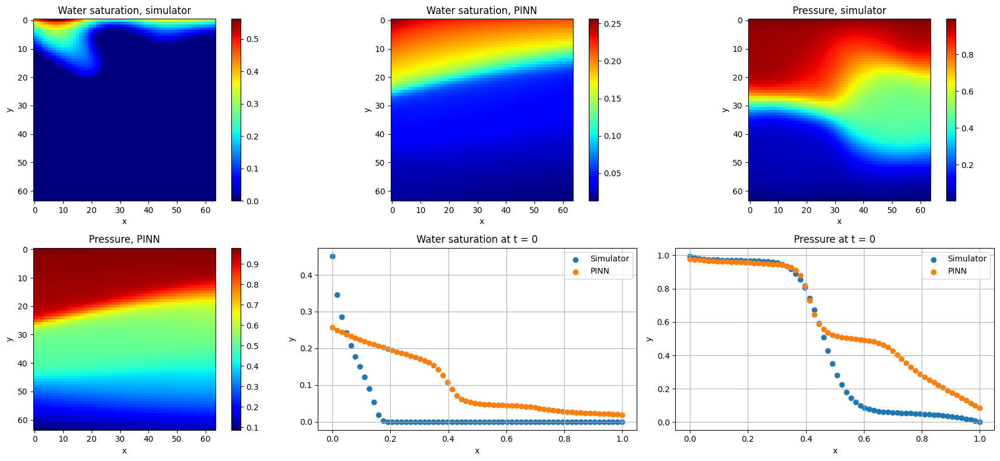

epoch: 220	loss: (0.022018377669155598, 0.046252774340765815, 0.0011335705889255873, 0.0011335705889255873)	
epoch: 240	loss: (0.051784113847783635, 0.07404583373240062, 0.0011413840319229557, 0.0011413840319229557)	
epoch: 260	loss: (0.04165391464318548, 0.0644628924450704, 0.006209590272711856, 0.006209590272711856)	
epoch: 280	loss: (0.006330392589526517, 0.01689861249178648, 0.00025852160719555935, 0.00025852160719555935)	
epoch: 300	loss: (0.0033006712162335005, 0.005546469607257417, 0.00029584745061583817, 0.00029584745061583817)	
epoch: 320	loss: (0.004322880496537047, 0.012028634016002928, 0.00047492686384690126, 0.00047492686384690126)	
epoch: 340	loss: (0.007254689133593014, 0.014484854015920843, 0.0012954867145578777, 0.0012954867145578777)	
epoch: 360	loss: (0.040804075343268256, 0.05834994252238955, 0.018998158496937582, 0.018998158496937582)	
epoch: 380	loss: (0.03364051505923271, 0.054934621921607425, 0.011227003431745939, 0.011227003431745939)	
epoch: 400	loss: (0.13295

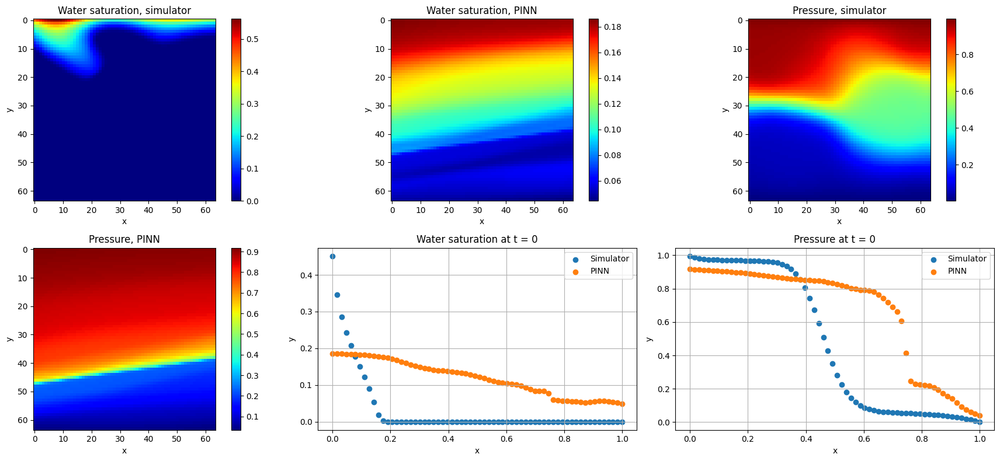

epoch: 420	loss: (0.0604102619524513, 0.08346028998494148, 0.008454381222171443, 0.008454381222171443)	
epoch: 440	loss: (0.03616862105471747, 0.054539287995014875, 0.011289754948977913, 0.011289754948977913)	
epoch: 460	loss: (0.026924822479486465, 0.050998971930571964, 0.004245448857545853, 0.004245448857545853)	
epoch: 480	loss: (0.04123048271451678, 0.06122116505035332, 0.004578342594738517, 0.004578342594738517)	
epoch: 500	loss: (0.15724520784403598, 0.18338897079229355, 0.014290850742587022, 0.014290850742587022)	
epoch: 520	loss: (0.0594793331942388, 0.0763384633298431, 0.026629235595464706, 0.026629235595464706)	
epoch: 540	loss: (0.10159677692822047, 0.11989206182105201, 0.009530612267553806, 0.009530612267553806)	
epoch: 560	loss: (0.025632080755063465, 0.0463771963758128, 0.004287365241907537, 0.004287365241907537)	
epoch: 580	loss: (0.04526545612939766, 0.06411442479916982, 0.004232856145660792, 0.004232856145660792)	
epoch: 600	loss: (0.05735064963144915, 0.08541320370776

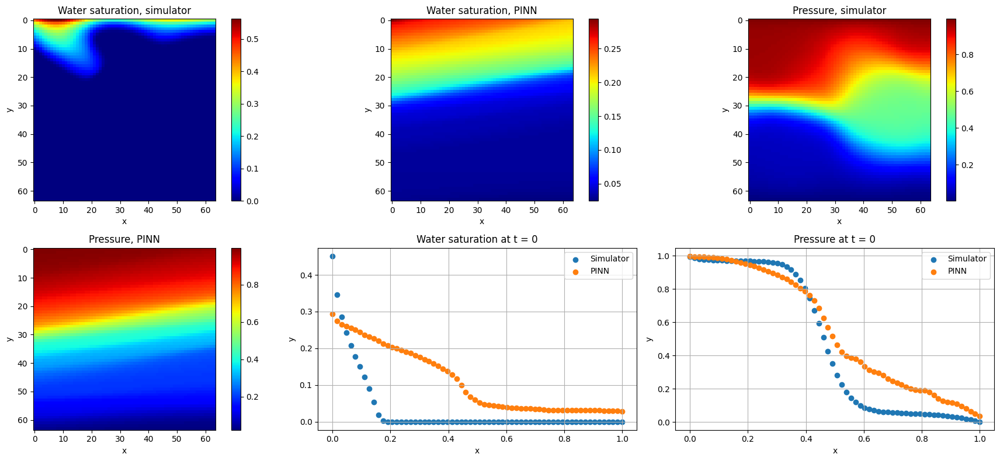

epoch: 620	loss: (0.03129202925733158, 0.05552805534430912, 0.0018064854167667882, 0.0018064854167667882)	
epoch: 640	loss: (0.09498711582273245, 0.10556614212691784, 0.002691549265624157, 0.002691549265624157)	
epoch: 660	loss: (0.02689501510134765, 0.0472881623676845, 0.00772520387545228, 0.00772520387545228)	
epoch: 680	loss: (0.019292217546275685, 0.03386272782725947, 0.004167126990588648, 0.004167126990588648)	
epoch: 700	loss: (0.020358975444521223, 0.03216452111623117, 0.0019170098987940168, 0.0019170098987940168)	
epoch: 720	loss: (0.002584624619755362, 0.00821874789627535, 0.00046255170101565976, 0.00046255170101565976)	
epoch: 740	loss: (0.0024665763235784005, 0.007881381415895053, 0.0003530081989343411, 0.0003530081989343411)	
epoch: 760	loss: (0.0016851788386702538, 0.006356803434235709, 0.00027601586771197617, 0.00027601586771197617)	
epoch: 780	loss: (0.002268784829149289, 0.006326535117945501, 0.0003271101616389517, 0.0003271101616389517)	
epoch: 800	loss: (0.00218069006

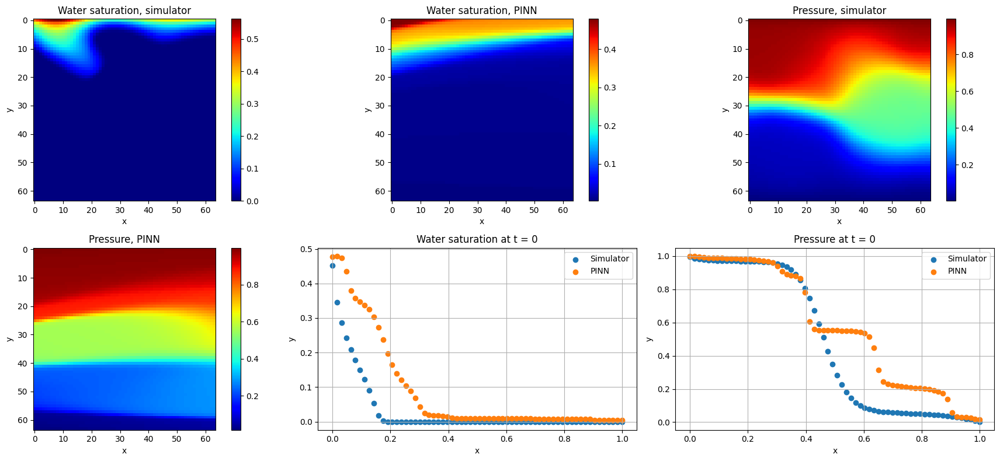

epoch: 820	loss: (0.0015199018026968198, 0.006373033858835697, 0.0003297638613730669, 0.0003297638613730669)	
epoch: 840	loss: (0.008469707315920718, 0.016394308901258876, 0.0001956736502636756, 0.0001956736502636756)	
epoch: 860	loss: (0.0017992510360532574, 0.007097363738077027, 0.0002462144766468555, 0.0002462144766468555)	
epoch: 880	loss: (0.0019665979613949147, 0.00680312913443361, 0.00022231163165997714, 0.00022231163165997714)	
epoch: 900	loss: (3.660922186715262, 3.6995749303272794, 0.016446180774697235, 0.016446180774697235)	
epoch: 920	loss: (0.031371528814945905, 0.05616335730467524, 0.006919977122119495, 0.006919977122119495)	
epoch: 940	loss: (0.0272872620927436, 0.051354305020400455, 0.0040040535386651754, 0.0040040535386651754)	
epoch: 960	loss: (0.04369409927832229, 0.05777816953403609, 0.0038236839630241904, 0.0038236839630241904)	
epoch: 980	loss: (0.061549878280077665, 0.08895539811679296, 0.0028485016830797705, 0.0028485016830797705)	
epoch: 1000	loss: (0.059244491

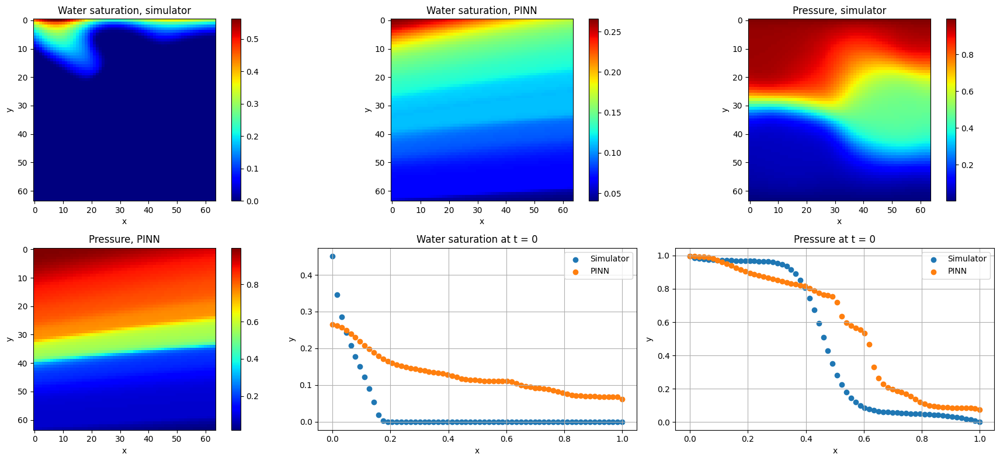

epoch: 1020	loss: (0.10833738265292985, 0.1231444568506309, 0.016829205943005427, 0.016829205943005427)	
epoch: 1040	loss: (0.026274300047329495, 0.042252875066229274, 0.008116539734016572, 0.008116539734016572)	
epoch: 1060	loss: (0.031811340911579986, 0.05175011817898069, 0.00570717962857868, 0.00570717962857868)	
epoch: 1080	loss: (2.413882613182068, 2.449265020234244, 0.0029221105089943323, 0.0029221105089943323)	
epoch: 1100	loss: (0.01882938528433442, 0.028104820155671666, 0.004131709059168186, 0.004131709059168186)	
epoch: 1120	loss: (0.04530939240274685, 0.05115374104518976, 0.0003684119146782905, 0.0003684119146782905)	
epoch: 1140	loss: (0.003995574511853712, 0.010740574316254683, 0.001402590939375971, 0.001402590939375971)	
epoch: 1160	loss: (0.00317960578416075, 0.008521806315651961, 0.001297611211027418, 0.001297611211027418)	
epoch: 1180	loss: (0.00261897620345865, 0.00860920422045248, 0.0009223455646341401, 0.0009223455646341401)	
epoch: 1200	loss: (0.0031138556078076363

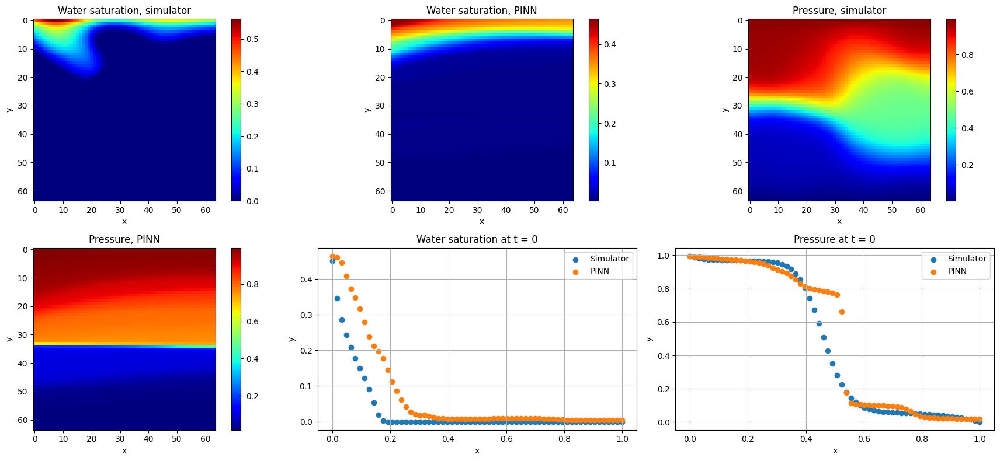

epoch: 1220	loss: (0.0032026030988033327, 0.008137778245976992, 0.0007424399123660155, 0.0007424399123660155)	
epoch: 1240	loss: (0.002592193228857858, 0.009882762895098754, 0.0005026116019247898, 0.0005026116019247898)	
epoch: 1260	loss: (0.002184829258892153, 0.006263964609908206, 0.00034387834187197896, 0.00034387834187197896)	
epoch: 1280	loss: (0.0020547862098153147, 0.0054281288757920265, 0.0008218624030372926, 0.0008218624030372926)	
epoch: 1300	loss: (0.0016510347237012216, 0.005403012635984591, 0.0008458033137555633, 0.0008458033137555633)	
epoch: 1320	loss: (0.006065952558336514, 0.009392358894859041, 0.0013511592322694404, 0.0013511592322694404)	
epoch: 1340	loss: (0.002292712950812919, 0.005621901912880796, 0.0012838700037848736, 0.0012838700037848736)	
epoch: 1360	loss: (0.0019141129284564937, 0.0059914264961012775, 0.0005760008685423859, 0.0005760008685423859)	
epoch: 1380	loss: (0.0019849997146853377, 0.006749028938689402, 0.0006920044044298786, 0.0006920044044298786)	
e

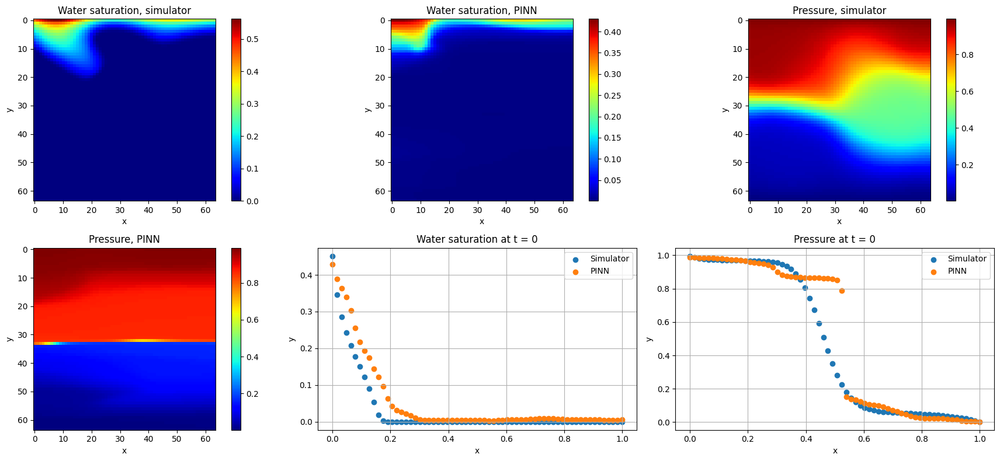

epoch: 1420	loss: (0.005077079138053315, 0.010482047551444598, 0.0008591556522463049, 0.0008591556522463049)	
epoch: 1440	loss: (0.0037011212137128624, 0.011810863324041878, 0.000542340862531481, 0.000542340862531481)	
epoch: 1460	loss: (0.1409918125718832, 0.1624449768236705, 0.004615740950352379, 0.004615740950352379)	
epoch: 1480	loss: (0.03573093616536686, 0.05728188582829067, 0.011811486445367336, 0.011811486445367336)	
epoch: 1500	loss: (0.09829033033124038, 0.11211761433098998, 0.014577089542789119, 0.014577089542789119)	
epoch: 1520	loss: (0.06282499166471618, 0.08704174629279546, 0.010232431681028433, 0.010232431681028433)	
epoch: 1540	loss: (0.17033243791333266, 0.19044367037713528, 0.005640650168061256, 0.005640650168061256)	
epoch: 1560	loss: (0.01872323067592723, 0.034746257322175164, 0.0046191534493118525, 0.0046191534493118525)	
epoch: 1580	loss: (0.02215775102376938, 0.0334800910204649, 0.005480543710291386, 0.005480543710291386)	
epoch: 1600	loss: (0.04754794069698879,

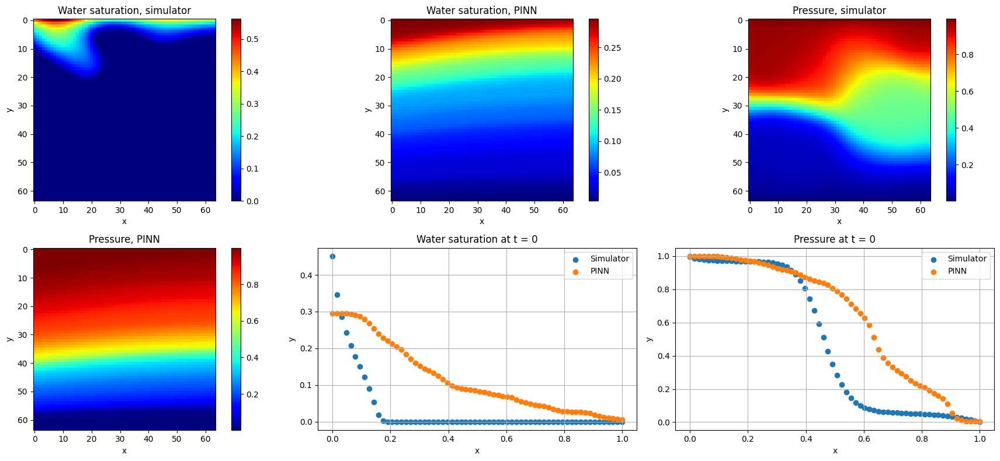

epoch: 1620	loss: (0.04120338535202401, 0.06372257508337498, 0.010969089011528663, 0.010969089011528663)	
epoch: 1640	loss: (0.026348764742059366, 0.051213309700999944, 0.00946333259344101, 0.00946333259344101)	
epoch: 1660	loss: (0.02509314247540065, 0.049324530575956614, 0.005776412053299802, 0.005776412053299802)	
epoch: 1680	loss: (0.022239319447960173, 0.04649592483682292, 0.005806846477623496, 0.005806846477623496)	
epoch: 1700	loss: (0.0234870192195688, 0.04571623541414738, 0.004791780275159648, 0.004791780275159648)	
epoch: 1720	loss: (0.024718455305056914, 0.04813542536326817, 0.00443952444142529, 0.00443952444142529)	
epoch: 1740	loss: (0.023801999565746104, 0.04029808619192669, 0.007373369032783168, 0.007373369032783168)	
epoch: 1760	loss: (0.012675488899861063, 0.022966408170759678, 0.006654439227921622, 0.006654439227921622)	
epoch: 1780	loss: (0.005595306732824871, 0.016210051386484077, 0.0014396786905958184, 0.0014396786905958184)	
epoch: 1800	loss: (0.004653326368757656

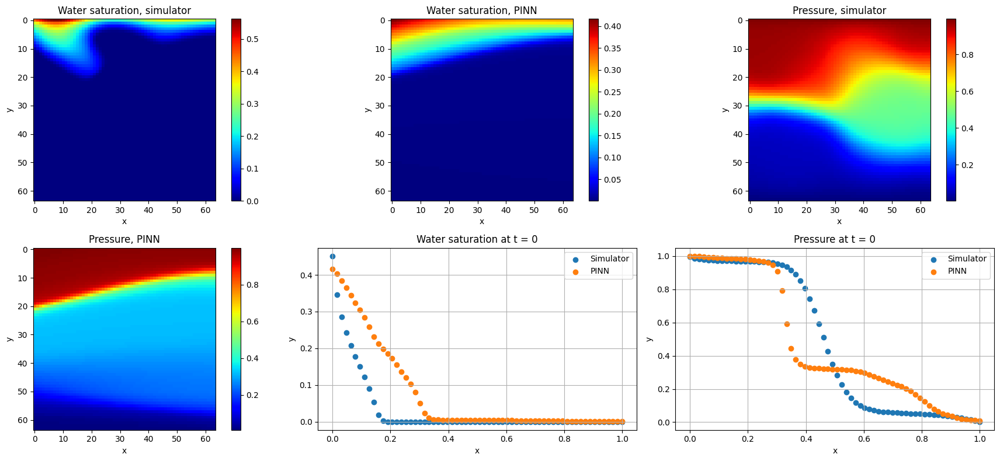

epoch: 1820	loss: (0.004229749852259245, 0.011466626077890396, 0.001131009909191302, 0.001131009909191302)	
epoch: 1840	loss: (0.0075402627033846715, 0.013054020636315857, 0.001920229838495808, 0.001920229838495808)	
epoch: 1860	loss: (0.0031992915152971235, 0.009850652755371161, 0.000976775523408183, 0.000976775523408183)	
epoch: 1880	loss: (0.0033379588276147842, 0.009531571795897824, 0.0007986593575749014, 0.0007986593575749014)	
epoch: 1900	loss: (0.0030234670931739466, 0.00974999022270952, 0.0005728148140146264, 0.0005728148140146264)	
epoch: 1920	loss: (0.04937350696751049, 0.0771833775298936, 0.012682746164500713, 0.012682746164500713)	
epoch: 1940	loss: (0.027795011975935528, 0.05060009179370744, 0.006540873420557806, 0.006540873420557806)	
epoch: 1960	loss: (0.021095324041587964, 0.036876607952373366, 0.0026549959522006767, 0.0026549959522006767)	
epoch: 1980	loss: (0.004945873881557158, 0.012634345396820987, 0.0011502385355665215, 0.0011502385355665215)	
epoch: 2000	loss: (0.

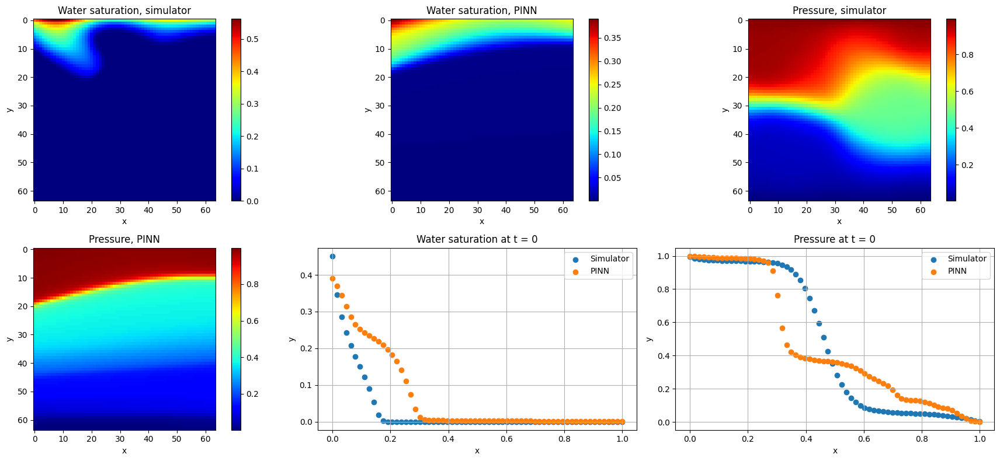

epoch: 2020	loss: (0.00457808847672173, 0.011318347483341182, 0.0011553052380414946, 0.0011553052380414946)	
epoch: 2040	loss: (0.00251533165906689, 0.00837694461058293, 0.00048122934198805263, 0.00048122934198805263)	
epoch: 2060	loss: (0.0034596950614026616, 0.006191231310367584, 0.0019724975572898984, 0.0019724975572898984)	
epoch: 2080	loss: (0.0033595209409083638, 0.00932093130956803, 0.0007760408001818828, 0.0007760408001818828)	
epoch: 2100	loss: (0.004711348031248365, 0.011855719478002616, 0.0007694839649567646, 0.0007694839649567646)	
epoch: 2120	loss: (0.0034864330996892284, 0.009936275758913584, 0.0008935081173798867, 0.0008935081173798867)	
epoch: 2140	loss: (0.003249060645300363, 0.008709905868662255, 0.0005716431811119296, 0.0005716431811119296)	
epoch: 2160	loss: (0.0028013090403484447, 0.009505256877413817, 0.000419053018309309, 0.000419053018309309)	
epoch: 2180	loss: (0.0030209871474653482, 0.010542317825768675, 0.0003526770825763898, 0.0003526770825763898)	
epoch: 22

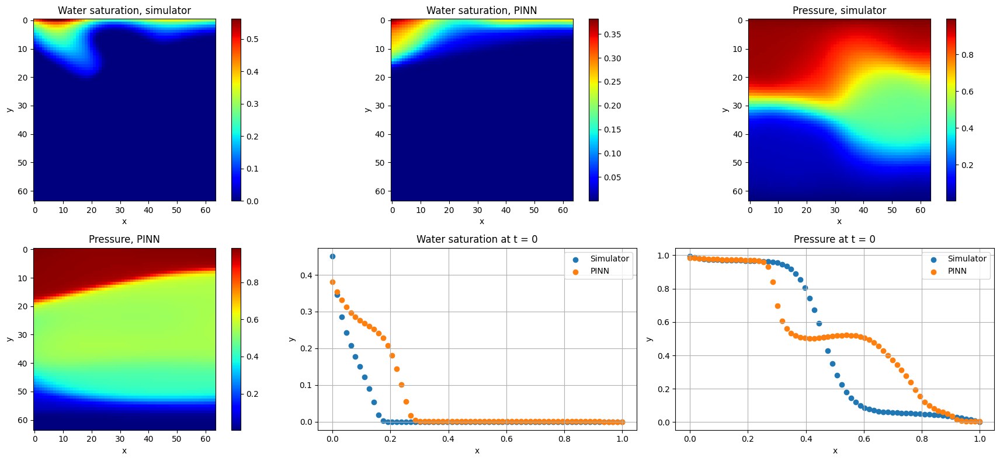

epoch: 2220	loss: (0.0026842465990089943, 0.008355650319052594, 0.0003266927586602313, 0.0003266927586602313)	
epoch: 2240	loss: (0.004049329053876656, 0.009357410782415952, 0.00036801184926714214, 0.00036801184926714214)	
epoch: 2260	loss: (0.2573250191552298, 0.27895694438900265, 0.02684395361159529, 0.02684395361159529)	
epoch: 2280	loss: (0.0334415856216635, 0.058129485696554184, 0.005916312536490815, 0.005916312536490815)	
epoch: 2300	loss: (0.02985855018986123, 0.04673498310148716, 0.004934732303289431, 0.004934732303289431)	
epoch: 2320	loss: (0.0185640917292663, 0.03639363843415465, 0.0037357822792338474, 0.0037357822792338474)	
epoch: 2340	loss: (0.020023184828460217, 0.03434806463441679, 0.004201342152165515, 0.004201342152165515)	
epoch: 2360	loss: (0.028592301133487905, 0.04499285002904279, 0.0016309323587587901, 0.0016309323587587901)	
epoch: 2380	loss: (0.01199000162471618, 0.02260217779049916, 0.0011204431565212353, 0.0011204431565212353)	
epoch: 2400	loss: (0.0074066327

KeyboardInterrupt: 

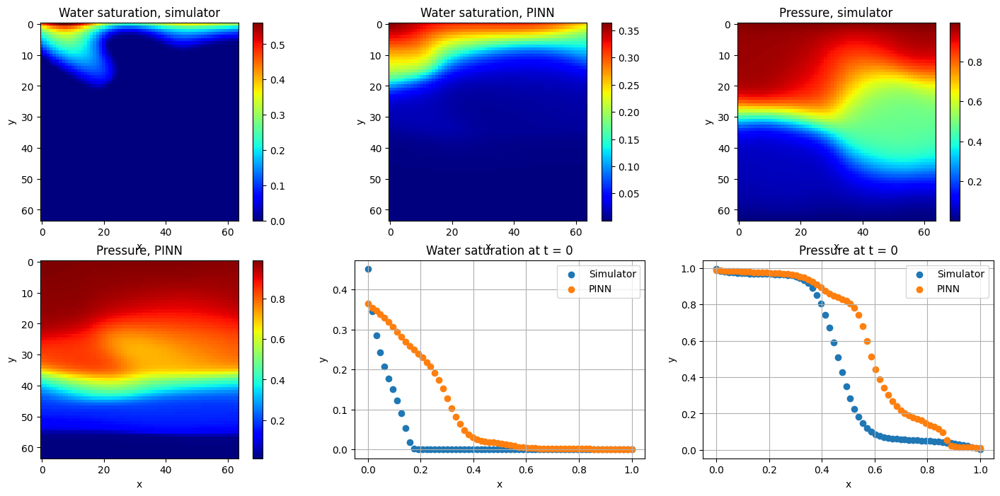

In [48]:
# epochs = 30_000
# BATCH_SIZE = 256
# RESAMPLE_EVERY = 100

# # model = pinn_model().to(DEVICE)
# model = ModifiedPINN(
#    input_dim=7,
#    hidden_dim=128,  # Try 128, 256
#    num_layers=6,    # Try 5-8
#    output_dim=7
# ).to(DEVICE)

# optimizer = torch.optim.Adam(model.parameters(), lr=0.003)
# max_dist = float('inf')

# # Initialize permeability vector
# perm_vec = torch.tensor(
#     perm[list(x.cpu().detach().numpy().astype(int)), 
#          list(y.cpu().detach().numpy().astype(int)), -1].astype(np.float32)
# ).to(DEVICE)


# # ============================================================================
# # MAIN TRAINING LOOP WITH BATCHING (FIXED)
# # ============================================================================

# for cur_epoch in trange(epochs):
    
#     epoch_loss = 0.0
#     epoch_loss0 = 0.0
#     epoch_loss1 = 0.0
#     epoch_loss2 = 0.0
#     num_batches = 0
    
#     # ========================================================================
#     # MINI-BATCH TRAINING
#     # ========================================================================
#     for batch_indices in get_batch_indices(points.shape[0], BATCH_SIZE, shuffle=True):
        
#         optimizer.zero_grad()
        
#         # Get batch data
#         points_batch = points[batch_indices].to(DEVICE)
#         perm_vec_batch = perm_vec[batch_indices]
        
#         # --------------------------------------------------------------------
#         # PDE RESIDUALS - Using fixed function
#         # --------------------------------------------------------------------
#         r1, r2, r3_x1, r3_x2, r4_x1, r4_x2, r5, model_res = \
#             compute_pde_residuals(model, points_batch, perm_vec_batch)
        
#         # PDE loss
#         loss0 = torch.mean(
#             r1**2 + r2**2 + r3_x1**2 + r3_x2**2 + r4_x1**2 + r4_x2**2 + r5**2
#         )
        
#         # --------------------------------------------------------------------
#         # BOUNDARY CONDITIONS - Sample subset
#         # --------------------------------------------------------------------
#         bc_batch_size = min(BATCH_SIZE // 4, 
#                            pres0_x1_points.shape[0],
#                            pres1_x1_points.shape[0],
#                            soil0_x1_points.shape[0],
#                            swat0_x1_points.shape[0])
        
#         bc_idx_pres0 = torch.randperm(pres0_x1_points.shape[0])[:bc_batch_size]
#         bc_idx_pres1 = torch.randperm(pres1_x1_points.shape[0])[:bc_batch_size]
#         bc_idx_soil0 = torch.randperm(soil0_x1_points.shape[0])[:bc_batch_size]
#         bc_idx_swat0 = torch.randperm(swat0_x1_points.shape[0])[:bc_batch_size]
        
#         # Get predictions at boundary points
#         press0 = model(pres0_x1_points[bc_idx_pres0].to(DEVICE))[:, 0]
#         press1 = model(pres1_x1_points[bc_idx_pres1].to(DEVICE))[:, 0]
#         soil0 = model(soil0_x1_points[bc_idx_soil0].to(DEVICE))[:, 1]
#         swat0 = model(swat0_x1_points[bc_idx_swat0].to(DEVICE))[:, 2]
        
#         # Boundary condition loss
#         loss1 = torch.mean(
#             (press0 - 1.0)**2 + press1**2 + 
#             (soil0 - 1.0)**2 + swat0**2
#         )
        
#         # --------------------------------------------------------------------
#         # DATA LOSS - Sample from simulation data
#         # --------------------------------------------------------------------
#         data_batch_size = min(BATCH_SIZE, simulation_data_train.shape[0])
#         data_indices = torch.randperm(simulation_data_train.shape[0])[:data_batch_size]
        
#         # Get corresponding points and simulation data
#         data_points = points[data_indices].to(DEVICE)
#         sim_data = simulation_data_train[data_indices].to(DEVICE)
        
#         # Model predictions on data points
#         model_res_data = model(data_points)
        
#         # Data loss
#         loss2 = torch.mean(
#             (model_res_data[:, 0] - sim_data[:, 0])**2 + 
#             (model_res_data[:, 2] - sim_data[:, 1])**2 + 
#             (model_res_data[:, 1] - sim_data[:, 2])**2
#         )
        
#         # --------------------------------------------------------------------
#         # DYNAMIC WEIGHTS
#         # --------------------------------------------------------------------
#         w_ic, w_pde, w_data = compute_weights_grad_orthogonal_autograd(
#             model, loss1, loss0, loss2, kappa=10.0
#         )
        
#         # Combined loss
#         loss = w_pde * loss0 + w_ic * loss1 + w_data * loss2
        
#         # --------------------------------------------------------------------
#         # BACKWARD PASS
#         # --------------------------------------------------------------------
#         loss.backward()
        
#         # Optional: Gradient clipping
#         torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
#         optimizer.step()
        
#         # Accumulate losses
#         epoch_loss += loss.item()
#         epoch_loss0 += loss0.item()
#         epoch_loss1 += loss1.item()
#         epoch_loss2 += loss2.item()
#         num_batches += 1
    
#     # ========================================================================
#     # EPOCH SUMMARY
#     # ========================================================================
#     epoch_loss /= num_batches
#     epoch_loss0 /= num_batches
#     epoch_loss1 /= num_batches
#     epoch_loss2 /= num_batches
    
#     dist = epoch_loss0 + epoch_loss1 + epoch_loss2
    
#     # Visualization
#     if cur_epoch % 20 == 0:
#         print(f'epoch: {cur_epoch}\tloss: {epoch_loss, epoch_loss0, epoch_loss1, epoch_loss1}\t')
#         # update_loss_plot(cur_epoch, epoch_loss, epoch_loss0, epoch_loss1, epoch_loss2)
#         # plot_validation(model, PRES, SWAT, SOIL, device='mps')
#     if cur_epoch % 200 == 0:
#         plot_validation(model, PRES, SWAT, SOIL, device=DEVICE)
#     # Save best model
#     if dist < max_dist:
#         torch.save(model.state_dict(), 'pinn_model_weights_500.pth')
#         max_dist = dist
    
#     # Learning rate decay
#     if cur_epoch % 500 == 0 and cur_epoch > 0:
#         optimizer.param_groups[0]['lr'] *= 0.9

In [34]:
torch.save(model.state_dict(), 'pinn_fullbatch_500-pre-trained-4.pth')

In [41]:
model = ModifiedPINN(
   input_dim=7,
   hidden_dim=128,  # Try 128, 256
   num_layers=6,    # Try 5-8
   output_dim=7
).to(DEVICE)

model.load_state_dict(torch.load('pinn-test4-250-batched-new-kaggle2.pth', map_location=torch.device('cpu')))
model = model.to(DEVICE)

In [42]:
def set_big_plot_style(scale: float = 1.2):
    """Global matplotlib style for bigger text/ticks/legend and sharper saved figs."""
    base = 18 * scale
    title = 22 * scale
    label = 20 * scale
    ticks = 16 * scale
    legend = 16 * scale

    plt.rcParams.update({
        "figure.dpi": 150,
        "savefig.dpi": 300,

        "font.size": base,
        "axes.titlesize": title,
        "axes.labelsize": label,
        "xtick.labelsize": ticks,
        "ytick.labelsize": ticks,
        "legend.fontsize": legend,

        "axes.titlepad": 12,
        "axes.labelpad": 10,
    })

def _add_colorbar_big(im):
    cbar = plt.colorbar(im)
    cbar.ax.tick_params(labelsize=plt.rcParams.get("ytick.labelsize", 16))
    return cbar

def main_new(model, pwat=1.5, poil=2.0, kwat=1.5, koil=0.3):
    # ---- make ALL plot text bigger ----
    set_big_plot_style(scale=1.3)  # try 1.0 .. 1.6

    perm = np.load('/Users/kirill/Desktop/perm_2.npy')
    nx0, nx1 = perm.shape
    nx2 = 1
    perm = np.reshape(perm, (nx0, nx1, nx2))
    poro = 0.1 + np.zeros((nx0, nx1, nx2))

    dx0 = 1.0 / nx0
    dx1 = 1.0 / nx1
    dx2 = 1.0 / nx2
    vr = 0.3

    # total number of spatial points used for the PINN query
    npts = nx0 * nx1

    # Make constant property fields if floats are provided
    if isinstance(pwat, float):
        pwat_list = pwat * torch.ones(npts)
        poil_list = poil * torch.ones(npts)
        kwat_list = kwat * torch.ones(npts)
        koil_list = koil * torch.ones(npts)
    else:
        # If you pass tensors/arrays, ensure they are flattened to length npts
        pwat_list = torch.as_tensor(pwat).reshape(-1)[:npts]
        poil_list = torch.as_tensor(poil).reshape(-1)[:npts]
        kwat_list = torch.as_tensor(kwat).reshape(-1)[:npts]
        koil_list = torch.as_tensor(koil).reshape(-1)[:npts]

    pmin = 0.0
    pmax = 1.0

    dt = 0.15e-1
    niter = 100

    swat = np.zeros((nx0, nx1, nx2))
    soil = np.ones((nx0, nx1, nx2))

    pres, swat, soil = compute_solution(
        perm, poro,
        dx0, dx1, dx2, dt * niter, niter,
        pwat, kwat, poil, koil, vr,
        pmin=pmin, pmax=pmax
    )

    # Build inputs for the model: (t, x, y, pwat, poil, kwat, koil)
    time_for_model = (niter * dt) * torch.ones(npts)
    x_for_model = dx0 * torch.arange(nx0)
    y_for_model = dx1 * torch.arange(nx1)
    cartesian_points = torch.cartesian_prod(x_for_model, y_for_model)  # (npts, 2)

    X = torch.stack(
        (
            time_for_model,
            cartesian_points[:, 0],
            cartesian_points[:, 1],
            pwat_list,
            poil_list,
            kwat_list,
            koil_list,
        ),
        dim=-1
    ).to(DEVICE)

    model_prediction = model(X).detach().cpu().numpy()

    # Convenience arrays for plotting (squeeze nx2=1)
    swat_sim_2d = np.squeeze(swat[:, :, 0, -1])   # (nx0, nx1)
    pres_sim_2d = np.squeeze(pres[:, :, 0, -1])   # (nx0, nx1)

    swat_pinn_2d = np.squeeze(model_prediction[:, 2].reshape(nx0, nx1, nx2)[:, :, 0])
    pres_pinn_2d = np.squeeze(model_prediction[:, 0].reshape(nx0, nx1, nx2)[:, :, 0])

    # ---- Plots ----
    # Water saturation, simulator
    plt.figure(figsize=(8, 6))
    plt.title('Water saturation, simulator')
    im = plt.imshow(swat_sim_2d)
    _add_colorbar_big(im)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.tight_layout()
    plt.savefig('graphs/color_swat_sim.png', bbox_inches="tight")
    plt.show()

    # Water saturation, PINN
    plt.figure(figsize=(8, 6))
    plt.title('Water saturation, PINN')
    im = plt.imshow(swat_pinn_2d)
    _add_colorbar_big(im)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.tight_layout()
    plt.savefig('graphs/color_swat_pinn4.png', bbox_inches="tight")
    plt.show()

    # Pressure, simulator
    plt.figure(figsize=(8, 6))
    plt.title('Pressure, simulator')
    im = plt.imshow(pres_sim_2d)
    _add_colorbar_big(im)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.tight_layout()
    plt.savefig('graphs/color_pressure_sim.png', bbox_inches="tight")
    plt.show()

    # Pressure, PINN
    plt.figure(figsize=(8, 6))
    plt.title('Pressure, PINN')
    im = plt.imshow(pres_pinn_2d)
    _add_colorbar_big(im)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.tight_layout()
    plt.savefig('graphs/color_pressure_pinn4.png', bbox_inches="tight")
    plt.show()

    # Water saturation scatter (using your original slice logic)
    plt.figure(figsize=(8, 6))
    plt.title('Water saturation at t = 0')
    plt.scatter(np.linspace(0.0, 1.0, nx0), swat[:, 0, 0, -1], label='Simulator')
    plt.scatter(np.linspace(0.0, 1.0, nx0),
                model_prediction[:, 2].reshape(nx0, nx1, nx2)[:, 0, 0],
                label='PINN')
    plt.grid()
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()
    plt.tight_layout()
    plt.savefig('graphs/swat_scatter4.png', bbox_inches="tight")
    plt.show()

    # Pressure scatter (using your original slice logic)
    plt.figure(figsize=(8, 6))
    plt.title('Pressure at t = 0')
    plt.scatter(np.linspace(0.0, 1.0, nx0), pres[:, 0, 0, -1], label='Simulator')
    plt.scatter(np.linspace(0.0, 1.0, nx0),
                model_prediction[:, 0].reshape(nx0, nx1, nx2)[:, 0, 0],
                label='PINN')
    plt.grid()
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()
    plt.tight_layout()
    plt.savefig('graphs/pres_scatter4.png', bbox_inches="tight")
    plt.show()

    return 0


In [43]:
pd.DataFrame(model(points).cpu().detach().numpy(), columns=['pres', 'soil', 'swat', 'uoil_x', 'uoil_y', 'uwat_x', 'uwat_y']).describe()

,pres,soil,swat,uoil_x,uoil_y,uwat_x,uwat_y
count,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000
mean,0.841208,0.790842,0.209158,0.012465,0.001427,0.019117,0.001600
std,0.293685,0.146857,0.146857,0.006006,0.002854,0.015035,0.006444
min,0.000920,0.409894,0.000015,-0.003586,-0.008754,-0.017363,-0.027083
25%,0.912564,0.680259,0.110228,0.008933,-0.000369,0.008877,-0.001699
50%,0.982029,0.792765,0.207235,0.011312,0.001178,0.018384,0.002380
75%,0.991577,0.889772,0.319741,0.013096,0.002978,0.028317,0.006029
max,1.000092,0.999985,0.590106,0.026905,0.013037,0.096328,0.024601


In [44]:
pd.DataFrame(simulation_data_train.cpu().detach().numpy(), columns=['pres', 'swat', 'soil']).describe()

,pres,swat,soil
count,250.000000,2.500000e+02,250.000000
mean,0.841486,2.058850e-01,0.794115
std,0.287343,1.479325e-01,0.147933
min,0.003952,9.642727e-40,0.409828
25%,0.909738,1.069702e-01,0.681492
50%,0.975265,2.046573e-01,0.795343
75%,0.987484,3.185083e-01,0.893030
max,0.998812,5.901717e-01,1.000000


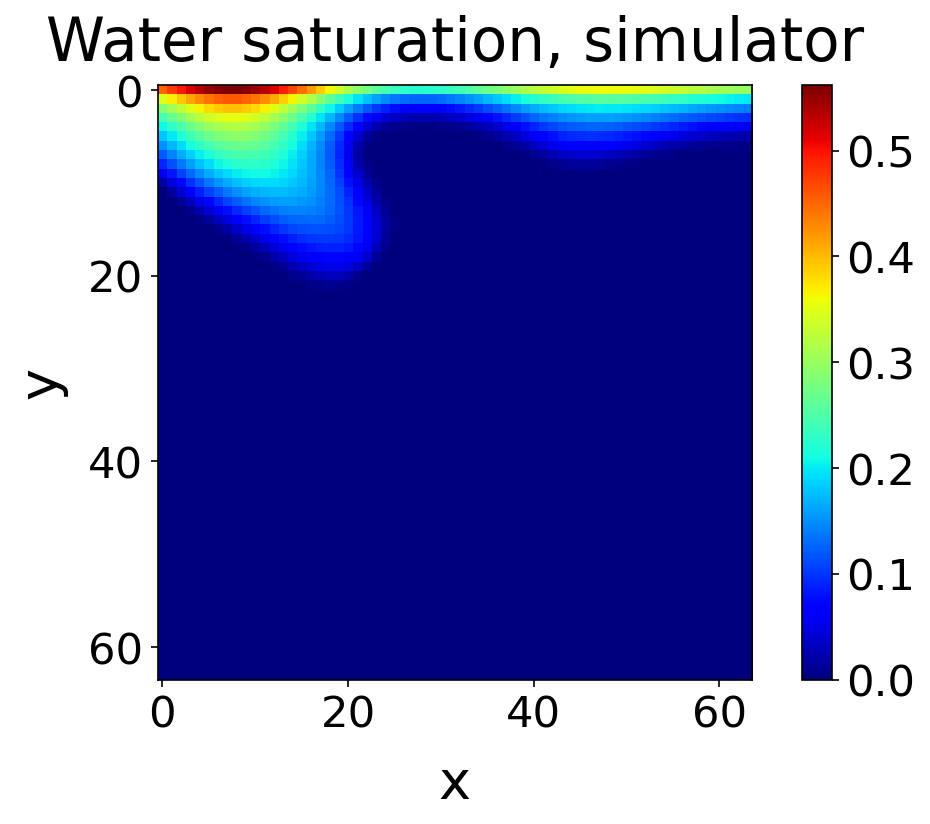

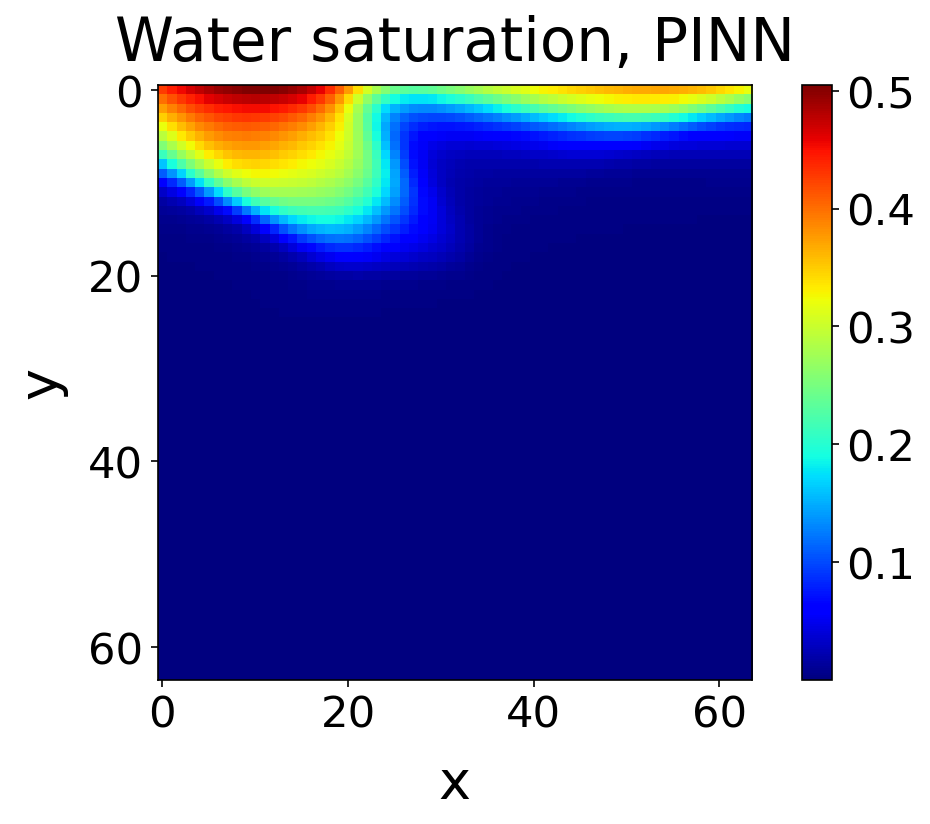

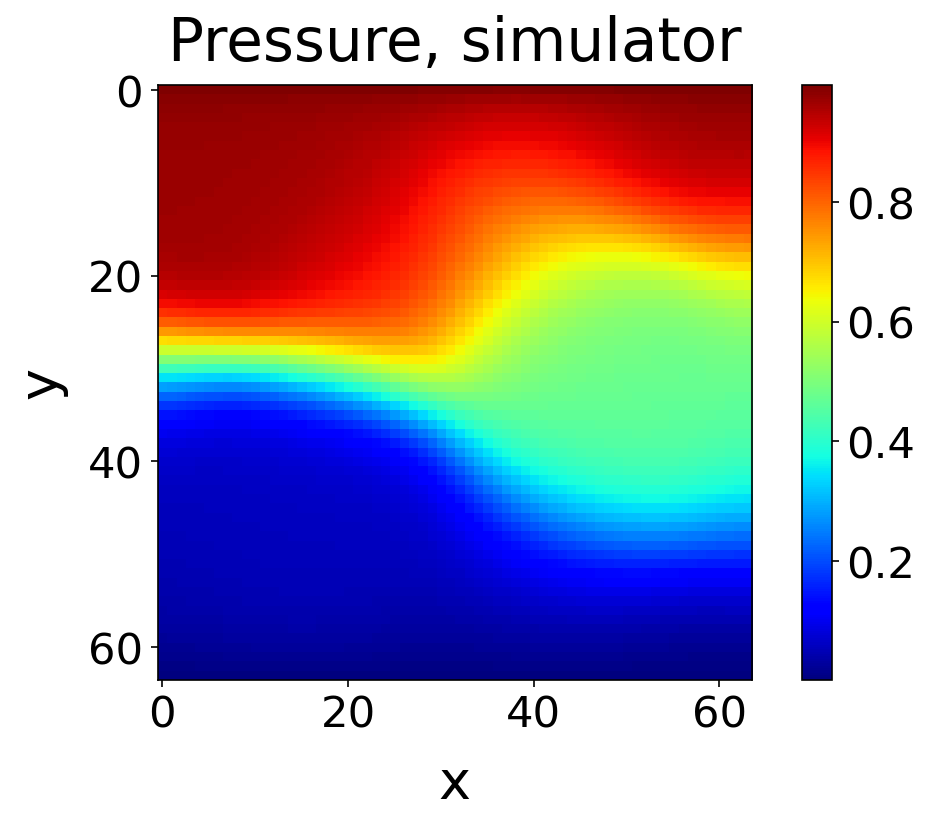

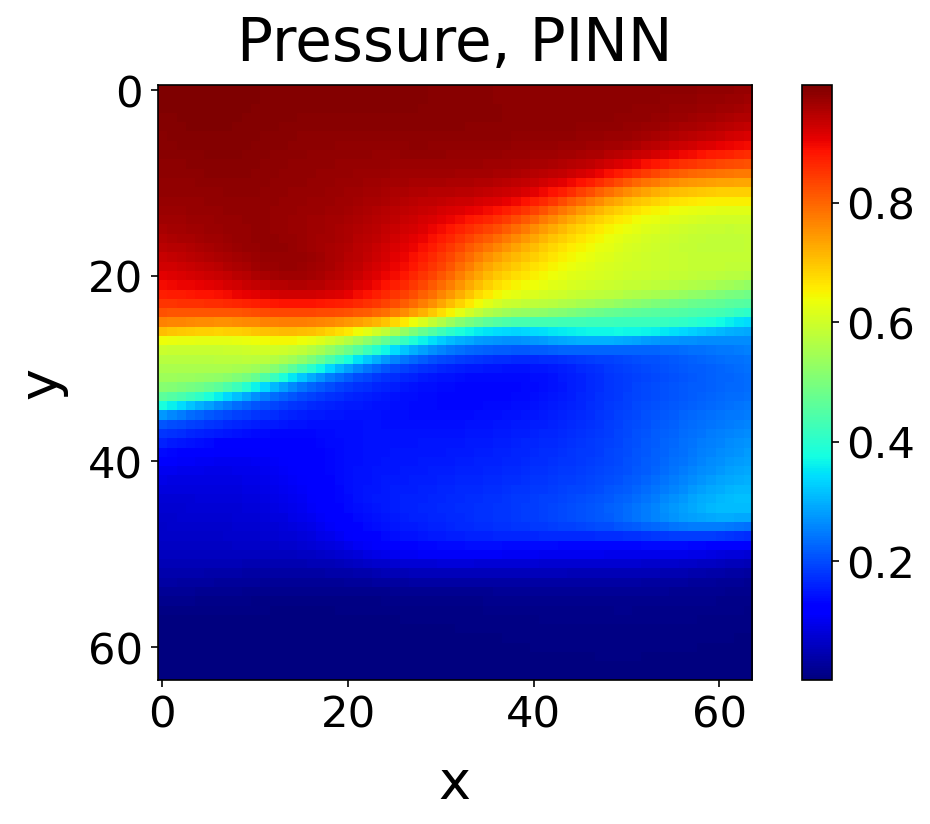

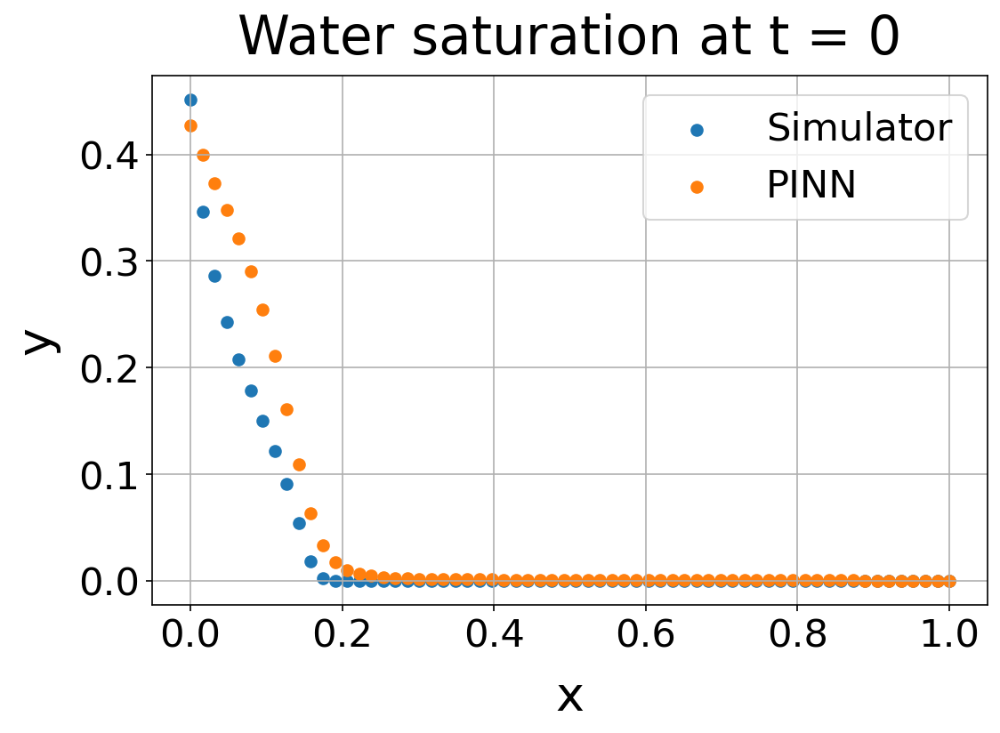

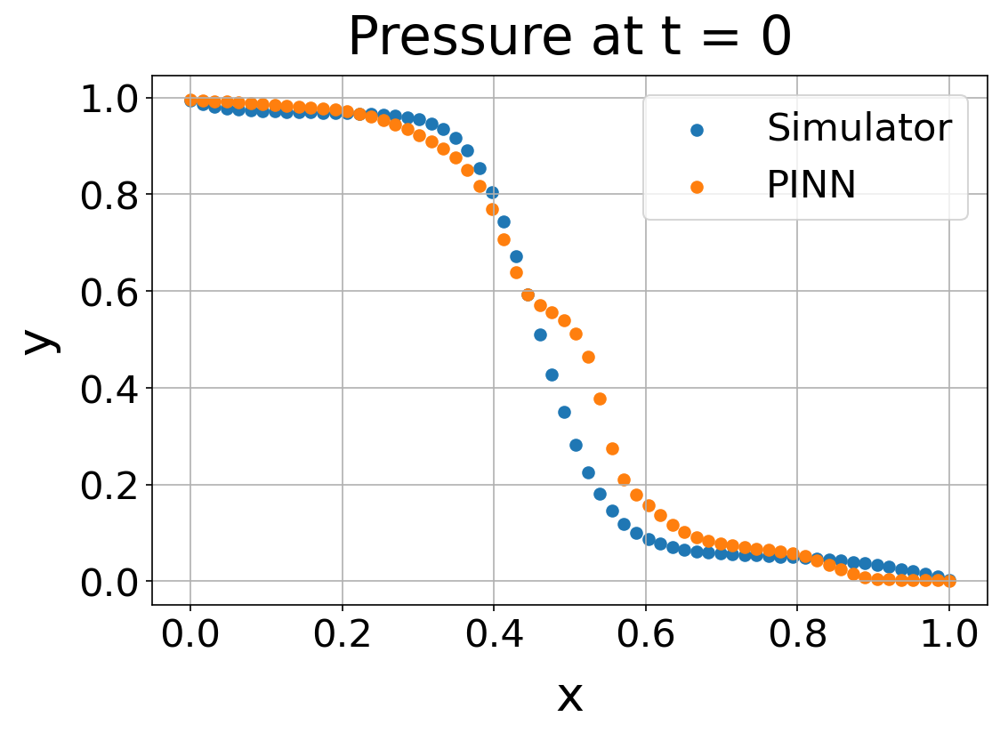

0

In [45]:
# model = pinn_model().to(DEVICE)
# model.load_state_dict(torch.load('pinn-test4-500.pth'))
model.eval()

main_new(model)

# SVR

# Test results random from simulation

In [50]:
def build_metrics(model_prediction, pres, swat, soil, process):

    metrics = ['MSE', 'MAE', 'R_2', 'RMSE', 'MAPE']
    
    # Saturation water
    satur = [
        np.mean((model_prediction[:, 2] - swat) ** 2),  # MSE
        np.mean(np.abs(model_prediction[:, 2] - swat)), # MAE
        r2_score(swat, model_prediction[:, 2]),         # R^2
        np.sqrt(np.mean((model_prediction[:, 2] - swat) ** 2)), # RMSE
        np.mean(np.abs((swat - model_prediction[:, 2]) / (swat + 1e-8))) * 100  # MAPE (%)
    ]
    
    # Pressure
    press = [
        np.mean((model_prediction[:, 0] - pres) ** 2),
        np.mean(np.abs(model_prediction[:, 0] - pres)),
        r2_score(pres, model_prediction[:, 0]),
        np.sqrt(np.mean((model_prediction[:, 0] - pres) ** 2)),
        np.mean(np.abs((pres - model_prediction[:, 0]) / (pres + 1e-8))) * 100
    ]
    
    # Saturation oil
    sat_oil = [
        np.mean((model_prediction[:, 1] - soil) ** 2),
        np.mean(np.abs(model_prediction[:, 1] - soil)),
        r2_score(soil, model_prediction[:, 1]),
        np.sqrt(np.mean((model_prediction[:, 1] - soil) ** 2)),
        np.mean(np.abs((soil - model_prediction[:, 1]) / (soil + 1e-8))) * 100
    ]
    
    # Combine into dataframe
    metrics_df = pd.DataFrame({
        f'Metrics {process}': metrics,
        f'Saturation water {process}': satur,
        f'Saturation oil {process}': sat_oil,
        f'Pressure {process}': press
    })
    
    return metrics_df


In [51]:
def build_test_random(model, x_list=x_list, y_list=y_list, 
               t_list=t_list, pwat_rand=pwat_rand,
               poil_rand=poil_rand, kwat_rand=kwat_rand, 
               koil_rand=koil_rand, simulation_data=simulation_data, 
               dx=dx, dy=dy, dt=dt, rand_indexes=rand_indexes, test_size=100):

    N = simulation_data.shape[0] - rand_indexes.shape[0]
    test_indexes = np.random.randint(0, N, test_size)
    pres = np.delete(simulation_data[:, 0], rand_indexes)[test_indexes]
    swat = np.delete(simulation_data[:, 1], rand_indexes)[test_indexes]
    soil = np.delete(simulation_data[:, 2], rand_indexes)[test_indexes]

    x_list = np.delete(x_list, rand_indexes)[test_indexes] * dx
    y_list = np.delete(y_list, rand_indexes)[test_indexes] * dy
    t_list = np.delete(t_list, rand_indexes)[test_indexes] * dt

    pwat_rand = np.delete(pwat_rand, rand_indexes)[test_indexes]
    poil_rand = np.delete(poil_rand, rand_indexes)[test_indexes]
    kwat_rand = np.delete(kwat_rand, rand_indexes)[test_indexes]
    koil_rand = np.delete(koil_rand, rand_indexes)[test_indexes]

    X = np.column_stack([
        t_list.astype(np.float32),
        x_list.astype(np.float32),
        y_list.astype(np.float32),
        pwat_rand.astype(np.float32),
        poil_rand.astype(np.float32),
        kwat_rand.astype(np.float32),
        koil_rand.astype(np.float32),
    ])

    with torch.no_grad():
        X_t = torch.from_numpy(X).to(DEVICE)      # (N, 7)
        model_prediction = model(X_t).cpu().numpy()

    return model_prediction, pres, swat, soil


In [52]:
model_prediction, pres, swat, soil = build_test_random(model)
build_metrics(model_prediction, pres, swat, soil, 'test random')

,Metrics test random,Saturation water test random,Saturation oil test random,Pressure test random
0,MSE,5.784008e-02,0.057840,0.086780
1,MAE,1.968842e-01,0.196884,0.181964
2,R_2,-1.855489e+00,-1.855489,-0.027535
3,RMSE,2.404996e-01,0.240500,0.294585
4,MAPE,8.231407e+06,28.942998,361.946637


# Test result real sim

In [46]:
def build_test_sim(model, dt=0.15e-1, niter=100, 
                   perm=perm, dx=dx, dy=dy,
                   pwat=1.5, poil=2.0, 
                   kwat=1.5, koil=0.3,
                   vr=0.3):
    
    pwat_list = pwat * torch.ones(64 * 64)
    poil_list = poil * torch.ones(64 * 64)
    kwat_list = kwat * torch.ones(64 * 64)
    koil_list = koil * torch.ones(64 * 64)
    
    
    swat = np.zeros((nx0, nx1, nx2))
    soil = np.ones((nx0, nx1, nx2))
    
    
    pres, swat, soil = compute_solution(perm, poro,
                                        dx0, dx1, dx2, dt * niter, niter,
                                        pwat, kwat, poil, koil, vr,
                                        pmin=0.0, pmax=1.0)
    
    time_for_model = (niter * dt) * torch.ones(64 * 64)
    x_for_model = dx0 * torch.arange(64)
    y_for_model = dx1 * torch.arange(64)
    cartesian_points = torch.cartesian_prod(x_for_model, y_for_model)
    
    model_prediction = model(
        torch.stack(
            (time_for_model, 
             cartesian_points[:, 0], 
             cartesian_points[:, 1],
             pwat_list,
             poil_list,
             kwat_list,
             koil_list), -1).to(DEVICE))
    
    model_prediction = model_prediction.cpu().detach().numpy()

    return model_prediction, pres, swat, soil

In [53]:
model_prediction, pres, swat, soil = build_test_sim(model, dt=0.15e-1, niter=100,)


sw_pred = model_prediction[:, 2].reshape(nx0, nx1, nx2)[:, 0, 0]
sw_true = swat[:, 0, 0, -1]

so_pred = model_prediction[:, 1].reshape(nx0, nx1, nx2)[:, 0, 0]
so_true = soil[:, 0, 0, -1]

p_pred  = model_prediction[:, 0].reshape(nx0, nx1, nx2)[:, 0, 0]
p_true  = pres[:, 0, 0, -1]

metrics = ['MSE', 'MAE', 'R_2', 'RMSE', 'MAPE']

# Helper to compute all metrics with safe MAPE
def all_metrics(y_true, y_pred, eps=1e-8):
    mse  = np.mean((y_pred - y_true) ** 2)
    mae  = np.mean(np.abs(y_pred - y_true))
    r2   = r2_score(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_true - y_pred) / (np.abs(y_true) + eps))) * 100.0
    return [mse, mae, r2, rmse, mape]

# Build columns
satur = all_metrics(sw_true, sw_pred)   # Saturation water
sat_oil = all_metrics(so_true, so_pred)   # Saturation oil
press = all_metrics(p_true,  p_pred)    # Pressure

# Combine into dataframe
metrics_df = pd.DataFrame({
    f'Metrics test': metrics,
    f'Saturation test': satur,
    f'Saturation oil test': sat_oil,
    f'Pressure test': press
})

metrics_df

,Metrics test,Saturation test,Saturation oil test,Pressure test
0,MSE,1.217314e-03,0.001217,0.004235
1,MAE,1.494888e-02,0.014949,0.038398
2,R_2,8.488651e-01,0.848865,0.976372
3,RMSE,3.489002e-02,0.034890,0.065080
4,MAPE,6.550856e+06,1.826609,31.609208
